<a href="https://colab.research.google.com/github/lorenzo-arcioni/Computer-Science-Sapienza/blob/main/Computer%20Vision/project/results_eda.ipynb" target="_blank"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analisi Esplorativa dei Dati - Hyperparameter Tuning YOLOv11

## 1. Caricamento e Preprocessing dei Dati

In questa sezione carichiamo i risultati degli esperimenti di hyperparameter tuning e le relative configurazioni. Il dataset combina:
- Risultati di training/validation per ogni epoca
- Configurazioni degli iperparametri (batch size, learning rate, optimizer, etc.)
- Informazioni sui fold di cross-validation
- Metriche di performance (precision, recall, mAP50, F1-score)

In [ ]:
import pandas as pd
import numpy as np
import os
import re
import yaml
from pathlib import Path

def load_config_file(config_path):
    """
    Carica un file di configurazione YAML.
    
    Args:
        config_path: Percorso al file di configurazione
    
    Returns:
        dict: Dizionario con le configurazioni
    """
    try:
        with open(config_path, 'r') as file:
            config = yaml.safe_load(file)
            return config
    except Exception as e:
        print(f"   ⚠️ Errore caricando config {config_path}: {e}")
        return {}

def find_config_file(run_code, configs_directory="configs"):
    """
    Trova il file di configurazione corrispondente a un run_code.
    
    Args:
        run_code: Codice del run (es. vo45708b)
        configs_directory: Directory contenente i config files
    
    Returns:
        str or None: Percorso al file di configurazione se trovato
    """
    if not os.path.exists(configs_directory):
        return None
        
    # Cerca file che contengono il run_code
    for config_file in os.listdir(configs_directory):
        if config_file.endswith('.yaml') and run_code in config_file:
            return os.path.join(configs_directory, config_file)
    
    return None

def extract_config_info(config_data):
    """
    Estrae le informazioni rilevanti dal config file.
    
    Args:
        config_data: Dizionario con i dati di configurazione
    
    Returns:
        dict: Dizionario con le informazioni estratte
    """
    config_info = {
        'batch_size': None,
        'dropout': None,
        'lr0': None,
        'lrf': None,
        'momentum': None,
        'optimizer': None,
        'weight_decay': None
    }
    
    if not config_data:
        return config_info
    
    # Funzione helper per estrarre valore dalla struttura {key: {value: actual_value}}
    def get_value(data, key):
        if key in data:
            if isinstance(data[key], dict) and 'value' in data[key]:
                return data[key]['value']
            else:
                return data[key]
        return None
    
    # Estrai le informazioni dalla struttura YAML con 'value'
    config_info['batch_size'] = get_value(config_data, 'batch')
    config_info['dropout'] = get_value(config_data, 'dropout')
    config_info['lr0'] = get_value(config_data, 'lr0')
    config_info['lrf'] = get_value(config_data, 'lrf')
    config_info['momentum'] = get_value(config_data, 'momentum')
    config_info['optimizer'] = get_value(config_data, 'optimizer')
    config_info['weight_decay'] = get_value(config_data, 'weight_decay')
    
    return config_info

def load_all_results_to_dataframe(base_directory="results", configs_directory="configs", models=['YOLOv11n', 'YOLOv11s']):
    """
    Carica tutti i CSV dai risultati degli sweep in un singolo DataFrame,
    includendo le informazioni dai config files.
    
    Args:
        base_directory: Directory base contenente le cartelle dei modelli
        configs_directory: Directory contenente i config files YAML
    
    Returns:
        pandas.DataFrame: DataFrame combinato con tutti i risultati e configurazioni
    """
    
    all_data = []
    config_data_list = []  # Lista per i dati di configurazione
    
    # Scorri tutte le directory dei modelli
    for model_dir in [base_directory + '/' + f for f in models]:
        model_path = os.path.join(base_directory, model_dir)
        
        if not os.path.isdir(model_path):
            continue
            
        print(f"🔍 Processando modello: {model_dir}")
        
        # Scorri tutti i file CSV nella directory del modello
        csv_files = [f for f in os.listdir(model_path) if f.endswith('.csv')]
        print(f"   📁 Trovati {len(csv_files)} file CSV")
        
        for csv_file in csv_files:
            # Estrai informazioni dal nome del file
            # Formato: nome-sweep-X_codice_foldY_log_vZ_results.csv
            match = re.match(r'(.+?)_([a-z0-9]+)_(fold\d+)_log_v\d+_results\.csv', csv_file)
            
            if not match:
                print(f"   ⚠️ Formato nome file non riconosciuto: {csv_file}")
                continue
                
            run_name = match.group(1)
            run_code = match.group(2)
            fold = match.group(3)
            
            # Carica il CSV
            csv_path = os.path.join(model_path, csv_file)
            try:
                df = pd.read_csv(csv_path)
                
                # Aggiungi le colonne identificative
                df['model'] = model_dir
                df['run_name'] = run_name
                df['run_code'] = run_code
                df['fold'] = fold
                df['fold_number'] = int(fold.replace('fold', ''))
                
                # Aggiungi alla lista
                all_data.append(df)
                
                print(f"   ✅ Caricato: {csv_file} ({len(df)} righe)")
                
            except Exception as e:
                print(f"   ❌ Errore caricando {csv_file}: {e}")
    
    if not all_data:
        print("❌ Nessun dato trovato!")
        return pd.DataFrame()
    
    # Combina tutti i DataFrame
    combined_df = pd.concat(all_data, ignore_index=True)
    
    # Ora carica le configurazioni e crea un DataFrame separato
    print(f"\n🔧 Caricando configurazioni...")
    unique_run_codes = combined_df['run_code'].unique()
    
    for run_code in unique_run_codes:
        config_file_path = find_config_file(run_code, configs_directory)
        if config_file_path:
            print(f"   🔧 Trovato config per {run_code}: {os.path.basename(config_file_path)}")
            config_data = load_config_file(config_file_path)
            config_info = extract_config_info(config_data)
            config_info['run_code'] = run_code  # Aggiungi la chiave per il join
            config_data_list.append(config_info)
        else:
            print(f"   ⚠️ Config non trovato per run_code: {run_code}")
            # Crea una configurazione vuota
            empty_config = extract_config_info({})
            empty_config['run_code'] = run_code
            config_data_list.append(empty_config)
    
    # Crea DataFrame delle configurazioni
    if config_data_list:
        config_df = pd.DataFrame(config_data_list)
        
        # Fai il merge con il DataFrame principale
        combined_df = combined_df.merge(config_df, on='run_code', how='left')
        
        # Riordina le colonne mettendo le identificative e di config all'inizio
        id_columns = ['model', 'run_name', 'run_code', 'fold', 'fold_number']
        config_columns = ['batch_size', 'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay']
        other_columns = [col for col in combined_df.columns if col not in id_columns + config_columns]
        combined_df = combined_df[id_columns + config_columns + other_columns]
    
    print(f"\n🎉 DataFrame combinato creato!")
    print(f"   📊 Totale righe: {len(combined_df)}")
    print(f"   📈 Modelli: {combined_df['model'].nunique()}")
    print(f"   🏃 Run unici: {combined_df['run_code'].nunique()}")
    print(f"   📂 Fold: {sorted(combined_df['fold'].unique())}")
    print(f"   🔧 Config caricati: {len(config_data_list)}")
    
    return combined_df

def get_summary_statistics(df):
    """
    Genera statistiche riassuntive del dataset.
    
    Args:
        df: DataFrame combinato
    
    Returns:
        dict: Dizionario con statistiche
    """
    
    summary = {
        'total_rows': len(df),
        'total_models': df['model'].nunique(),
        'total_runs': df['run_code'].nunique(),
        'models_list': df['model'].unique().tolist(),
        'runs_per_model': df.groupby('model')['run_code'].nunique().to_dict(),
        'epochs_per_run_fold': df.groupby(['run_code', 'fold'])['epoch'].count().describe(),
        'max_epochs': df.groupby(['run_code', 'fold'])['epoch'].max().describe()
    }
    
    # Aggiungi statistiche sui config
    config_columns = ['batch_size', 'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay']
    for col in config_columns:
        if col in df.columns:
            summary[f'{col}_unique_values'] = df[col].nunique()
            summary[f'{col}_missing'] = df[col].isnull().sum()
    
    return summary

def show_config_summary(df):
    """
    Mostra un riassunto delle configurazioni caricate.
    
    Args:
        df: DataFrame combinato
    """
    config_columns = ['batch_size', 'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay']
    
    print(f"\n🔧 Riassunto Configurazioni:")
    for col in config_columns:
        if col in df.columns:
            unique_values = df[col].dropna().unique()
            missing_count = df[col].isnull().sum()
            print(f"   {col}:")
            print(f"      Valori unici: {len(unique_values)} ({list(unique_values)[:5]}{'...' if len(unique_values) > 5 else ''})")
            print(f"      Valori mancanti: {missing_count}/{len(df)} ({missing_count/len(df)*100:.1f}%)")

# Carica tutti i dati
df = load_all_results_to_dataframe("results", "configs", ['YOLOv11n', 'YOLOv11s'])

if not df.empty:
    # Mostra informazioni base
    print(f"\n📋 Struttura DataFrame:")
    print(f"   Shape: {df.shape}")
    print(f"   Colonne: {list(df.columns)}")
    
    # Mostra riassunto configurazioni
    show_config_summary(df)
    
    # Mostra alcuni esempi
    print(f"\n🔍 Prime 5 righe:")
    print(df.head())

    # Statistiche riassuntive
    print(f"\n📊 Statistiche per modello:")
    print(df.groupby(['model', 'run_name', 'fold']).size().head(10))
    
    # Salva il DataFrame combinato
    output_path = "combined_results_with_configs.csv"
    df.to_csv(output_path, index=False)
    print(f"\n💾 DataFrame salvato in: {output_path}")
    
    # Genera statistiche
    stats = get_summary_statistics(df)
    print(f"\n📈 Statistiche riassuntive:")
    for key, value in stats.items():
        if key not in ['epochs_per_run_fold', 'max_epochs']:
            print(f"   {key}: {value}")

🔍 Processando modello: YOLOv8n
   📁 Trovati 0 file CSV
🔍 Processando modello: MobileNetv3-SSD320
   📁 Trovati 0 file CSV
🔍 Processando modello: YOLOv11s
   📁 Trovati 240 file CSV
   ✅ Caricato: celestial-sweep-37_yzna6anl_fold0_log_v137_results.csv (79 righe)
   ✅ Caricato: frosty-sweep-60_vo45708b_fold0_log_v159_results.csv (63 righe)
   ✅ Caricato: dutiful-sweep-39_qgpy2wrg_fold2_log_v142_results.csv (77 righe)
   ✅ Caricato: eternal-sweep-31_4seovufw_fold2_log_v134_results.csv (80 righe)
   ✅ Caricato: polished-sweep-16_bfw8nbe4_fold1_log_v118_results.csv (93 righe)
   ✅ Caricato: morning-sweep-43_ubs0gihx_fold1_log_v145_results.csv (75 righe)
   ✅ Caricato: stoic-sweep-20_2lp7qswl_fold2_log_v123_results.csv (77 righe)
   ✅ Caricato: peach-sweep-34_8d6gcev0_fold2_log_v137_results.csv (40 righe)
   ✅ Caricato: restful-sweep-30_y98lod68_fold1_log_v132_results.csv (74 righe)
   ✅ Caricato: feasible-sweep-13_srv4z7sp_fold2_log_v116_results.csv (75 righe)
   ✅ Caricato: smart-sweep-4_wk2

In [2]:
# Mostra tutte le righe
pd.set_option("display.max_rows", 1000)

# Mostra tutte le colonne
pd.set_option("display.max_columns", 27)

df["time"]

0          40.6471
1          79.9075
2         117.5560
3         157.7070
4         194.9890
           ...    
34672    2294.9900
34673    2313.6700
34674    2332.3500
34675    2351.4400
34676    2370.2300
Name: time, Length: 34677, dtype: float64

In [3]:
df.columns

Index(['model', 'run_name', 'run_code', 'fold', 'fold_number', 'batch_size',
       'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay',
       'epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')

In [4]:
df.head()

,model,run_name,run_code,fold,fold_number,batch_size,dropout,lr0,lrf,momentum,optimizer,weight_decay,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,YOLOv11s,celestial-sweep-37,yzna6anl,fold0,0,16,0.202726,0.003023,0.037171,0.454304,auto,0.002435,1,40.6471,2.41953,3.62372,1.85209,0.28003,0.33581,0.24089,0.09308,2.31746,2.70315,1.86615,0.000471,0.000471,0.000471
1,YOLOv11s,celestial-sweep-37,yzna6anl,fold0,0,16,0.202726,0.003023,0.037171,0.454304,auto,0.002435,2,79.9075,2.34299,2.51042,1.79389,0.16645,0.19447,0.14005,0.05742,2.43775,32.95540,2.08837,0.000939,0.000939,0.000939
2,YOLOv11s,celestial-sweep-37,yzna6anl,fold0,0,16,0.202726,0.003023,0.037171,0.454304,auto,0.002435,3,117.5560,2.35795,2.46417,1.79652,0.25922,0.32022,0.20727,0.08388,2.47285,3.42500,2.04648,0.001397,0.001397,0.001397
3,YOLOv11s,celestial-sweep-37,yzna6anl,fold0,0,16,0.202726,0.003023,0.037171,0.454304,auto,0.002435,4,157.7070,2.31951,2.37628,1.79275,0.32313,0.29758,0.23116,0.08984,2.40032,2.52221,1.87071,0.001388,0.001388,0.001388
4,YOLOv11s,celestial-sweep-37,yzna6anl,fold0,0,16,0.202726,0.003023,0.037171,0.454304,auto,0.002435,5,194.9890,2.26879,2.30996,1.76410,0.31751,0.33333,0.28080,0.11132,2.31447,2.29621,1.80913,0.001374,0.001374,0.001374


### Preprocessing delle Metriche

Applichiamo alcune trasformazioni per migliorare l'analisi:
- **Normalizzazione delle epoche**: Per confrontare run con diversa durata
- **Calcolo F1-score**: Se non presente, calcolato da precision e recall
- **Gestione valori infiniti**: Sostituiti con media locale per stabilizzare le loss
- **Tempo di training per epoca**: Calcolato come differenza tra timestamp consecutivi

In [5]:
def replace_inf_with_local_mean(df, cols):
    """
    Sostituisce valori inf o -inf in un dataframe con la media dei vicini (precedente e successivo).
    Se il vicino non esiste, copia il valore disponibile.
    
    Args:
        df (pd.DataFrame): dataframe da processare
        cols (list): colonne da trattare
    Returns:
        df aggiornato
    """
    df = df.copy()
    
    for col in cols:
        if col not in df.columns:
            continue

        # Trova valori inf/-inf
        mask_inf = df[col].isin([np.inf, -np.inf])
        inf_indices = np.where(mask_inf)[0]

        for idx in inf_indices:
            prev_val = df[col].iloc[idx-1] if idx > 0 else np.nan
            next_val = df[col].iloc[idx+1] if idx < len(df[col])-1 else np.nan

            # Scegli la media dei vicini se entrambi validi, altrimenti il valore disponibile
            neighbors = [v for v in [prev_val, next_val] if pd.notna(v) and not np.isinf(v)]
            if neighbors:
                df.at[idx, col] = np.mean(neighbors)
            else:
                # se nessun vicino valido, sostituisci con 0
                df.at[idx, col] = 0

    return df

# === Normalizzazione epoche per run e fold ===
df['normalized_epoch'] = df.groupby(['run_code', 'fold'])['epoch'].transform(
    lambda x: (x - x.min()) / (x.max() - x.min()) if x.max() > x.min() else 0
)

# === Tempo di training effettivo per epoca ===
df['training_time'] = df.groupby(['run_code', 'fold'])['time'].diff().fillna(df['time'])

# === F1-score se non presente ===
if 'metrics/f1(B)' not in df.columns:
    df['metrics/f1(B)'] = 2 * (df['metrics/precision(B)'].astype(float) * df['metrics/recall(B)'].astype(float)) / \
                              (df['metrics/precision(B)'].astype(float) + df['metrics/recall(B)'].astype(float) + 1e-8)

# === Tutte le colonne di loss da processare ===
loss_cols = [c for c in df.columns if 'loss' in c]

# Sostituisci eventuali valori inf nelle loss
df = replace_inf_with_local_mean(df, loss_cols)

# Define key metrics
key_metrics = [metric for metric in df.columns if metric.startswith('metrics/')]
models = list(df.model.unique())
optimizers = list(df.optimizer.unique())

### Iniziamo l'analisi esplorativa dei dati

Importiamo innanzitutto le librerie necessarie e definizmo alcune costanti e funzioni utili.

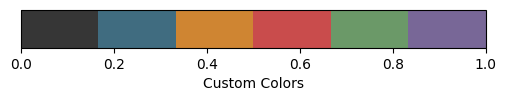

In [88]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from matplotlib.lines import Line2D
from scipy.stats import gaussian_kde
import seaborn as sns

COLORS = {
    "gray": "#363636",
    "blue": "#406c80",
    "orange": "#cf8532",
    "red": "#c94c4c",
    "green": "#6B9968",
    "purple": "#786797"
}

# Creazione della colormap
custom_cmap = ListedColormap([COLORS['gray'], COLORS['blue'], COLORS['orange'],
                              COLORS['red'], COLORS['green'], COLORS['purple']],
                             name='custom_colors')

# Visualizzazione della colormap
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

# Mostra la colormap
cb = plt.colorbar(plt.cm.ScalarMappable(cmap=custom_cmap),
                  cax=ax, orientation='horizontal')
cb.set_label('Custom Colors')
plt.show()

def print_color(text, color="green"):
    colors = {
        "green": "\033[92m",
        "red": "\033[91m",
        "blue": "\033[94m",
        "yellow": "\033[93m"
    }
    print(f"{colors.get(color, '')}{text}\033[0m")

## 2. Distribuzione degli Iperparametri

### 2.1 Distribuzione Batch Size per Modello

Analizziamo come sono distribuiti i valori di batch size tra i diversi run e modelli. Questo grafico mostra il numero di esperimenti condotti per ogni combinazione di modello e batch size.

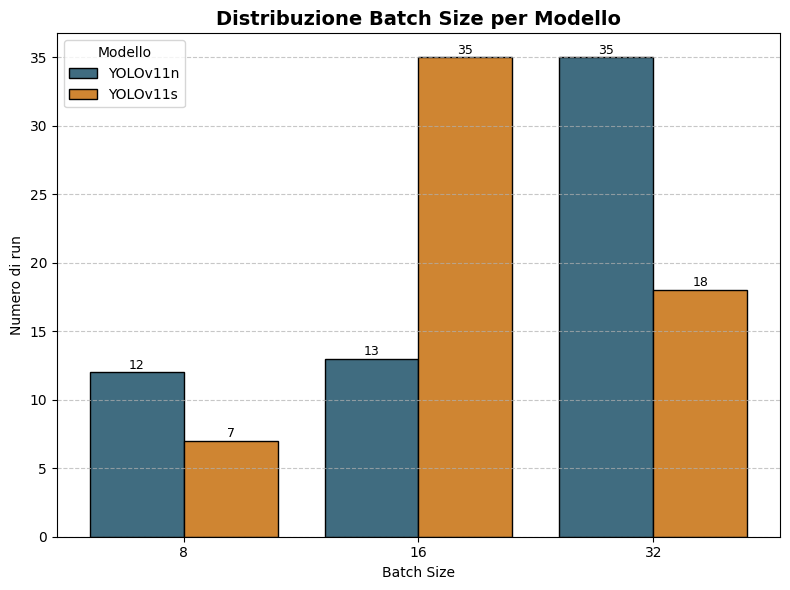

In [7]:
def plot_batch_distribution_bar_multiple(df):
    """
    Mostra la distribuzione di 'batch_size' come diagramma a barre multiple,
    una barra per modello per ogni batch size, con numero di run sopra ogni barra.

    Args:
        df (pd.DataFrame): deve contenere ['run_code', 'model', 'batch_size']
    """
    # Prendi ultimo valore di batch per ogni run
    run_batch = df.groupby(["run_code", "model"], as_index=False)["batch_size"].last()

    # Lista batch size unici ordinati
    batch_sizes = sorted(run_batch["batch_size"].unique())
    models = run_batch["model"].unique()
    n_models = len(models)
    x = range(len(batch_sizes))
    width = 0.8 / n_models  # larghezza barre affiancate

    fig, ax = plt.subplots(figsize=(8, 6))

    # Colori ciclici per modelli
    color_list = [COLORS["blue"], COLORS["orange"], COLORS["red"], COLORS["green"], COLORS["gray"]]
    
    for i, model in enumerate(models):
        model_data = run_batch[run_batch["model"] == model]
        counts = model_data["batch_size"].value_counts().reindex(batch_sizes, fill_value=0)

        bars = ax.bar(
            [pos + i*width for pos in x],
            counts.values,
            width=width,
            color=color_list[i % len(color_list)],
            edgecolor="black",
            label=model
        )

        # Numeri sopra le barre
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2, height + 0.05, f"{int(height)}",
                    ha="center", va="bottom", fontsize=9)

    # Etichette asse X centrate
    ax.set_xticks([pos + width*(n_models/2 - 0.5) for pos in x])
    ax.set_xticklabels(batch_sizes)
    ax.set_xlabel("Batch Size")
    ax.set_ylabel("Numero di run")
    ax.set_title("Distribuzione Batch Size per Modello", fontsize=14, fontweight="bold")
    ax.grid(axis="y", linestyle="--", alpha=0.7)
    ax.legend(title="Modello")

    plt.tight_layout()
    plt.show()

# --- Uso ---
plot_batch_distribution_bar_multiple(df)

### 2.2 Distribuzione Optimizer per Modello

Visualizziamo la distribuzione degli optimizer utilizzati negli esperimenti. Ogni barra rappresenta il numero di run che hanno utilizzato un particolare optimizer per ciascun modello.

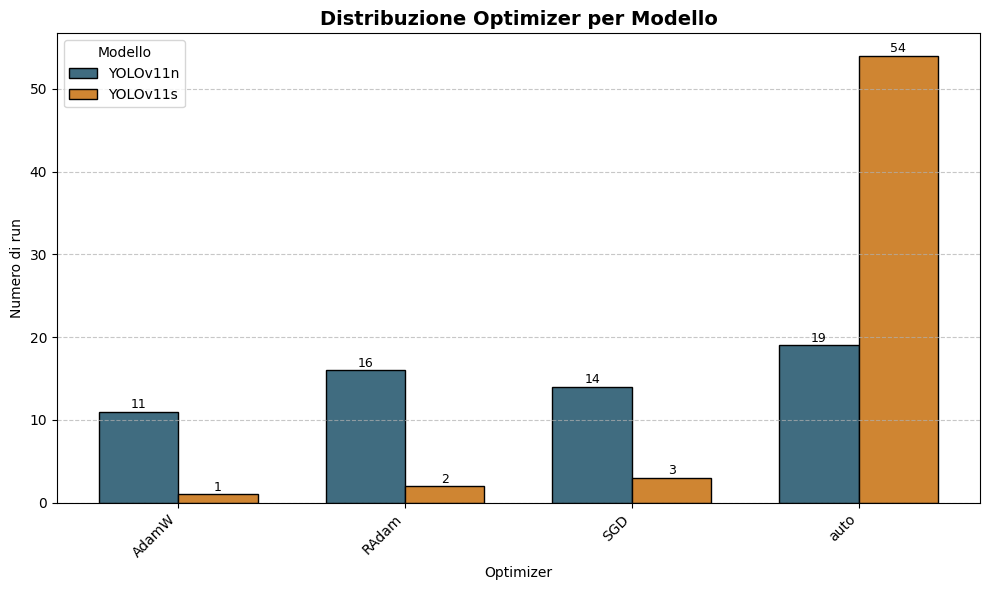

In [8]:
def plot_optimizer_distribution_grouped(df):
    """
    Mostra la distribuzione degli optimizer come diagramma a barre multiple,
    con barre blu e arancio per i modelli e numeri sopra ogni barra.
    
    Args:
        df (pd.DataFrame): deve contenere ['run_code', 'model', 'optimizer']
    """
    # Prendi l'ultimo optimizer per ogni run
    run_opts = df.groupby(["run_code", "model"], as_index=False)["optimizer"].last()

    # Tabella pivot: optimizer x model
    counts = run_opts.groupby(["optimizer", "model"]).size().unstack(fill_value=0)

    optimizers = counts.index
    models = counts.columns
    x = range(len(optimizers))
    width = 0.35  # larghezza barre

    fig, ax = plt.subplots(figsize=(10, 6))

    # Disegna barre affiancate (blu e arancio per i modelli)
    colors = [COLORS["blue"], COLORS["orange"]]
    for i, model in enumerate(models):
        bars = ax.bar(
            [pos + i * width for pos in x],
            counts[model],
            width=width,
            label=model,
            color=colors[i % 2],
            edgecolor="black"
        )
        # Etichette sopra ogni barra
        for bar in bars:
            height = bar.get_height()
            ax.text(
                bar.get_x() + bar.get_width()/2,
                height + 0.05,
                f"{int(height)}",
                ha="center", va="bottom", fontsize=9
            )

    # Etichette asse X centrate
    ax.set_xticks([pos + width / 2 for pos in x])
    ax.set_xticklabels(optimizers, rotation=45, ha="right")

    # Titolo e assi
    ax.set_title("Distribuzione Optimizer per Modello", fontsize=14, fontweight="bold")
    ax.set_xlabel("Optimizer")
    ax.set_ylabel("Numero di run")
    ax.grid(axis="y", linestyle="--", alpha=0.7)

    # Legenda
    ax.legend(title="Modello")

    plt.tight_layout()
    plt.show()

# --- Uso ---
plot_optimizer_distribution_grouped(df)

### 2.3 Distribuzione Learning Rate (lr0 e lrf)

I boxplot mostrano la distribuzione dei valori di learning rate iniziale (lr0) e finale (lrf) per ogni modello. Le scatole rappresentano i quartili, i punti verdi indicano la media e la linea nera la mediana.

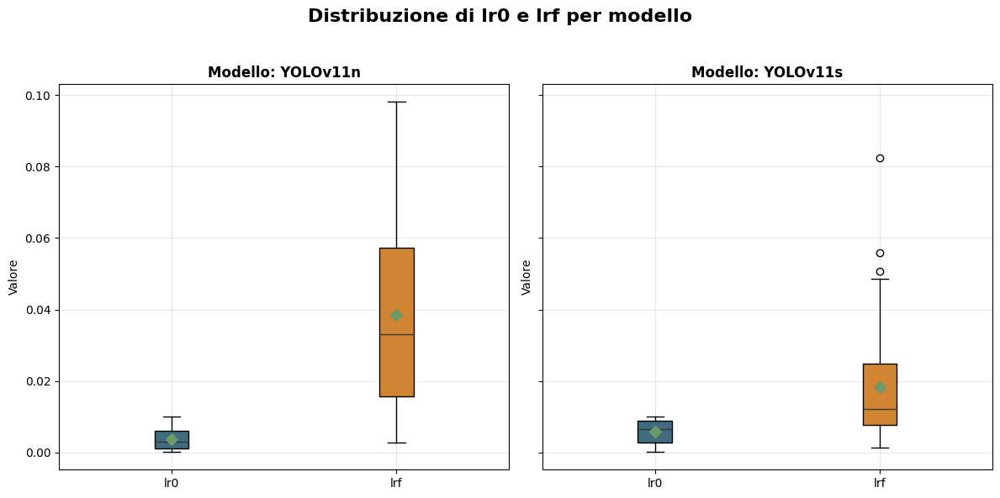

In [9]:
def plot_lr0_lrf_distribution_per_model(df):
    """
    Boxplot della distribuzione di lr0 e lrf per ogni modello.
    Raggruppa per run per evitare duplicati (valori ripetuti per epoche).

    Args:
        df (pd.DataFrame): DataFrame con colonne ['run_code', 'model', 'lr0', 'lrf']
    """
    # Collassa per run: prendi un valore per run (qui uso last, ma va bene anche first)
    run_lrs = df.groupby(["run_code", "model"], as_index=False)[["lr0", "lrf"]].last()

    models = run_lrs["model"].unique()
    n_models = len(models)

    fig, axes = plt.subplots(1, n_models, figsize=(6 * n_models, 6), sharey=True)

    if n_models == 1:
        axes = [axes]  # se c'è solo un modello, mantieni lista per iterare

    for ax, model in zip(axes, models):
        model_data = run_lrs[run_lrs["model"] == model]

        data = [model_data["lr0"].dropna().values,
                model_data["lrf"].dropna().values]

        labels = ["lr0", "lrf"]
        colors = [COLORS["blue"], COLORS["orange"]]

        # Boxplot
        bp = ax.boxplot(data, labels=labels, patch_artist=True,
                        medianprops=dict(color=COLORS["gray"], linewidth=1))

        # Colora i box
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)

        # Media (punto rosso)
        means = [d.mean() for d in data]
        ax.scatter(range(1, len(means)+1), means, color=COLORS["green"], marker="D", s=50, zorder=3)

        # Titolo e griglia
        ax.set_title(f"Modello: {model}", fontsize=12, fontweight="bold")
        ax.set_ylabel("Valore")
        ax.grid(True, alpha=0.3)

    plt.suptitle("Distribuzione di lr0 e lrf per modello", fontsize=16, fontweight="bold")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


# --- Uso ---
plot_lr0_lrf_distribution_per_model(df)

### 2.4 Distribuzione Altri Iperparametri

Analizziamo la distribuzione di dropout, weight decay e momentum utilizzando sia boxplot che violinplot per una visualizzazione più completa della densità di probabilità.

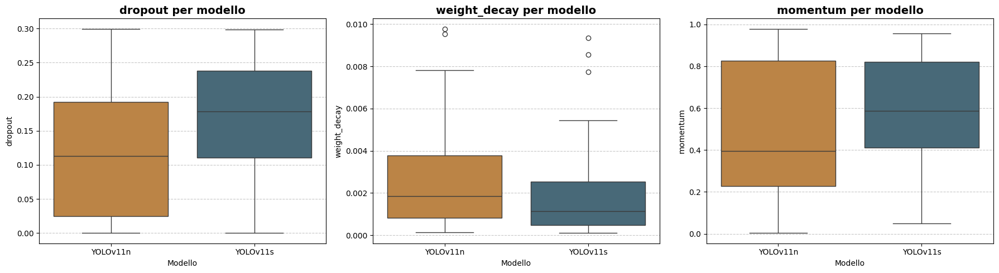

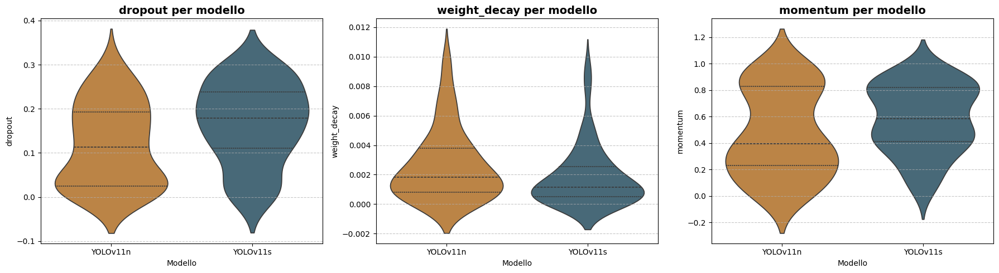

In [10]:
def plot_hyperparams_all(df, params=["dropout", "weight_decay", "momentum"], kind="box"):
    """
    Mostra la distribuzione di più iperparametri (dropout, weight_decay, momentum) per modello
    in un'unica figura con subplot.
    
    Args:
        df (pd.DataFrame): deve contenere ['run_code', 'model'] + params
        params (list of str): nomi delle colonne degli iperparametri
        kind (str): "box" o "violin"
    """
    n_params = len(params)
    fig, axes = plt.subplots(1, n_params, figsize=(6*n_params, 5), sharey=False)
    
    # Assicuriamoci che axes sia sempre una lista anche se n_params=1
    if n_params == 1:
        axes = [axes]
    
    # Palette dinamica per modelli
    models = df["model"].unique()
    color_list = [COLORS["blue"], COLORS["orange"], COLORS["red"], COLORS["green"], COLORS["gray"]]
    palette = {model: color_list[i % len(color_list)] for i, model in enumerate(models)}
    
    for ax, param in zip(axes, params):
        run_param = df.groupby(["run_code", "model"], as_index=False)[param].last()
        
        if kind == "box":
            sns.boxplot(
                data=run_param,
                x="model",
                y=param,
                hue="model",
                palette=palette,
                legend=False,
                ax=ax
            )
        elif kind == "violin":
            sns.violinplot(
                data=run_param,
                x="model",
                y=param,
                hue="model",
                palette=palette,
                legend=False,
                ax=ax,
                inner="quartile"
            )
        else:
            raise ValueError("kind deve essere 'box' o 'violin'")
        
        ax.set_title(f"{param} per modello", fontsize=14, fontweight="bold")
        ax.set_xlabel("Modello")
        ax.set_ylabel(param)
        ax.grid(axis="y", linestyle="--", alpha=0.7)
    
    plt.tight_layout()
    plt.show()

# --- Uso ---
plot_hyperparams_all(df, kind="box")
plot_hyperparams_all(df, kind="violin")

### 2.5 Distribuzioni Univariate

Visualizzazioni 1D con kernel density estimation per comprendere meglio la forma delle distribuzioni degli iperparametri. I punti neri e verdi indicano rispettivamente media e mediana.

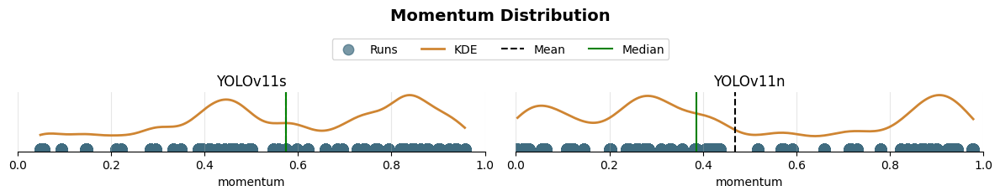

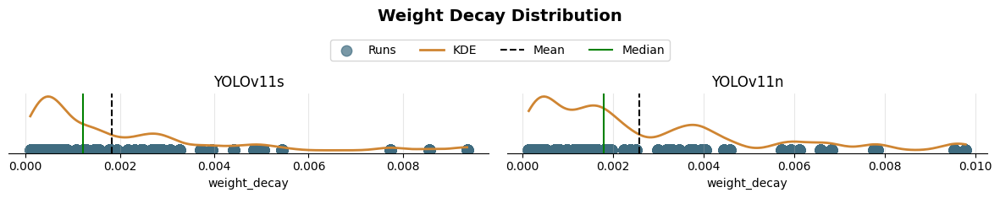

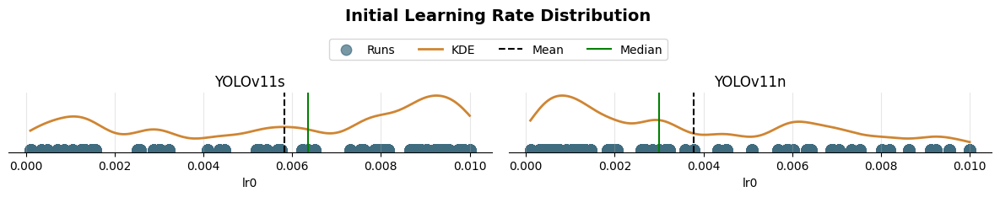

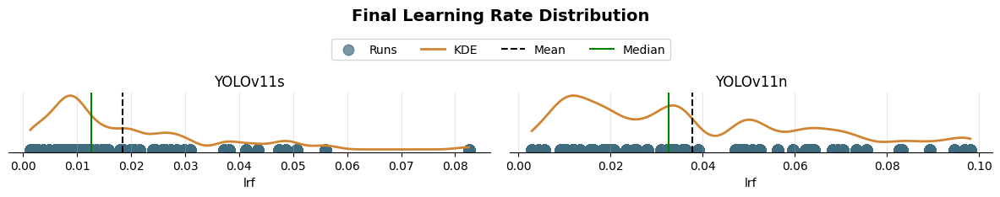

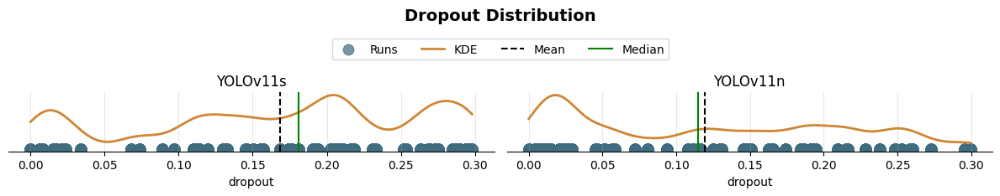

In [11]:
def plot_distribution_1d(df, model_col, value_col, title="Distribution", xlim=None):
    """
    Plot 1D dei valori di una variabile per ogni modello (o categoria) con KDE sovrapposta.
    Tutti i punti sono sull'asse x (y=0). Rimuove i bordi dei subplot tranne l'asse x.
    
    Args:
        df: DataFrame con almeno due colonne: una per i modelli/categorie e una per i valori
        model_col: nome della colonna dei modelli/categorie
        value_col: nome della colonna dei valori da plottare
        title: titolo generale del plot
        xlim: tupla (xmin, xmax) per limitare l'asse x, default None
    """
    models = df[model_col].unique()

    fig, axes = plt.subplots(1, len(models), figsize=(6*len(models), 2), sharey=True)
    if len(models) == 1:
        axes = [axes]

    for ax, model in zip(axes, models):
        values = df[df[model_col] == model][value_col].values

        # Tutti i punti hanno y=0
        ax.scatter(values, np.zeros_like(values), color=COLORS['blue'], s=80, alpha=0.7, label='Runs')

        # KDE per mostrare distribuzione
        if len(values) > 1:
            kde = gaussian_kde(values)
            x_grid = np.linspace(values.min(), values.max(), 200)
            density = kde(x_grid)
            density = density / density.max() * 0.2
            ax.plot(x_grid, density, color=COLORS['orange'], lw=2, label='KDE')

        # Media e mediana
        ax.axvline(values.mean(), color='black', linestyle='--', lw=1.5, label='Mean')
        ax.axvline(np.median(values), color='green', linestyle='-', lw=1.5, label='Median')

        ax.set_yticks([])
        ax.set_xlabel(value_col)
        ax.set_title(f'{model}')
        ax.grid(True, alpha=0.3)

        # Rimuovi spines verticali e superiore
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['bottom'].set_visible(True)

        # Limiti asse x
        if xlim is not None:
            ax.set_xlim(xlim)

    # Legenda esterna comune
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=4, bbox_to_anchor=(0.5, 1.0))
    
    plt.suptitle(title, fontsize=14, fontweight='bold', y=1.15)
    plt.tight_layout()
    plt.show()

# --- Esempio di uso ---
# df deve avere una colonna 'model' e una colonna con valori, es: 'momentum'
plot_distribution_1d(df, model_col='model', value_col='momentum', title="Momentum Distribution", xlim=(0, 1))
plot_distribution_1d(df, model_col='model', value_col='weight_decay', title="Weight Decay Distribution")
plot_distribution_1d(df, model_col='model', value_col='lr0', title="Initial Learning Rate Distribution")
plot_distribution_1d(df, model_col='model', value_col='lrf', title="Final Learning Rate Distribution")
plot_distribution_1d(df, model_col='model', value_col='dropout', title="Dropout Distribution")

## 3. Analisi Temporale del Training

### 3.1 Numero Medio di Epoche per Fold

Questo grafico mostra quante epoche in media sono state necessarie per ogni fold e modello, fornendo insight sulla stabilità del training across folds.

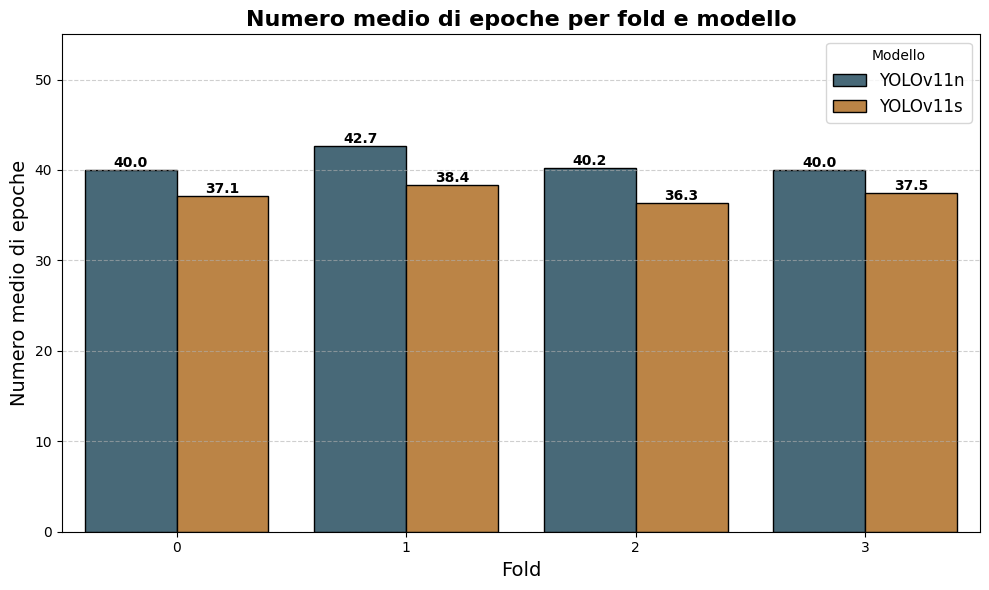

In [12]:
def plot_mean_epochs_per_fold(df):
    """
    Crea un barplot con il numero medio di epoche per ogni fold e modello.
    Si aspetta che df abbia le colonne: ['model', 'fold_number', 'epoch'].

    Args:
        df (pd.DataFrame): dataframe di input
    """
    # Calcolo numero medio di epoche per fold e modello
    mean_epochs = (
        df.groupby(['model', 'fold_number'])['epoch']
        .mean()
        .reset_index()
    )

    plt.figure(figsize=(10,6))
    sns.barplot(
        data=mean_epochs,
        x='fold_number',
        y='epoch',
        hue='model',
        palette=[COLORS['blue'], COLORS['orange']],
        edgecolor='black'
    )

    # Abbellimenti
    plt.title("Numero medio di epoche per fold e modello", fontsize=16, fontweight="bold")
    plt.xlabel("Fold", fontsize=14)
    plt.ylabel("Numero medio di epoche", fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.legend(title="Modello", fontsize=12)

    # Etichette numeriche sopra le barre
    for p in plt.gca().patches:

        if p.get_height() > 0.0:
            
            plt.gca().annotate(
                f"{p.get_height():.1f}",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom',
                fontsize=10, fontweight='bold'
            )
    
    plt.ylim(0, 55)
    plt.tight_layout()
    plt.show()

plot_mean_epochs_per_fold(df)

### 3.2 Tempo di Training per Configurazione

Analizziamo il tempo totale di training in funzione di optimizer e batch size. Il tempo è aggregato sommando tutti i fold per ogni combinazione di iperparametri.

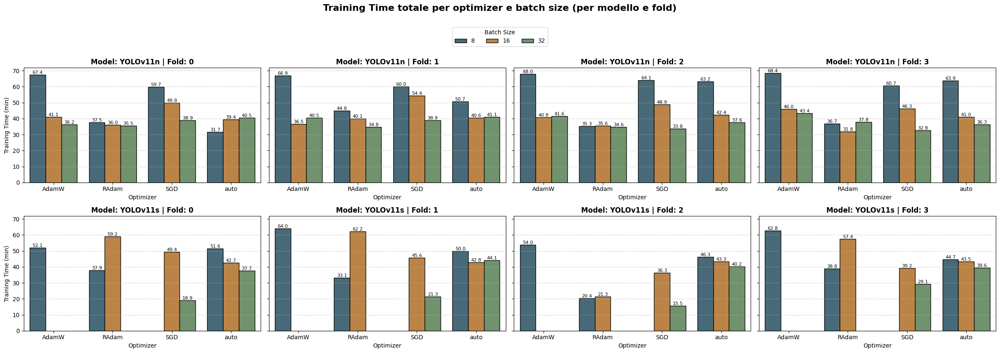

In [13]:
def plot_training_time_by_optimizer_and_batch(df):
    """
    Crea una griglia di subplot (modelli x folds).
    In ogni subplot, sull'asse X ci sono gli optimizer, sull'asse Y il training_time totale (in minuti).
    Ogni optimizer ha 3 barre che rappresentano i diversi batch_size.
    """
    # --- Step 1: estrai il tempo finale di ogni run (ultima epoca) ---
    run_last = df.sort_values("epoch").groupby(["model", "run_name", "fold_number"]).tail(1)
    run_last = run_last.assign(training_time_min=run_last["time"] / 60.0)

    # --- Step 2: aggrega ---
    grouped = (
        run_last.groupby(['model', 'fold_number', 'optimizer', 'batch_size'])['training_time_min']
        .mean()
        .reset_index()
    )

    models = sorted(grouped['model'].unique())
    folds = sorted(grouped['fold_number'].unique())

    n_rows = len(models)
    n_cols = len(folds)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 4*n_rows), sharey=True)

    # Gestione assi
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = np.array([axes])
    elif n_cols == 1:
        axes = np.array([[ax] for ax in axes])

    palette = [COLORS['blue'], COLORS['orange'], COLORS['green']]

    for i, model in enumerate(models):
        for j, fold in enumerate(folds):
            ax = axes[i, j]
            data_sub = grouped[(grouped['model'] == model) & (grouped['fold_number'] == fold)]

            if data_sub.empty:
                ax.set_visible(False)
                continue

            sns.barplot(
                data=data_sub,
                x='optimizer',
                y='training_time_min',
                hue='batch_size',
                palette=palette,
                ax=ax,
                edgecolor="black"
            )

            # Rimuovo legenda interna
            ax.get_legend().remove()

            ax.set_title(f"Model: {model} | Fold: {fold}", fontsize=12, fontweight="bold")
            ax.set_xlabel("Optimizer")
            if j == 0:
                ax.set_ylabel("Training Time (min)")
            else:
                ax.set_ylabel("")
            ax.grid(axis='y', linestyle='--', alpha=0.6)

            # Etichette numeriche sopra le barre
            for p in ax.patches:
                height = p.get_height()
                if height > 0:
                    ax.annotate(
                        f"{height:.1f}",
                        (p.get_x() + p.get_width()/2., height),
                        ha='center', va='bottom',
                        fontsize=8
                    )

    # Legenda unica
    handles, labels = axes[0,0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(palette), title="Batch Size", bbox_to_anchor=(0.5, 0.99))

    plt.suptitle("Training Time totale per optimizer e batch size (per modello e fold)",
                 fontsize=16, fontweight="bold", y=1.05)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

plot_training_time_by_optimizer_and_batch(df)

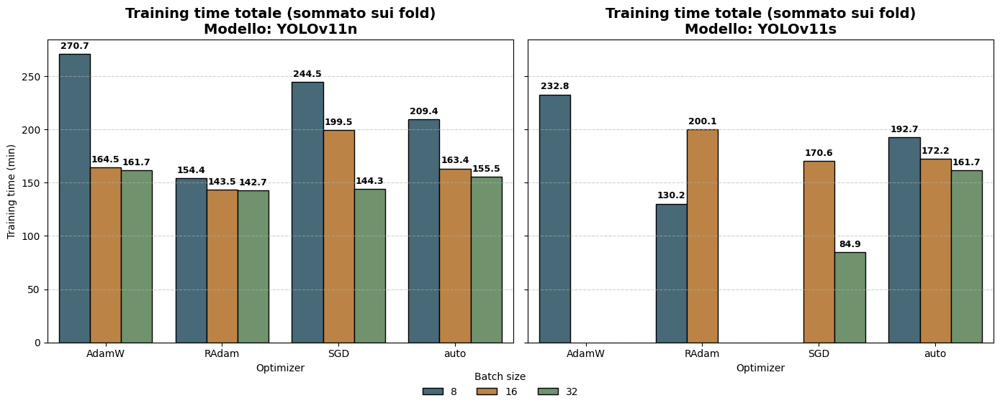

In [14]:
def plot_training_time_by_model_optimizer_batch(df):
    """
    Crea due subplot (uno per modello) con barre che mostrano 
    il tempo di training totale (in minuti) per optimizer e batch size,
    sommando i tempi medi su tutti i fold.
    """
    # --- Step 1: estrai il tempo finale di ogni run (ultima epoca) ---
    run_last = df.sort_values("epoch").groupby(["model", "run_name", "fold_number"]).tail(1)
    run_last = run_last.assign(training_time_min=run_last["time"] / 60.0)

    # --- Step 2: aggrega per fold ---
    agg_df = (
        run_last.groupby(['model', 'optimizer', 'batch_size', 'fold_number'])['training_time_min']
        .mean()
        .reset_index()
    )
    # --- Step 3: somma i tempi sui fold ---
    agg_df = (
        agg_df.groupby(['model', 'optimizer', 'batch_size'])['training_time_min']
        .sum()
        .reset_index()
    )

    # --- Definizione colori custom ---
    unique_batches = sorted(agg_df['batch_size'].unique())
    color_map = {
        b: c for b, c in zip(unique_batches, [COLORS['blue'], COLORS['orange'], COLORS['green']])
    }

    # --- Plot ---
    models = sorted(agg_df['model'].unique())
    fig, axes = plt.subplots(1, len(models), figsize=(7 * len(models), 6), sharey=True)
    if len(models) == 1:
        axes = [axes]

    for ax, model in zip(axes, models):
        sub = agg_df[agg_df['model'] == model]

        sns.barplot(
            data=sub,
            x='optimizer', y='training_time_min', hue='batch_size',
            palette=[color_map[b] for b in sub['batch_size'].unique()],
            ax=ax, edgecolor='black'
        )
        
        ax.set_title(f"Training time totale (sommato sui fold)\nModello: {model}", fontsize=14, fontweight="bold")
        ax.set_xlabel("Optimizer")
        ax.set_ylabel("Training time (min)" if ax == axes[0] else "")
        ax.grid(axis='y', linestyle='--', alpha=0.6)
        ax.legend_.remove()
        
        # --- Annotazioni sui valori ---
        for p in ax.patches:
            height = p.get_height()
            if np.isnan(height) or height <= 0:
                continue
            ax.annotate(
                f"{height:.1f}",
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom',
                fontsize=9, fontweight='bold',
                xytext=(0, 3), textcoords='offset points'
            )
    
    # Legenda generale esterna
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, title="Batch size", loc='lower center', ncol=len(labels), frameon=False, bbox_to_anchor=(0.5, -0.05))
    
    plt.tight_layout(rect=[0, 0, 1, 0.9])
    plt.show()

plot_training_time_by_model_optimizer_batch(df)

## 4. Analisi delle Curve di Training

### 4.1 Evolution delle Loss durante il Training

Visualizziamo l'andamento delle diverse componenti di loss (box, classification, DFL) sia per training che validation, aggregando i run per configurazione di iperparametri.

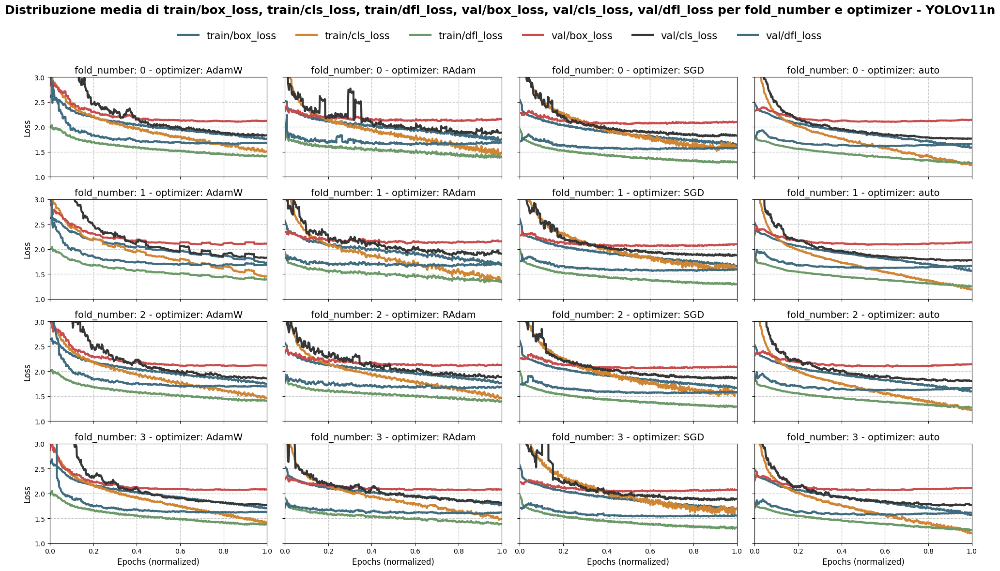

In [15]:
def plot_model_cols_dynamic_grid(
    df, 
    model_name, 
    cols, 
    row_var="fold_number", 
    col_var="optimizer", 
    smoothing_window=5, 
    y_label="Loss",
    y_limits=None  # Nuovo parametro: tuple (ymin, ymax)
):
    """
    Plotta le colonne (loss o metriche) per un modello specifico, applicando smoothing,
    con la griglia di subplot estendibile su due variabili a scelta.

    Args:
        df (pd.DataFrame): deve contenere ['run_code', 'model', row_var, col_var, 'normalized_epoch'] + cols
        model_name (str): nome del modello da filtrare
        cols (list[str]): lista delle colonne da visualizzare
        row_var (str): colonna da usare per le righe della griglia
        col_var (str): colonna da usare per le colonne della griglia
        smoothing_window (int): finestra per lo smoothing (rolling mean)
        y_label (str): etichetta per l'asse y
        y_limits (tuple, optional): limiti asse y (ymin, ymax). Default None.
    """
    # Filtra per modello
    df_model = df[df["model"] == model_name]

    rows = sorted(df_model[row_var].unique())
    cols_unique = sorted(df_model[col_var].unique())

    n_rows = len(rows)
    n_cols = len(cols_unique)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 3*n_rows), sharex=True, sharey=True)

    # Gestione caso singolo subplot
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = np.array([axes])
    elif n_cols == 1:
        axes = np.array([[ax] for ax in axes])

    color_list = [COLORS["blue"], COLORS["orange"], COLORS["green"], COLORS["red"], COLORS["gray"]]

    for i, r in enumerate(rows):
        for j, c in enumerate(cols_unique):
            ax = axes[i, j]
            df_sub = df_model[(df_model[row_var] == r) & (df_model[col_var] == c)]

            if df_sub.empty:
                ax.set_visible(False)
                continue

            # Aggrega tutti i run per ogni normalized_epoch e colonna
            grouped = df_sub.groupby("normalized_epoch")[cols].mean()

            # Applica smoothing (rolling mean)
            grouped_smooth = grouped.rolling(window=smoothing_window, min_periods=1).mean()

            # Disegna le linee medie smoothed con spessore maggiore
            for k, col_name in enumerate(cols):
                color = color_list[k % len(color_list)]
                ax.plot(grouped_smooth.index, grouped_smooth[col_name], label=col_name, color=color, linewidth=3.0)

            ax.set_title(f"{row_var}: {r} - {col_var}: {c}", fontsize=14)
            if i == n_rows-1:
                ax.set_xlabel("Epochs (normalized)", fontsize=12)
            if j == 0:
                ax.set_ylabel(y_label, fontsize=12)
            
            # Griglia più evidente
            ax.grid(True, linestyle="--", linewidth=1.0, alpha=0.7)
            ax.set_xlim(0, 1)
            if y_limits is not None:
                ax.set_ylim(y_limits)

    # Legenda unica in alto
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(cols), fontsize=15, frameon=False, bbox_to_anchor=(0.5, 0.95))

    plt.suptitle(f"Distribuzione media di {', '.join(cols)} per {row_var} e {col_var} - {model_name}",
                 fontsize=18, fontweight="bold")
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

# --- Uso ---
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='fold_number',
                             col_var='optimizer',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

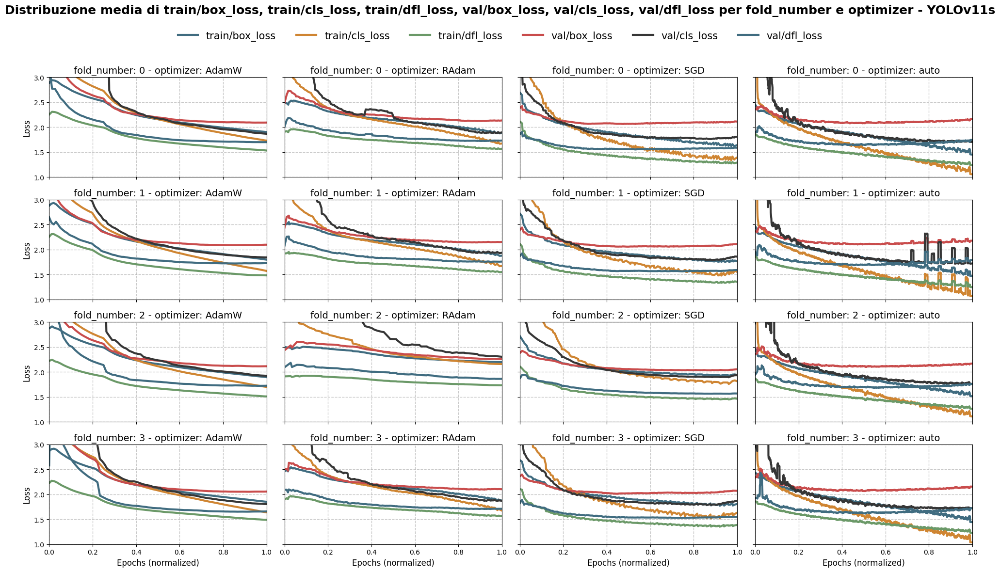

In [16]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='fold_number',
                             col_var='optimizer',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

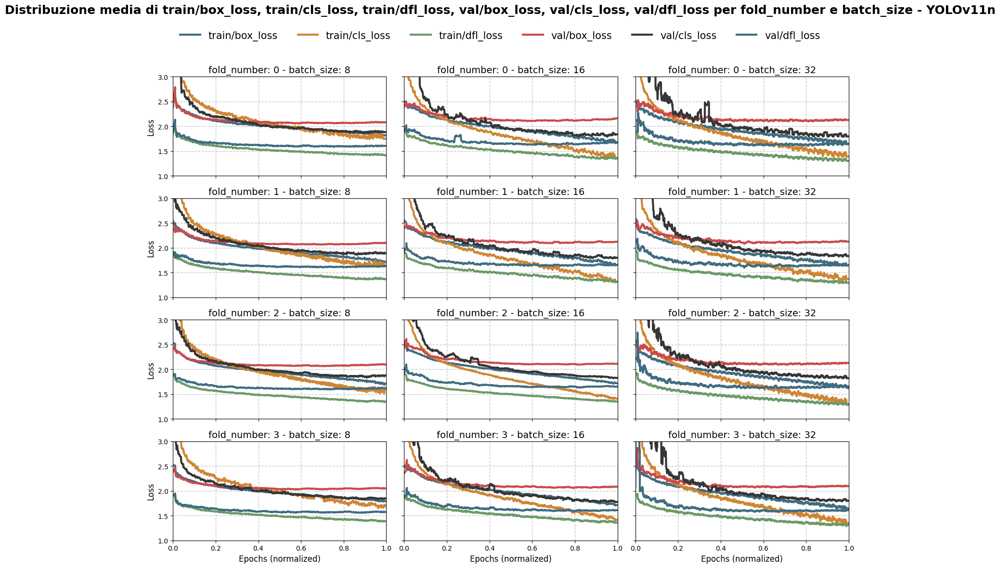

In [17]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='fold_number',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

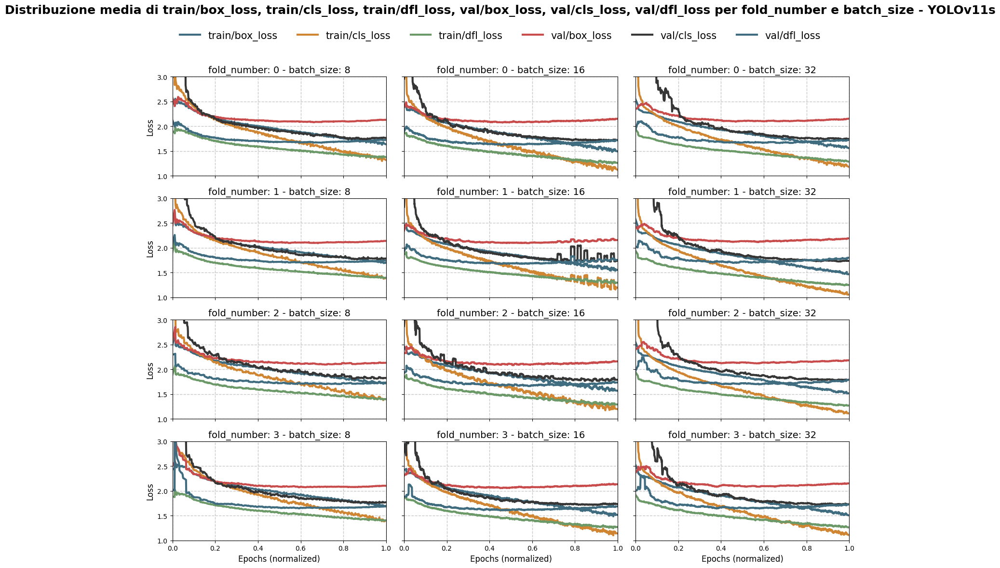

In [18]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='fold_number',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

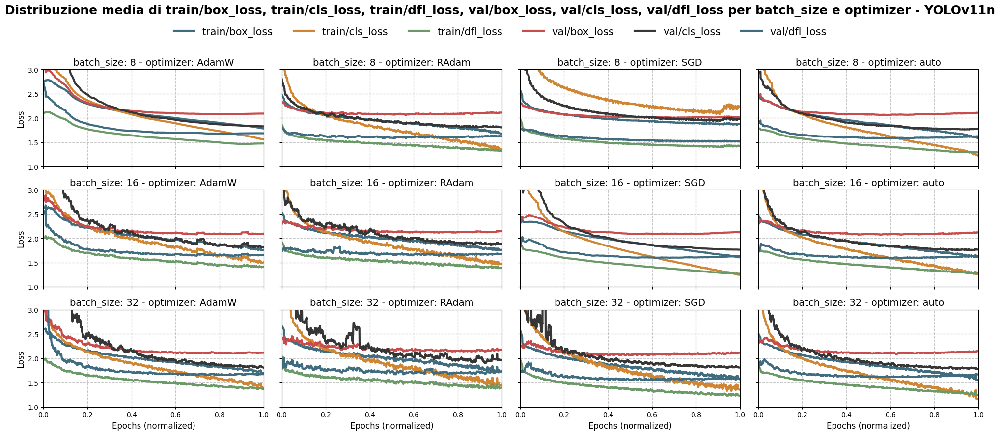

In [19]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='batch_size',
                             col_var='optimizer',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

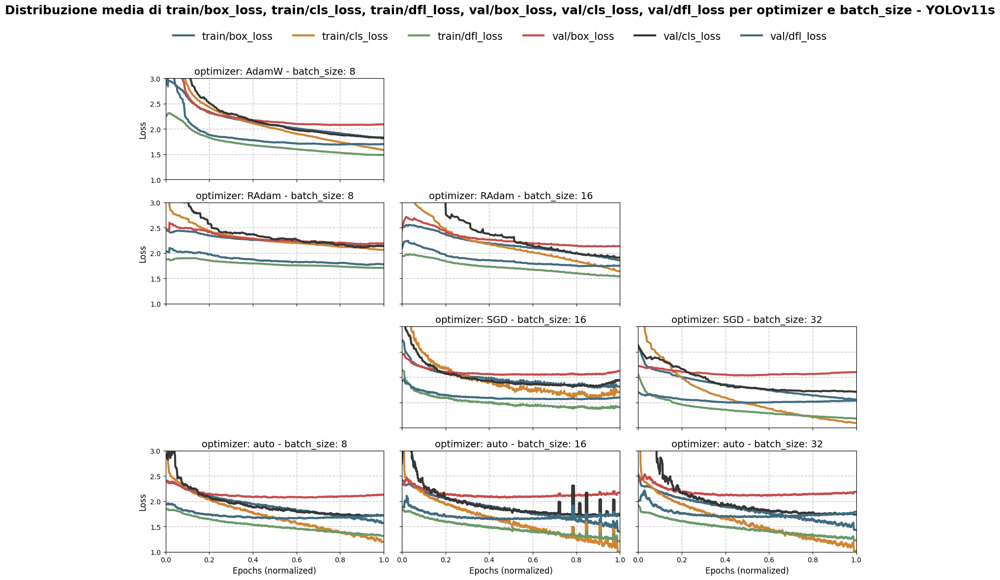

In [20]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='optimizer',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

### 4.2 Evolution delle Metriche durante il Training

Analizziamo l'evoluzione delle metriche di performance (precision, recall, mAP50) durante il training per identificare pattern e convergenza.

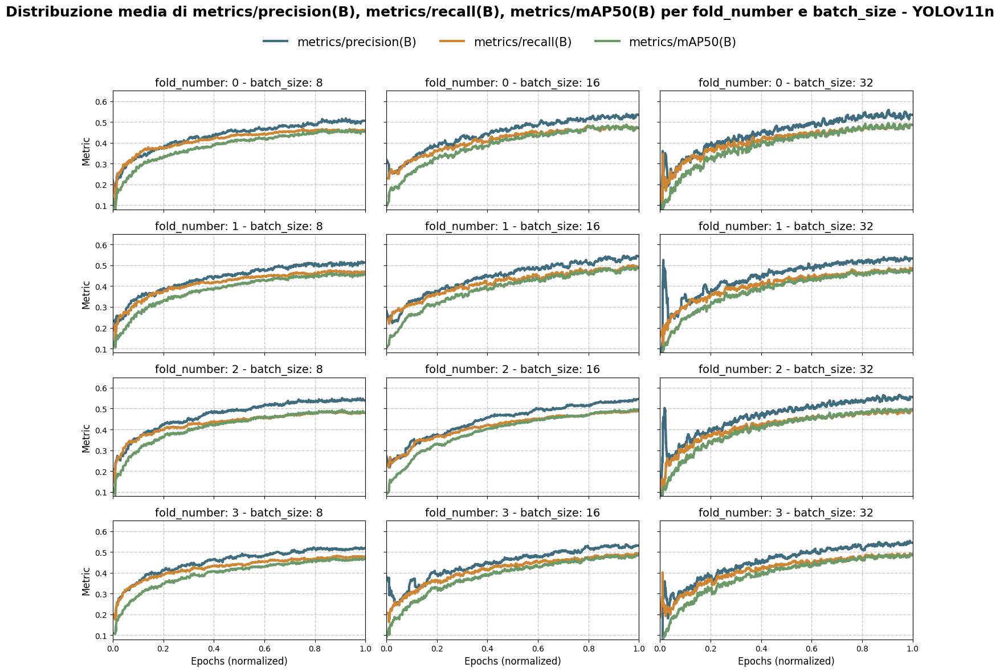

In [21]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='fold_number',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

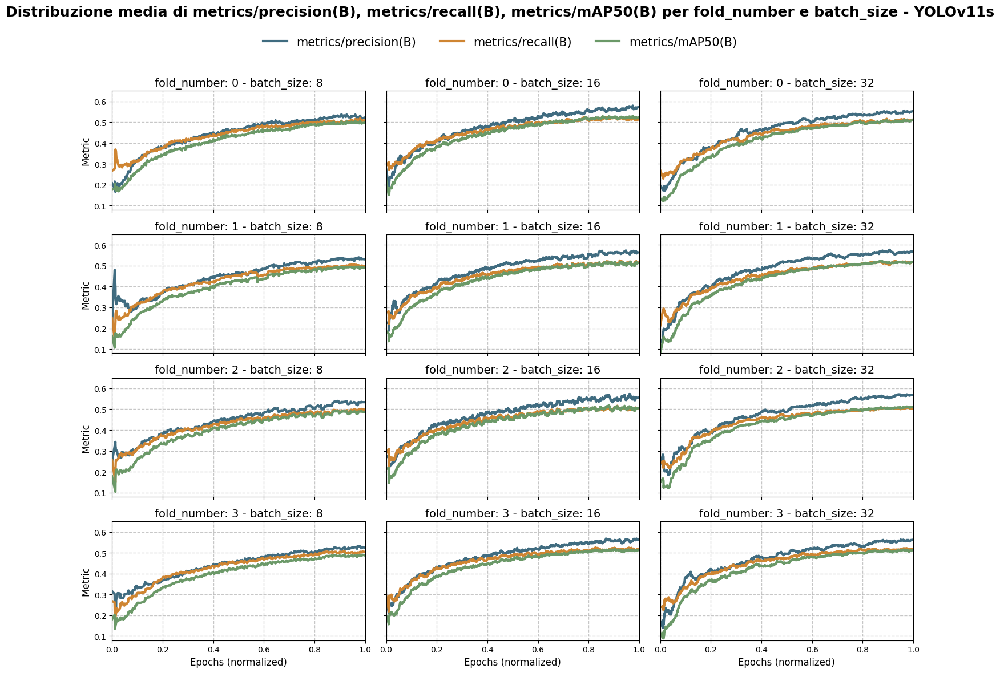

In [22]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='fold_number',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

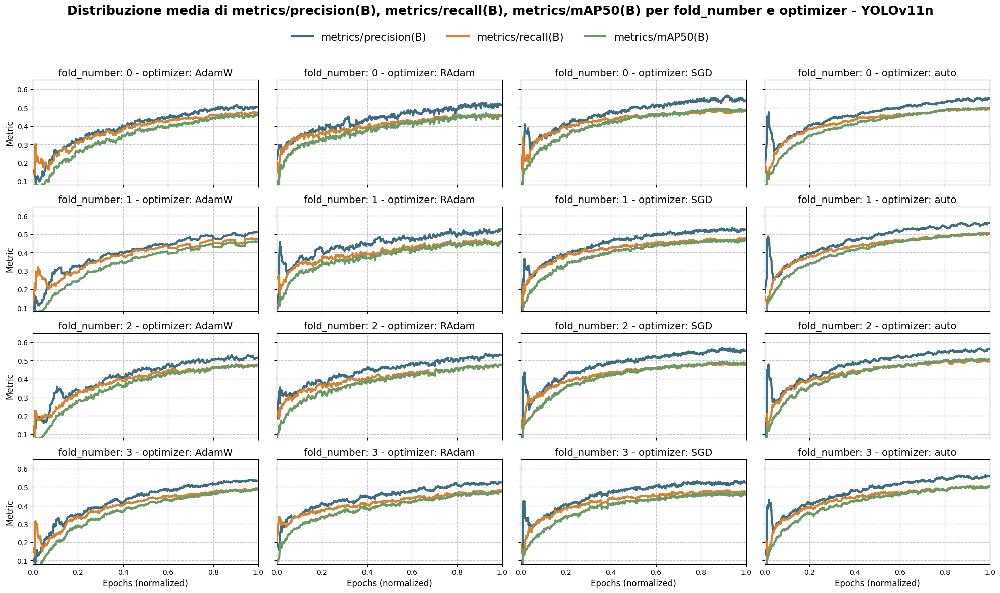

In [23]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='fold_number',
                             col_var='optimizer',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

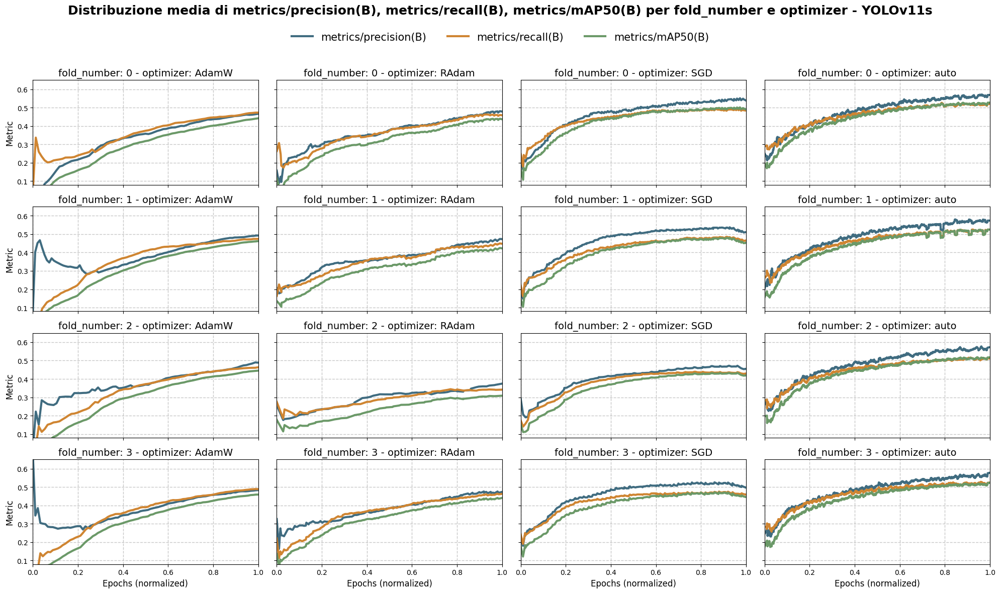

In [24]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='fold_number',
                             col_var='optimizer',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

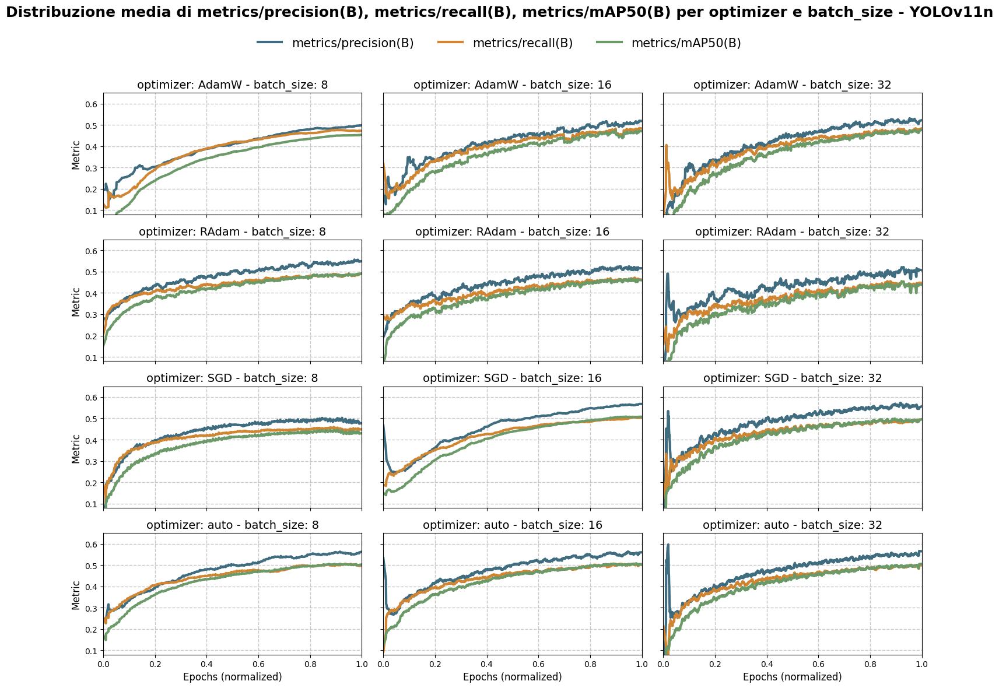

In [25]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='optimizer',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

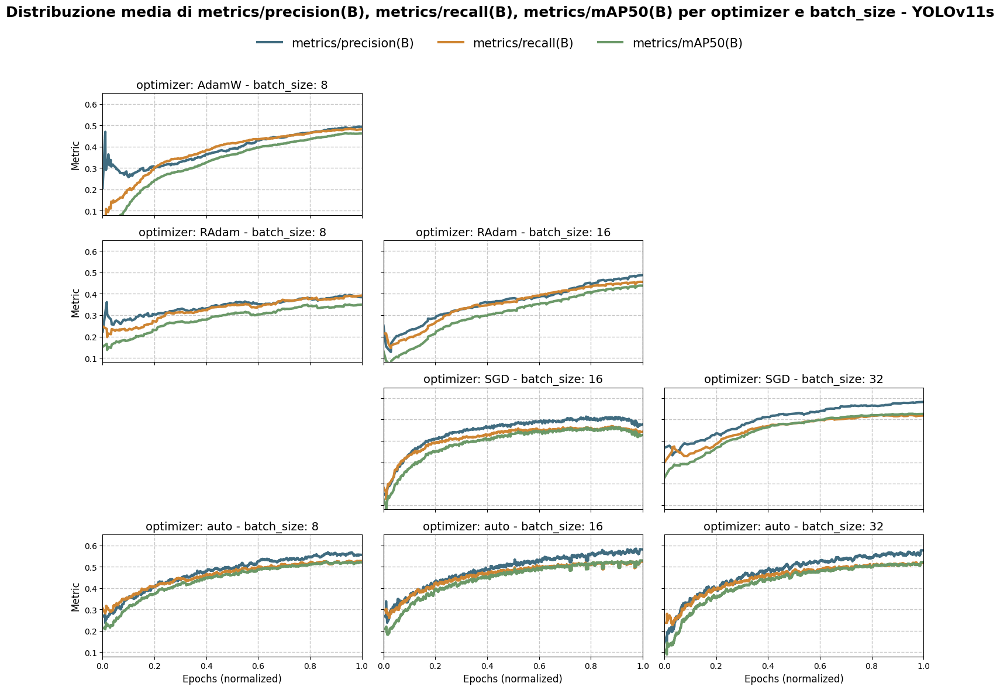

In [26]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='optimizer',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

## 5. Analisi delle Performance Finali

### 5.1 Aggregazione per Fold

Visualizziamo l'andamento medio delle metriche aggregando tutti i run ma mantenendo i fold separati. Ogni fold ha la sua curva con banda di confidenza.

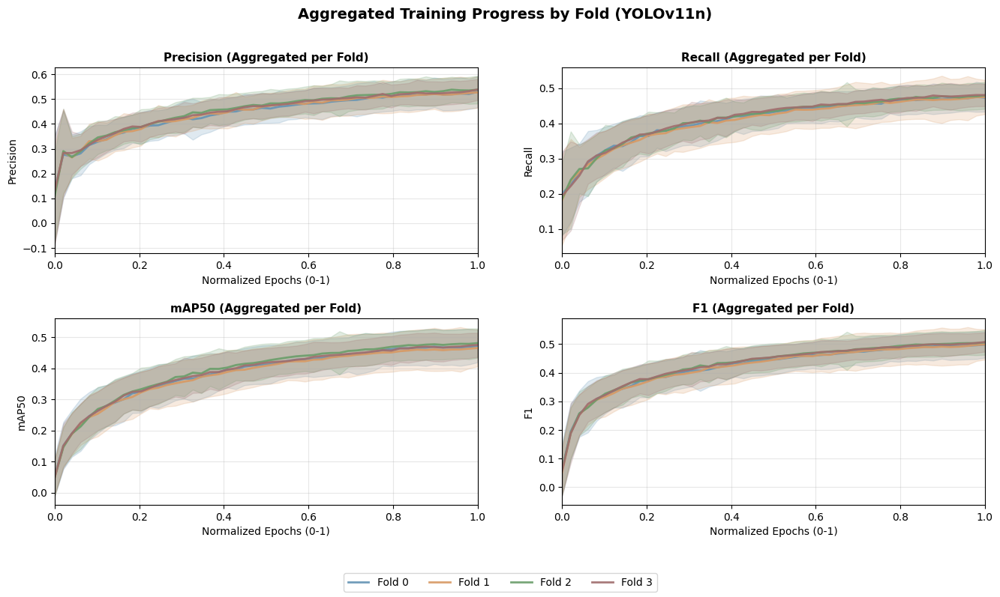

In [28]:
def plot_model_aggregates_by_fold(df, model_name=None, figsize=(16, 8), common_points=50):
    """
    Plot 2x2 delle metriche aggregando TUTTI i run di un modello,
    ma mantenendo i fold separati (ogni fold ha la sua curva media ± std).
    """
    if model_name:
        df = df[df["model"] == model_name]
        if df.empty:
            print(f"❌ Nessun dato trovato per il modello {model_name}")
            return

    metrics = {
        "Precision": "metrics/precision(B)",
        "Recall": "metrics/recall(B)",
        "mAP50": "metrics/mAP50(B)",
        "F1": "metrics/f1(B)"
    }

    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()
    fold_colors = ["#6393b4", "#d89963", "#6a9e6a", "#A06D6D", "#b47ba1", "#c2b06d"]  # più fold → più colori
    common_epochs = np.linspace(0, 1, common_points)

    handles, labels = [], []

    for idx, (metric_name, metric_col) in enumerate(metrics.items()):
        if metric_col not in df.columns:
            continue
        ax = axes[idx]

        for fold, fold_data_all in df.groupby("fold_number"):
            fold_curves = []

            # prendo tutti i run dentro questo fold
            for run_code, fold_data in fold_data_all.groupby("run_code"):
                fold_data = fold_data.sort_values("epoch")
                values = fold_data[metric_col].astype(float).dropna().values
                if values.size == 0:
                    continue

                epochs = fold_data["epoch"].values
                norm_epochs = (epochs - epochs.min()) / (epochs.ptp() if epochs.ptp() else 1)

                interp_values = np.interp(common_epochs, norm_epochs, values)
                fold_curves.append(interp_values)

            if fold_curves:
                fold_curves = np.vstack(fold_curves)
                mean, std = np.nanmean(fold_curves, 0), np.nanstd(fold_curves, 0)

                # curva media del fold
                line, = ax.plot(common_epochs, mean,
                                color=fold_colors[fold % len(fold_colors)],
                                lw=2, alpha=0.9)
                ax.fill_between(common_epochs, mean-std, mean+std,
                                color=fold_colors[fold % len(fold_colors)],
                                alpha=0.2)

                if idx == 0:  # legenda solo nel primo grafico
                    handles.append(line)
                    labels.append(f"Fold {fold}")

        ax.set_title(f"{metric_name} (Aggregated per Fold)", fontsize=11, fontweight="bold")
        ax.set_xlabel("Normalized Epochs (0-1)")
        ax.set_ylabel(metric_name)
        ax.set_xlim(0, 1)
        ax.grid(alpha=0.3)

    # nascondi subplot vuoti
    for i in range(len(metrics), 4):
        axes[i].set_visible(False)

    # legenda globale
    fig.legend(handles, labels, loc="lower center", ncol=len(labels), fontsize=10)
    plt.subplots_adjust(hspace=0.35, bottom=0.15)
    plt.suptitle(f"Aggregated Training Progress by Fold ({model_name})",
                 fontsize=14, fontweight="bold")
    plt.show()

plot_model_aggregates_by_fold(df, "YOLOv11n")

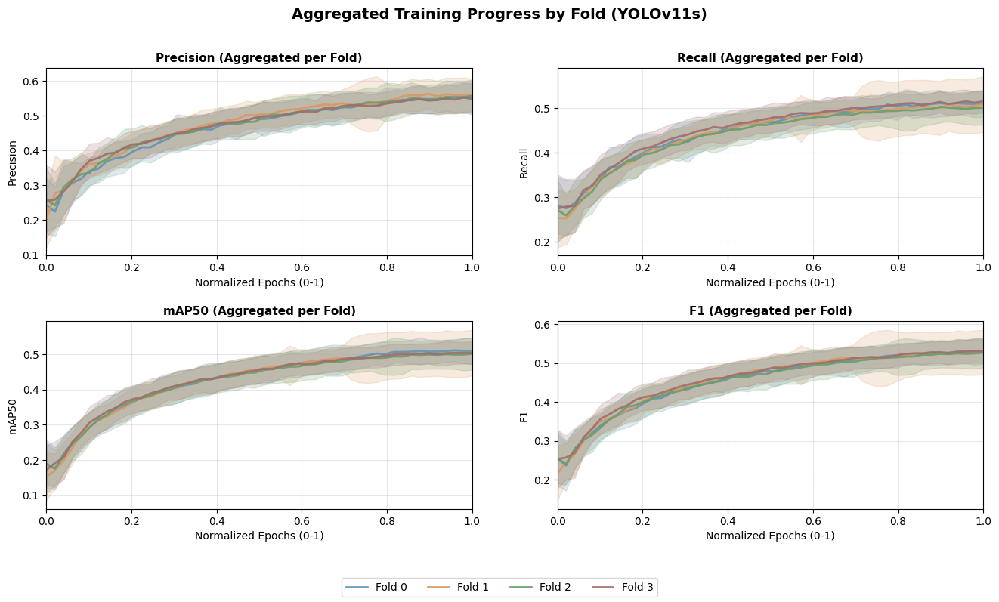

In [29]:
plot_model_aggregates_by_fold(df, "YOLOv11s")

### 5.2 Migliori Run per Metrica

Identifichiamo e visualizziamo i run con le migliori performance per ogni metrica, mostrando l'evoluzione durante il training.

🏆 Best Precision: YOLOv11n (run i9ix6mkd) score=0.5912
🏆 Best Recall: YOLOv11n (run i9ix6mkd) score=0.5168
🏆 Best mAP50: YOLOv11n (run i9ix6mkd) score=0.5199
🏆 Best F1: YOLOv11n (run i9ix6mkd) score=0.5513


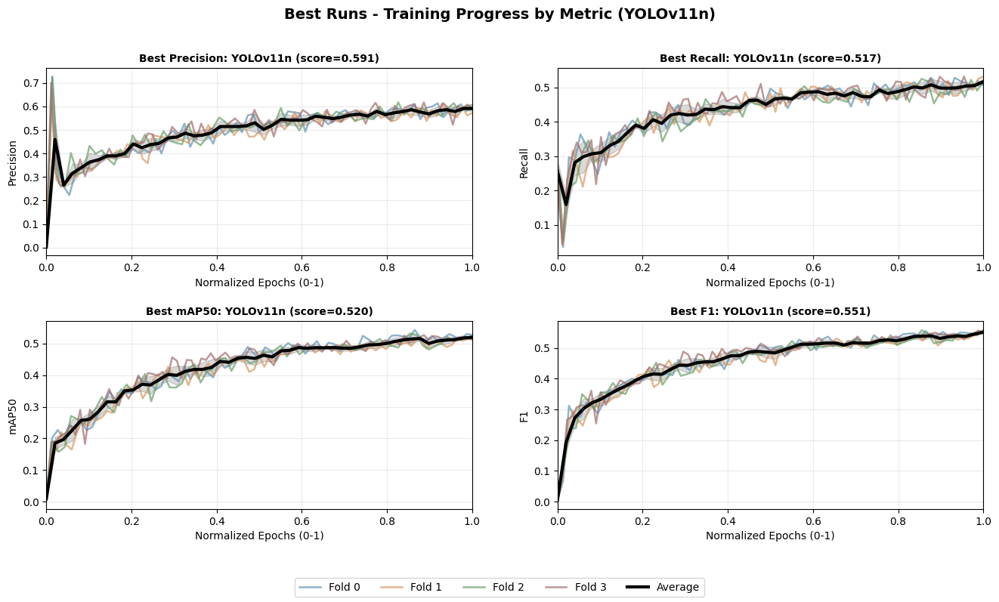

🏆 Best Precision: YOLOv11s (run 21dzzzyu) score=0.6035
🏆 Best Recall: YOLOv11s (run 2lp7qswl) score=0.5352
🏆 Best mAP50: YOLOv11s (run ep271vsp) score=0.5351
🏆 Best F1: YOLOv11s (run mww82odu) score=0.5539


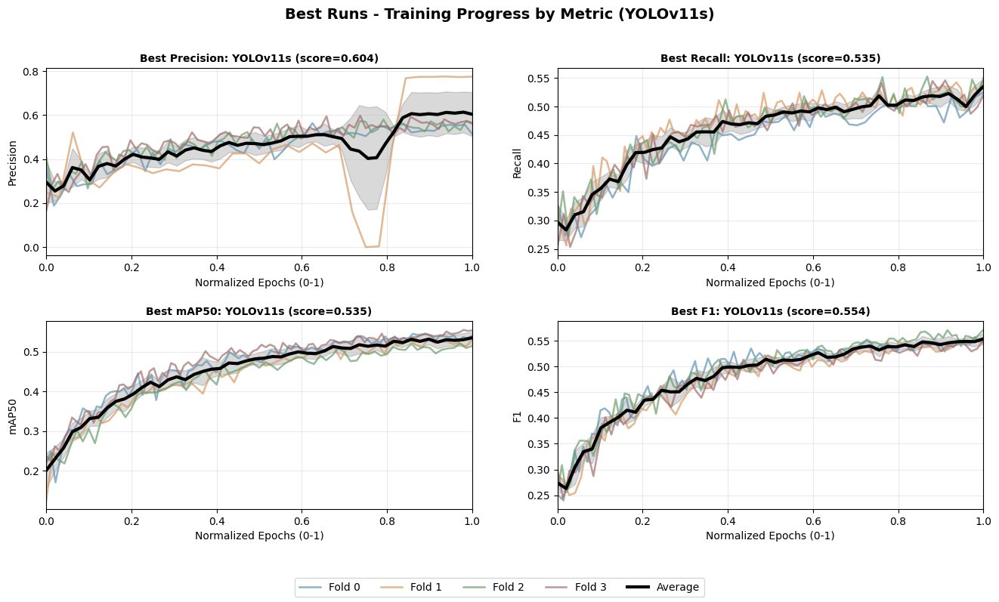

In [30]:
def find_best_run(df, metric, model_name=None, mode="last"):
    """
    Trova il run con la migliore performance media finale per la metrica specificata.

    Args:
        df (pd.DataFrame): dati con colonne 'run_code', 'fold_number', 'model' e metriche.
        metric (str): nome della colonna da valutare.
        model_name (str, opzionale): se specificato, filtra i dati per quel modello.
        mode (str): criterio per fold -> "last" (ultimo valore) o "max" (migliore valore).

    Returns:
        dict con run_code, model e score medio, oppure None se non trovato.
    """
    if metric not in df.columns:
        raise ValueError(f"La metrica '{metric}' non esiste nel DataFrame.")

    # Filtro per modello
    if model_name is not None:
        df = df[df["model"] == model_name]
        if df.empty:
            return None

    # Funzione per estrarre il valore dal fold
    def get_value(fold):
        vals = fold[metric].dropna()
        if vals.empty:
            return np.nan
        
        if mode == "last":
            return vals.iloc[-1]
        elif mode == "max":
            return vals.max()
        elif mode == "min":
            return vals.min()

    # Media sui fold → poi media per run
    group_cols = ["run_code", "model", "fold_number"]
    value_cols = [c for c in df.columns if c not in group_cols]

    scores = (
        df.groupby(group_cols, group_keys=False)[value_cols]
        .apply(get_value)
        .groupby(["run_code", "model"])
        .mean()
    )

    if scores.empty:
        return None

    # Seleziona il migliore
    best_idx = scores.idxmax()
    return {
        "run_code": best_idx[0],
        "model": best_idx[1],
        "score": scores.max()
    }

def plot_best_runs(df, model_name=None, figsize=(16, 8), common_points=50, mode='last'):
    """
    Plot 2x2 delle metriche per il best run di un modello, mostrando fold e curva media ± std.
    Aggiunge una legenda comune per tutti i subplot.

    Args:
        df: DataFrame con dati di training/validation
        model_name: filtra per modello specifico
        figsize: dimensione figura
        common_points: numero di punti per interpolazione
        mode: "last" o "max" per fold
    """
    if model_name:
        df = df[df["model"] == model_name]
        if df.empty:
            print(f"❌ Nessun dato trovato per il modello {model_name}")
            return

    metrics = {
        "Precision": "metrics/precision(B)",
        "Recall": "metrics/recall(B)",
        "mAP50": "metrics/mAP50(B)",
        "F1": "metrics/f1(B)"
    }

    best_runs = {name: (col, find_best_run(df, col, model_name, mode))
                 for name, col in metrics.items() if col in df.columns}
    best_runs = {k: v for k, v in best_runs.items() if v[1]}
    if not best_runs:
        print("❌ Nessun run trovato.")
        return

    for name, (_, br) in best_runs.items():
        print(f"🏆 Best {name}: {br['model']} (run {br['run_code'][:8]}) score={br['score']:.4f}")

    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()
    colors = ["#6393b4", "#d89963", "#6a9e6a", "#A06D6D"]
    common_epochs = np.linspace(0, 1, common_points)

    handles, labels = [], []

    for idx, (metric_name, (metric_col, best_run)) in enumerate(best_runs.items()):
        if idx >= 4: break

        ax = axes[idx]
        run_data = df[df["run_code"] == best_run["run_code"]]
        fold_curves = []

        for fold, fold_data in run_data.groupby("fold_number"):
            fold_data = fold_data.sort_values("epoch")
            values = fold_data[metric_col].astype(float).dropna().values
            if values.size == 0: continue

            epochs = fold_data["epoch"].values
            norm_epochs = (epochs - epochs.min()) / (epochs.ptp() if epochs.ptp() else 1)

            line, = ax.plot(norm_epochs, values, color=colors[fold % len(colors)], alpha=0.7, lw=1.8)
            fold_curves.append(np.interp(common_epochs, norm_epochs, values))
            if idx == 0:
                handles.append(line)
                labels.append(f"Fold {fold}")

        # Media ± std
        if fold_curves:
            fold_stack = np.vstack(fold_curves)
            mean, std = np.nanmean(fold_stack, 0), np.nanstd(fold_stack, 0)
            line_avg, = ax.plot(common_epochs, mean, color="black", lw=3)
            ax.fill_between(common_epochs, mean-std, mean+std, color="black", alpha=0.15)
            if idx == 0:
                handles.append(line_avg)
                labels.append("Average")

        ax.set_title(f"Best {metric_name}: {best_run['model']} (score={best_run['score']:.3f})",
                     fontsize=10, fontweight="bold")
        ax.set_xlabel("Normalized Epochs (0-1)")
        ax.set_ylabel(metric_name)
        ax.set_xlim(0, 1)
        ax.grid(alpha=0.25)

    # Nasconde subplot vuoti
    for i in range(len(best_runs), 4):
        axes[i].set_visible(False)

    # Legenda unica sotto i subplot
    fig.legend(handles, labels, loc='lower center', ncol=len(labels), fontsize=10)
    plt.subplots_adjust(hspace=0.35, bottom=0.15)
    plt.suptitle(f"Best Runs - Training Progress by Metric" + (f" ({model_name})" if model_name else ""),
                 fontsize=14, fontweight="bold")
    plt.show()

plot_best_runs(df, "YOLOv11n")
plot_best_runs(df, "YOLOv11s")

### 5.3 Curve di Loss per i Migliori Run

Analizziamo in dettaglio le curve di loss (training e validation) per i run con le migliori performance in precision.

In [ ]:
def plot_loss_curves(df, metric='metrics/precision(B)', model_name=None, figsize=(16,10), common_points=50, mode='last'):
    """
    Plot delle loss per il **run migliore** secondo una metrica specifica.
    Mostra 6 subplot (3 train + 3 val) con fold singoli e curva media.

    Args:
        df (pd.DataFrame): dati con colonne 'run_code', 'fold_number', 'model', 'epoch' e loss.
        metric (str): metrica da usare per selezionare il run migliore.
        model_name (str, opzionale): se specificato, filtra i dati per quel modello.
        figsize (tuple): dimensioni della figura.
        common_points (int): numero di punti per interpolazione delle curve medie.
    """
    # Trova il run migliore
    best_run = find_best_run(df, metric, model_name=model_name, mode=mode)
    if not best_run:
        print("❌ Nessun run trovato.")
        return

    df_run = df[df['run_code'] == best_run['run_code']]

    loss_cols = ['train/box_loss', 'train/cls_loss', 'train/dfl_loss',
                 'val/box_loss', 'val/cls_loss', 'val/dfl_loss']
    loss_names = ['Train Box', 'Train CLS', 'Train DFL', 'Val Box', 'Val CLS', 'Val DFL']
    colors = ["#6393b4", "#d89963", "#6a9e6a", "#A06D6D"]

    fig, axes = plt.subplots(2, 3, figsize=figsize)
    axes = axes.flatten()

    for idx, (col, name) in enumerate(zip(loss_cols, loss_names)):
        ax = axes[idx]
        all_fold_interp = []

        for fold_idx, fold in enumerate(sorted(df_run['fold_number'].unique())):
            fold_data = df_run[df_run['fold_number'] == fold].sort_values('epoch')
            if fold_data.empty or col not in fold_data.columns:
                continue

            values = fold_data[col].astype(float).values
            if np.all(np.isnan(values)):
                continue

            epochs = fold_data['epoch'].values
            norm_epochs = (epochs - epochs.min()) / (epochs.max() - epochs.min()) if len(epochs) > 1 else np.zeros_like(epochs)

            ax.plot(norm_epochs, values, color=colors[fold_idx % len(colors)], alpha=0.7, linewidth=1.5)

            # Interpolazione per media
            if len(norm_epochs) > 1 and np.sum(~np.isnan(values)) >= 2:
                interp_vals = np.interp(np.linspace(0,1,common_points), norm_epochs, values)
                all_fold_interp.append(interp_vals)

        if all_fold_interp:
            all_fold_interp = np.vstack(all_fold_interp)
            mean_curve = np.nanmean(all_fold_interp, axis=0)
            std_curve = np.nanstd(all_fold_interp, axis=0)
            x_common = np.linspace(0,1,common_points)
            ax.plot(x_common, mean_curve, color='black', linewidth=2.5, label='Average')
            ax.fill_between(x_common, mean_curve-std_curve, mean_curve+std_curve, color='black', alpha=0.15)

        ax.set_title(name, fontsize=10, fontweight='bold')
        ax.set_xlabel('Normalized Epochs (0-1)')
        ax.set_ylabel('Loss')
        ax.grid(True, alpha=0.3)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    for i in range(len(loss_cols), len(axes)):
        axes[i].set_visible(False)

    # Legenda unica
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(labels), bbox_to_anchor=(0.5, 0.95))

    title = f"Training and Validation Loss Curves\nBest (precision) Run: {best_run['run_code']}"
    if model_name:
        title += f" ({model_name})"
    plt.suptitle(title, fontsize=14, fontweight='bold', y=1.0)
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.show()


plot_loss_curves(df, metric='metrics/precision(B)', model_name="YOLOv11n")
plot_loss_curves(df, metric='metrics/precision(B)', model_name="YOLOv11s")

In [ ]:
plot_loss_curves(df, metric='metrics/recall(B)', model_name="YOLOv11n")
plot_loss_curves(df, metric='metrics/recall(B)', model_name="YOLOv11s")

## 6. Confronto Parametrico delle Performance

### 6.1 Distribuzione delle Metriche Finali

Boxplot delle performance finali raggruppate per diversi iperparametri. Le performance sono calcolate come media dell'ultimo valore di ogni fold per ogni run.

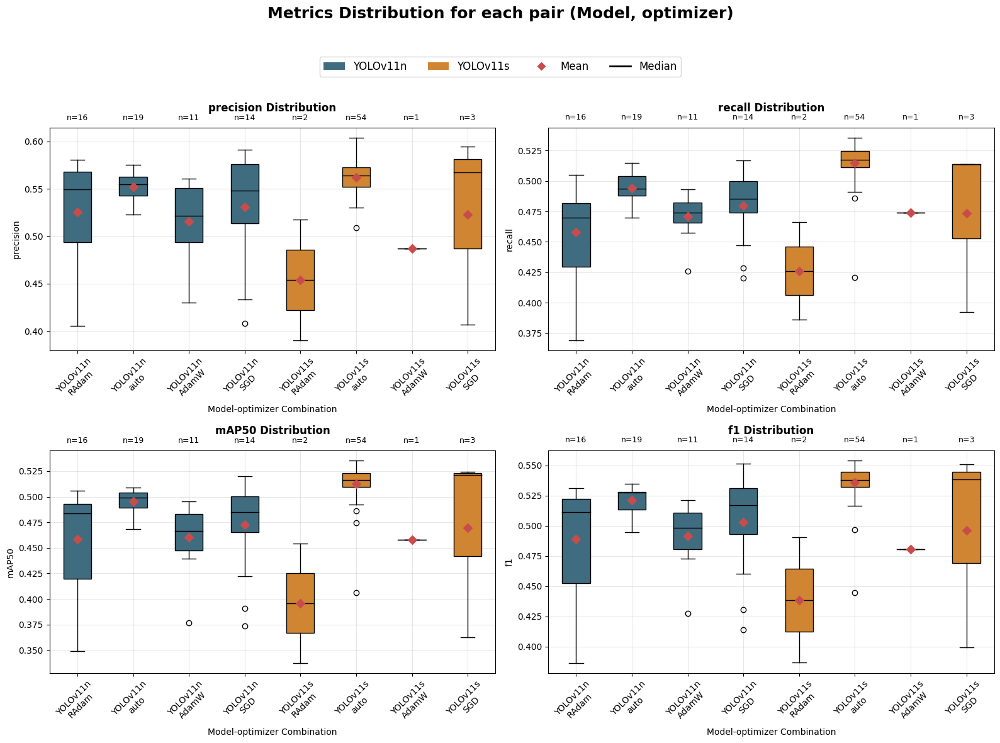

In [ ]:
def prepare_final_metrics(df, split_col, metrics=None):
    """
    Estrae l'ultimo valore di ciascuna metrica per fold e run, 
    poi calcola la media per run (per boxplot o confronto tra configurazioni).

    Args:
        df (pd.DataFrame): DataFrame contenente i dati dei run.
        split_col (str): colonna categoriale da considerare (batch_size, optimizer, fold_number, ecc.)
        metrics (list[str], optional): Lista di colonne metriche da considerare. 
                                       Default: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/f1(B)']

    Returns:
        pd.DataFrame: DataFrame aggregato con media delle metriche per run.
    """
    if metrics is None:
        metrics = ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/f1(B)']

    # Estrai ultimo valore per fold
    fold_df = (
        df.groupby(['run_code', 'model', split_col, 'fold_number'], as_index=False)[metrics]
          .last()
    )

    # Media per run (aggregando sui fold)
    run_means = fold_df.groupby(['run_code', 'model', split_col], as_index=False).mean(numeric_only=True)
    return run_means


def plot_boxplots(final_metrics, split_col, metrics=None):
    """
    Boxplot per ogni combinazione modello-<split_col> mostrando il numero di run,
    con legenda globale esterna (modello, media, mediana).
    Usa solo i colori definiti in COLORS (blue, orange).
    """
    if metrics is None:
        metrics = ["metrics/precision(B)", "metrics/recall(B)", "metrics/mAP50(B)", "metrics/f1(B)"]

    models = final_metrics["model"].unique()
    split_values = final_metrics[split_col].unique()

    # assegna alternando solo blue e orange
    palette = [COLORS["blue"], COLORS["green"]]
    model_colors = {model: palette[i % 2] for i, model in enumerate(models)}

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()

    for i, metric in enumerate(metrics):
        ax = axes[i]
        plot_data, labels, n_runs = [], [], []

        for model in models:
            for val in split_values:
                data = final_metrics[(final_metrics["model"] == model) &
                                     (final_metrics[split_col] == val)][metric]
                if not data.empty:
                    plot_data.append(data.values)
                    labels.append(f"{model}\n{val}")
                    n_runs.append(len(data))

        # Boxplot
        bp = ax.boxplot(plot_data, labels=labels, patch_artist=True,
                        medianprops=dict(color='black', linewidth=1))

        # Colori box in base al modello
        for patch, lbl in zip(bp["boxes"], labels):
            model_name = lbl.split("\n")[0]
            patch.set_facecolor(model_colors.get(model_name, "lightgray"))

        # Media (rosso, come già avevi messo)
        means = [np.mean(d) for d in plot_data]
        ax.scatter(range(1, len(means)+1), means, color=COLORS['red'],
                   marker="D", s=50, zorder=3)

        # Numero di run sopra ogni box
        ylim_top = ax.get_ylim()[1]
        for x, n in enumerate(n_runs, start=1):
            ax.text(x, ylim_top * 1.01, f"n={n}", ha="center", va="bottom", fontsize=9)

        # Titolo e asse
        ax.set_title(metric.split("/")[-1].replace("(B)", "") + " Distribution",
                     fontsize=12, fontweight="bold", y=1.05)
        ax.set_xlabel(f"Model-{split_col} Combination")
        ax.set_ylabel(metric.split("/")[-1].replace("(B)", ""))
        ax.tick_params(axis="x", rotation=45)
        ax.grid(True, alpha=0.3)

    # Nasconde eventuali subplot vuoti
    for j in range(len(metrics), len(axes)):
        axes[j].set_visible(False)

    # Legenda globale
    legend_elements = [mpatches.Patch(facecolor=color, label=model)
                       for model, color in model_colors.items()]
    legend_elements += [
        Line2D([0], [0], marker='D', color='w', label='Mean',
               markerfacecolor=COLORS['red'], markersize=8),
        Line2D([0], [0], marker='_', color='black', label='Median',
               markersize=12, lw=2)
    ]
    plt.suptitle(f"Metrics Distribution for each pair (Model, {split_col})",
                 fontsize=18, fontweight="bold")

    fig.legend(handles=legend_elements,
               loc='upper center',
               ncol=4,
               fontsize=12,
               bbox_to_anchor=(0.5, 0.92))

    plt.tight_layout(rect=[0, 0, 1, 0.9])
    plt.show()


# --- Uso ---
split_col_name = 'optimizer'  # o 'batch_size', 'optimizer', ecc.
final_metrics = prepare_final_metrics(df, split_col=split_col_name)
plot_boxplots(final_metrics, split_col=split_col_name)

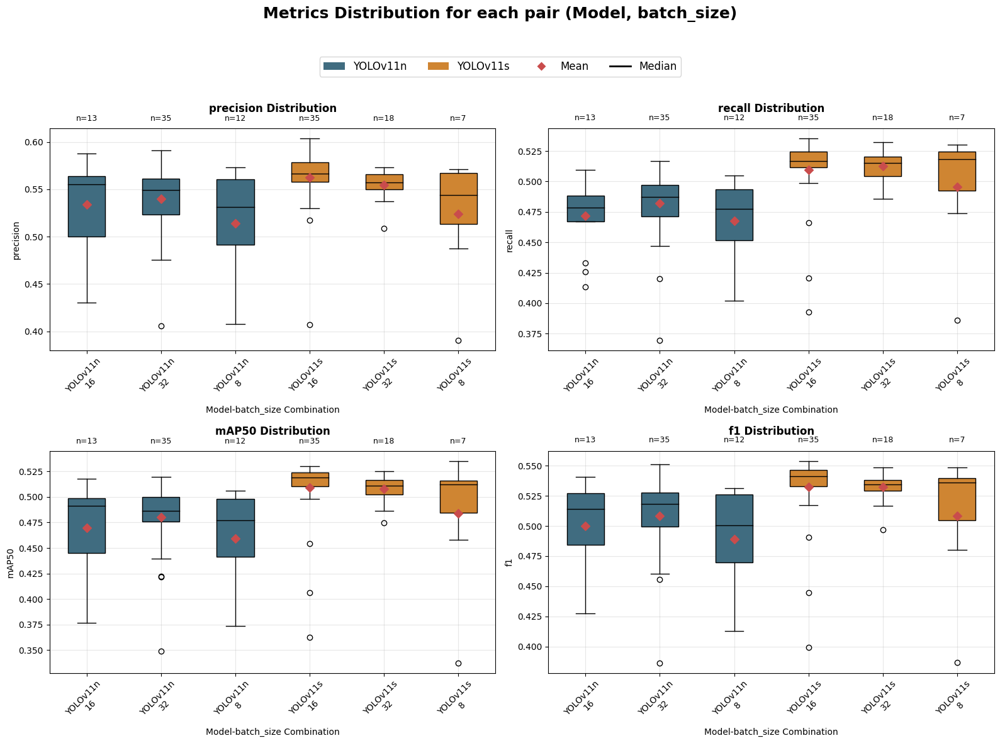

In [32]:
split_col_name = 'batch_size'  # o 'batch_size', 'optimizer', ecc.
final_metrics = prepare_final_metrics(df, split_col=split_col_name)
plot_boxplots(final_metrics, split_col=split_col_name)

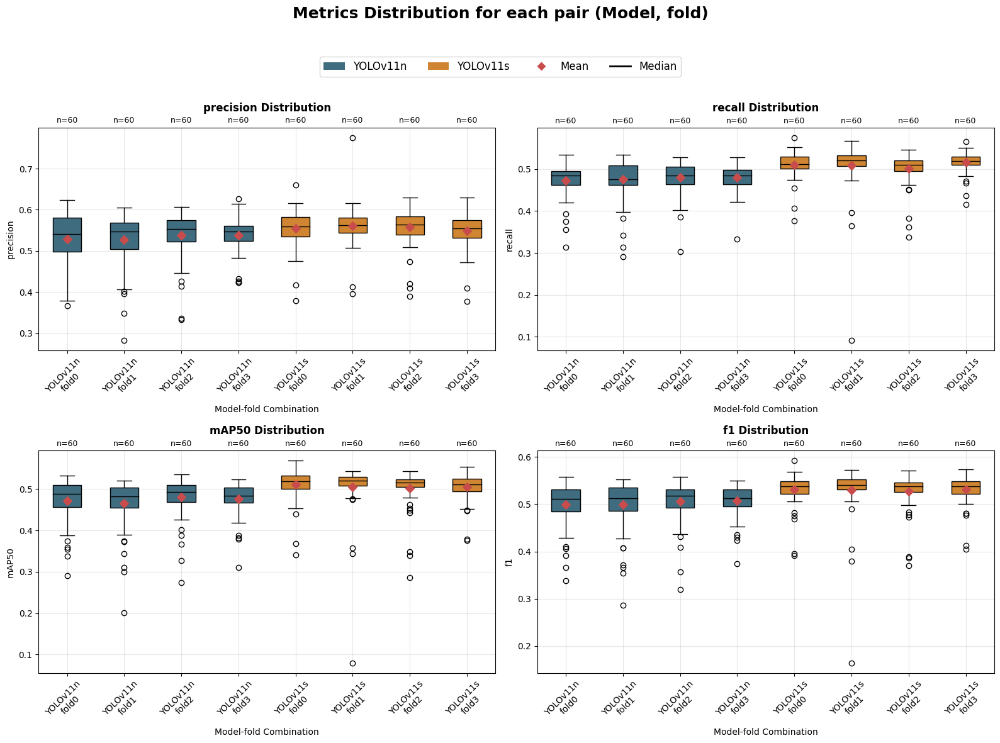

In [33]:
split_col_name = 'fold'
final_metrics = prepare_final_metrics(df, split_col=split_col_name)
plot_boxplots(final_metrics, split_col=split_col_name)

### 6.2 Confronto Performance Medie

Grafici a barre che confrontano le performance medie finali per diversi raggruppamenti di iperparametri. Le barre dorate indicano la configurazione migliore.

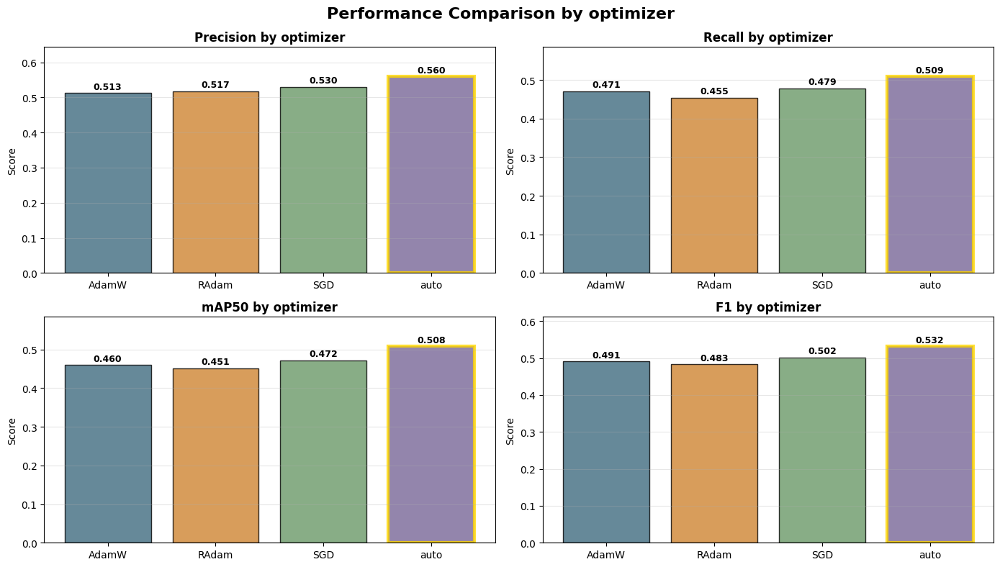

In [36]:
def final_score_parametric(df, metric, group_value, group_col="optimizer"):
    """
    Calcola la media delle ultime metriche per un valore specifico di una colonna categoriale.

    Args:
        df (pd.DataFrame)
        metric (str): colonna metrica
        group_value: valore della colonna categoriale da aggregare
        group_col (str): nome della colonna categoriale (es. optimizer, batch_size, fold_number)
    
    Returns:
        float: media delle ultime metriche per tutti i run e fold corrispondenti
    """
    df[group_col] = df[group_col].astype(str)
    group_value = str(group_value)

    runs = df[df[group_col] == group_value]['run_code'].unique()
    scores = []
    for run in runs:
        sub = df[(df['run_code'] == run) & (df[group_col] == group_value)]
        for fold, fd in sub.groupby("fold_number"):
            if not fd.empty:
                scores.append(fd[metric].iloc[-1])
    return np.mean(scores) if scores else None


def plot_comparison(df, group_col="optimizer", figsize=(14, 8)):
    """
    Grafico a barre comparativo parametrico per una colonna categoriale usando i colori definiti in COLORS.
    
    Args:
        df (pd.DataFrame)
        group_col (str): colonna categoriale da usare come confronto (es. optimizer, batch_size, fold_number)
        figsize (tuple): dimensione della figura
    """
    df[group_col] = df[group_col].astype(str)
    
    metrics = {
        'Precision': 'metrics/precision(B)',
        'Recall': 'metrics/recall(B)',
        'mAP50': 'metrics/mAP50(B)',
        'F1': 'metrics/f1(B)'
    }

    group_values = sorted(df[group_col].unique())
    
    # Usa i tuoi colori a ciclo
    base_colors = [COLORS['blue'], COLORS['orange'], COLORS['green'], COLORS['purple'], COLORS['gray']]
    colors = [base_colors[i % len(base_colors)] for i in range(len(group_values))]

    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()

    for i, (name, col) in enumerate(metrics.items()):
        ax = axes[i]
        scores = [final_score_parametric(df, col, val, group_col) for val in group_values]
        valid = [(val, s, c) for val, s, c in zip(group_values, scores, colors) if s is not None]

        if valid:
            vals_labels, vals, cols = zip(*valid)
            bars = ax.bar(vals_labels, vals, color=cols, alpha=0.8, edgecolor="black")

            # valori sopra le barre
            for b, v in zip(bars, vals):
                ax.text(b.get_x() + b.get_width() / 2, v * 1.01, f"{v:.3f}", 
                        ha="center", va="bottom", fontsize=9, fontweight="bold")

            # evidenzia best
            best = np.argmax(vals)
            bars[best].set_edgecolor("gold")
            bars[best].set_linewidth(3)

            ax.set_ylim(0, max(vals) * 1.15)
            ax.set_title(f"{name} by {group_col}", fontsize=12, fontweight="bold")
            ax.set_ylabel("Score")
            ax.grid(axis="y", alpha=0.3)

    plt.suptitle(f"Performance Comparison by {group_col}", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

plot_comparison(df, group_col='optimizer')

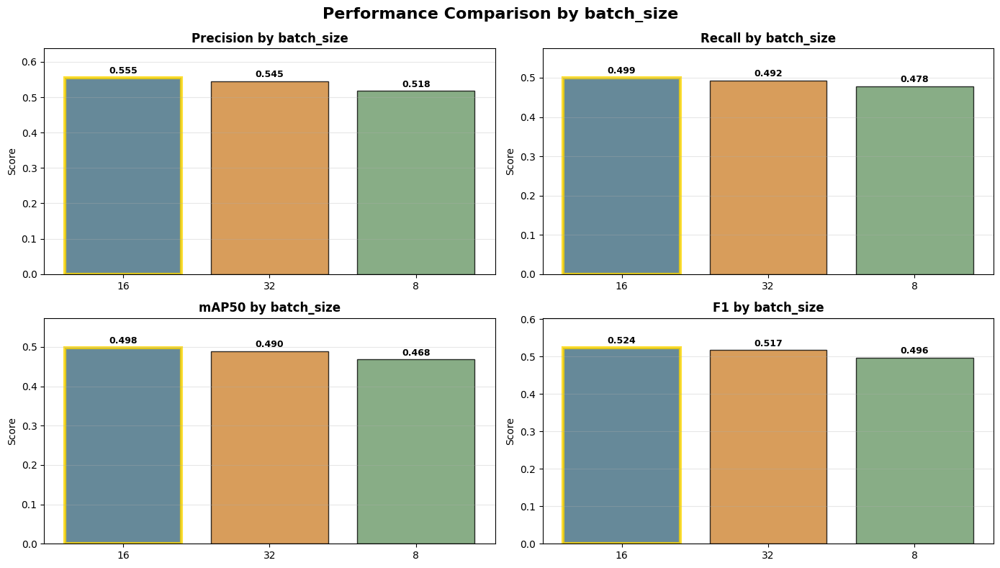

In [37]:
plot_comparison(df, group_col='batch_size')

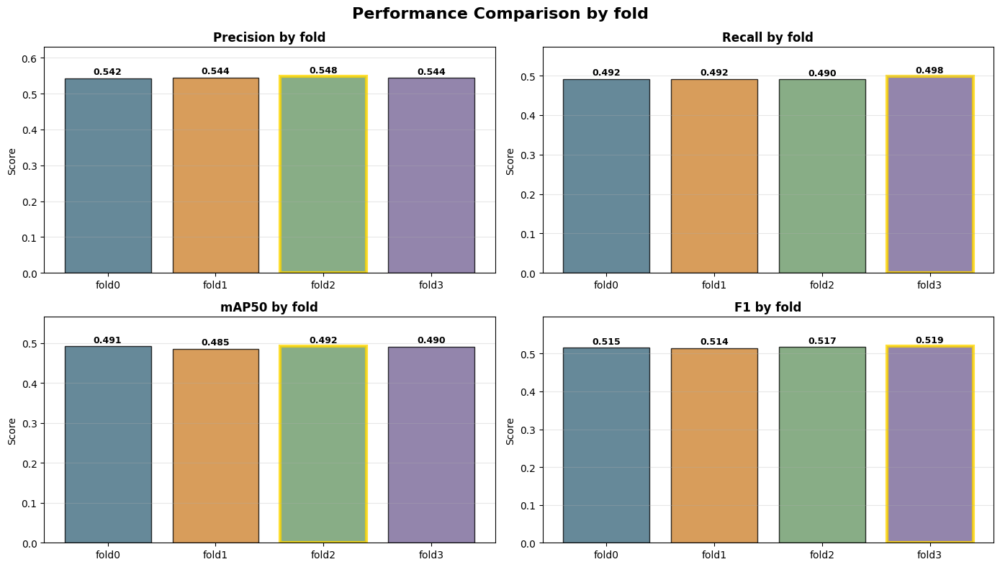

In [38]:
plot_comparison(df, group_col='fold')

### 6.3 Curve di Training per Categoria

Visualizziamo l'evoluzione media delle metriche raggruppando per categorie di iperparametri, con bande di deviazione standard.

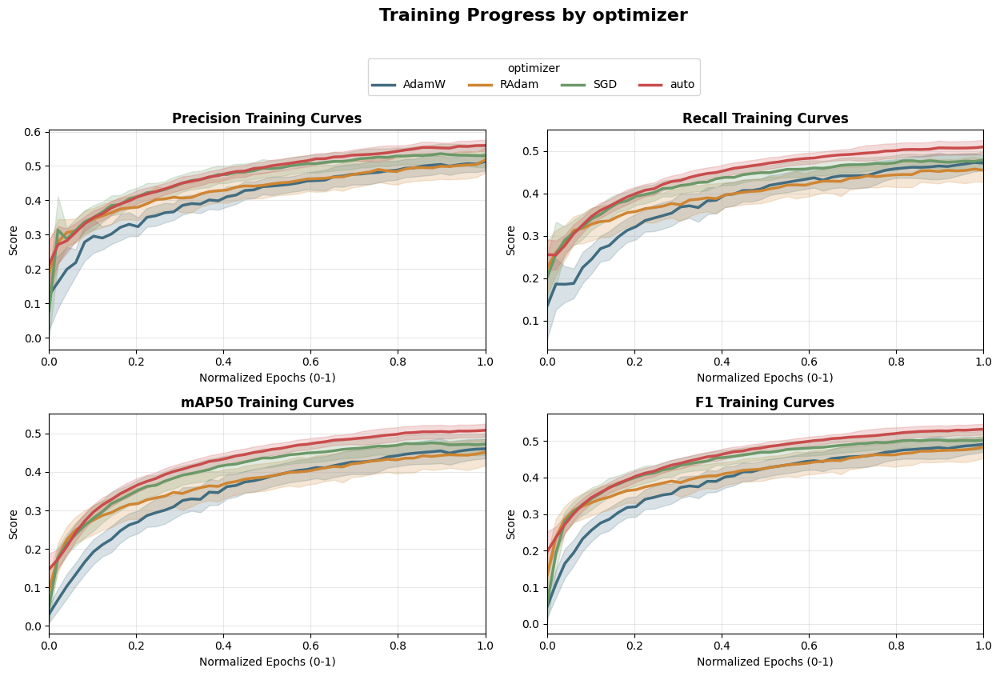

In [59]:
def plot_categorical_curves(df, category_col="optimizer", figsize=(14, 8)):
    """
    Plotta le curve di training normalizzate per ogni valore di una colonna categoriale
    (es. optimizer, batch_size, fold), con media e banda di deviazione standard.
    Legenda unica esterna.
    """
    df[category_col] = df[category_col].astype(str)
    
    metrics = {
        'Precision': 'metrics/precision(B)',
        'Recall': 'metrics/recall(B)',
        'mAP50': 'metrics/mAP50(B)',
        'F1': 'metrics/f1(B)'
    }

    cat_values = sorted(df[category_col].unique())
    base_colors = [COLORS['blue'], COLORS['orange'], COLORS['green'], COLORS['red'], COLORS['gray']]
    colors = [base_colors[i % len(base_colors)] for i in range(len(cat_values))]

    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()

    legend_handles = []  # raccolta delle linee per legenda globale

    for i, (name, col) in enumerate(metrics.items()):
        ax = axes[i]
        for val, color in zip(cat_values, colors):
            curves = []
            subset = df[df[category_col] == val]
            for (run, fold), fd in subset.groupby(['run_code', 'fold_number']):
                if len(fd) > 1:
                    fd = fd.sort_values("epoch")
                    epochs = fd["epoch"].values
                    vals = fd[col].values
                    # normalizzazione tra 0 e 1
                    norm_e = (epochs - epochs.min()) / (epochs.max() - epochs.min())
                    # interpola a 50 punti uniformi
                    curves.append(np.interp(np.linspace(0,1,50), norm_e, vals))
            if curves:
                curves = np.vstack(curves)
                mean, std = curves.mean(0), curves.std(0)
                x = np.linspace(0,1,50)
                line, = ax.plot(x, mean, color=color, lw=2.5, label=val)
                ax.fill_between(x, mean-std/2, mean+std/2, color=color, alpha=0.2)

                # aggiunge l'handle alla lista (solo la prima volta che appare)
                if i == 0:
                    legend_handles.append(line)

        ax.set_title(f"{name} Training Curves", fontsize=12, fontweight="bold")
        ax.set_xlabel("Normalized Epochs (0-1)")
        ax.set_ylabel("Score")
        ax.set_xlim(0,1)
        ax.grid(alpha=0.3)

    # Legenda unica esterna
    fig.legend(
        handles=legend_handles,
        labels=cat_values,
        title=category_col,
        loc='upper center',
        ncol=len(cat_values),
        bbox_to_anchor=(0.48, 0.98)
    )

    plt.suptitle(f"Training Progress by {category_col}", fontsize=16, fontweight="bold", x=0.48, y=1.05)
    plt.tight_layout(rect=[0,0,0.9,0.95])
    plt.show()
    
plot_categorical_curves(df, category_col='optimizer')

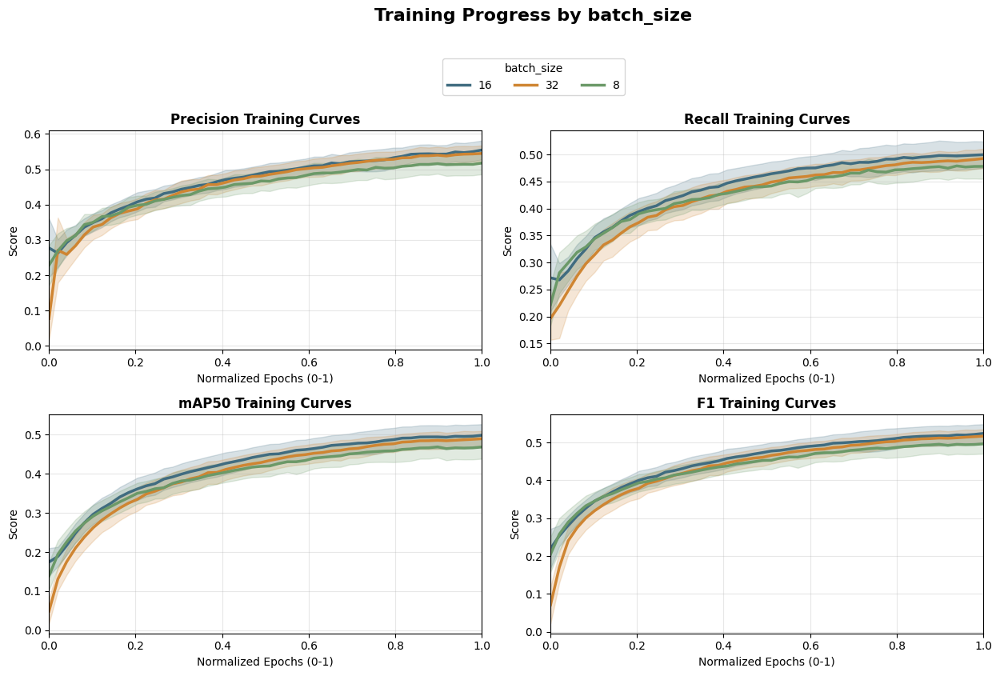

In [60]:
plot_categorical_curves(df, category_col='batch_size')

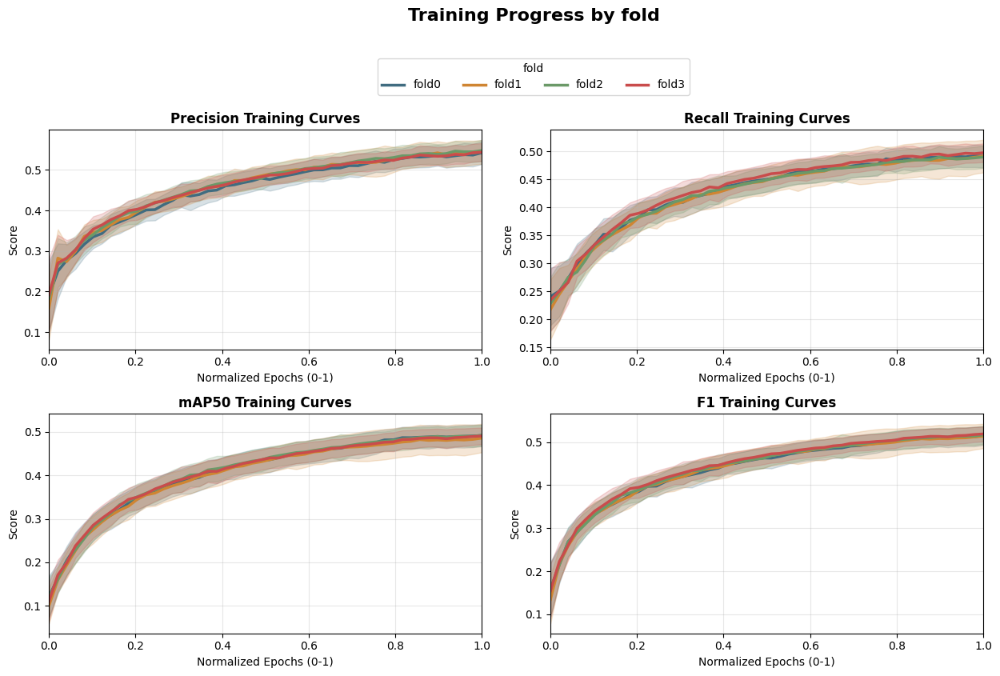

In [61]:
plot_categorical_curves(df, category_col='fold')

## 7. Feature Importance e Correlazioni

### 7.1 Permutation Feature Importance

Utilizziamo Random Forest e Permutation Importance per identificare quali iperparametri hanno maggiore impatto sulle performance. I colori indicano il segno dell'effetto (positivo/negativo).

Fitting del modello Random Forest Regressor su 'YOLOv11n'... OK!
Calcolo Permutation Importance:


100%|██████████| 10/10 [00:17<00:00,  1.74s/it]


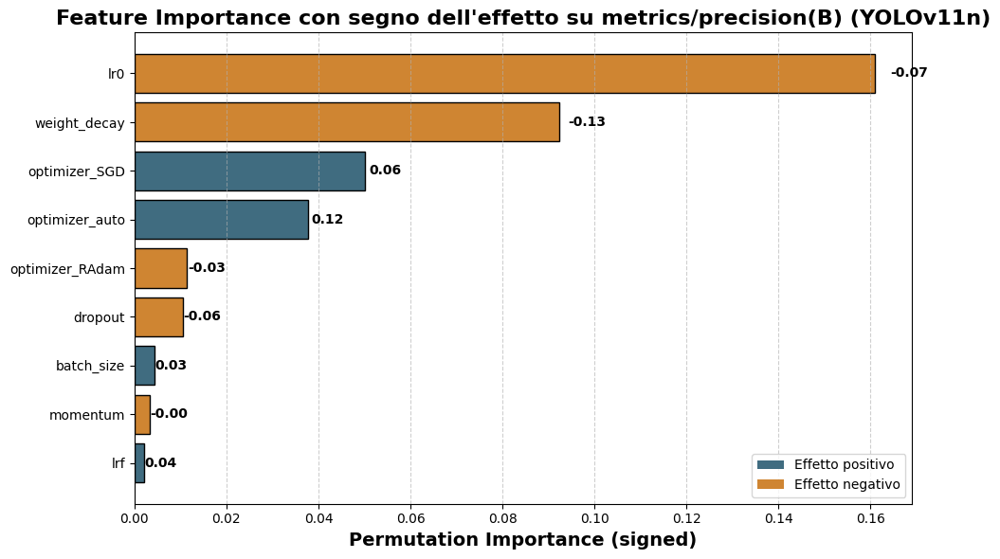

,feature,importance,std,effect_corr
3,lrf,0.002046,0.0,0.041445
4,momentum,0.003278,0.0,-0.003246
0,batch_size,0.004349,0.0,0.026953
1,dropout,0.010458,0.0,-0.062079
6,optimizer_RAdam,0.011385,0.0,-0.033326
8,optimizer_auto,0.037687,0.0,0.124263
7,optimizer_SGD,0.050076,0.0,0.055425
5,weight_decay,0.092394,0.0,-0.130921
2,lr0,0.160994,0.0,-0.071909


In [42]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from tqdm import tqdm
from matplotlib.patches import Patch

def plot_permutation_fi_signed(df, model_name, target_col='metrics/precision(B)', n_repeats=20):
    """
    Plotta il Feature Importance con segno dell'effetto per un modello specifico,
    mostrando anche i valori di correlazione accanto alle barre.
    
    Args:
        df (pd.DataFrame): dataframe con colonne hyperparameter + target_col + 'model'
        model_name (str): nome del modello da filtrare
        target_col (str): la metrica su cui valutare l'importanza
        n_repeats (int): numero di ripetizioni per la Permutation Importance
    """
    # Filtra per modello
    df_model = df[df['model'] == model_name]
    if df_model.empty:
        raise ValueError(f"Nessun dato trovato per il modello '{model_name}'")

    features = ['batch_size', 'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay']
    X = df_model[features].copy()
    y = df_model[target_col].values

    # Codifica categoriche
    X = pd.get_dummies(X, columns=['optimizer'], drop_first=True)
    feature_names = X.columns

    # Fit modello
    model = RandomForestRegressor(n_estimators=200, random_state=42)
    print(f"Fitting del modello Random Forest Regressor su '{model_name}'...", end=' ')
    model.fit(X, y)
    print_color("OK!", "green")

    # Permutation Importance con progress bar
    print("Calcolo Permutation Importance:")
    importances_mean = np.zeros(X.shape[1])
    importances_std = np.zeros(X.shape[1])

    for i in tqdm(range(n_repeats)):
        r = permutation_importance(model, X, y, n_repeats=1, random_state=i, scoring='r2')
        importances_mean += r.importances_mean
        importances_std += r.importances_std

    importances_mean /= n_repeats
    importances_std /= n_repeats

    fi_df = pd.DataFrame({
        'feature': feature_names,
        'importance': importances_mean,
        'std': importances_std
    }).sort_values('importance', ascending=True)

    # Calcolo segno effetto con gestione robusta
    signed_colors = []
    corr_values = []
    for f in fi_df['feature']:
        try:
            x = pd.to_numeric(X[f], errors="coerce")
            if x.isnull().all():
                corr = np.nan
            else:
                corr = np.corrcoef(x.fillna(0), y)[0, 1]
        except Exception:
            corr = np.nan
        corr_values.append(corr)
        if np.isnan(corr):
            signed_colors.append("lightgray")  # neutro se non calcolabile
        else:
            signed_colors.append(COLORS['blue'] if corr >= 0 else COLORS['orange'])

    # Plot signed con valori accanto
    plt.figure(figsize=(10,6))
    bars = plt.barh(fi_df['feature'], fi_df['importance'],
                    color=signed_colors, edgecolor='black')

    plt.xlabel("Permutation Importance (signed)", fontsize=14, fontweight='bold')
    plt.title(f"Feature Importance con segno dell'effetto su {target_col} ({model_name})",
              fontsize=16, fontweight='bold')
    plt.grid(axis='x', linestyle='--', alpha=0.6)

    # Aggiungi valori di correlazione a destra di ogni barra
    for bar, corr in zip(bars, corr_values):
        width = bar.get_width()
        if not np.isnan(corr):
            plt.text(width + abs(width)*0.02, bar.get_y() + bar.get_height()/2, f"{corr:.2f}",
                     va='center', ha='left', fontsize=10, fontweight='bold')

    # Legenda manuale
    legend_elements = [
        Patch(facecolor=COLORS['blue'], label='Effetto positivo'),
        Patch(facecolor=COLORS['orange'], label='Effetto negativo')
    ]
    plt.legend(handles=legend_elements, loc='lower right')
    plt.tight_layout()
    plt.show()

    fi_df['effect_corr'] = corr_values
    return fi_df

plot_permutation_fi_signed(df, model_name='YOLOv11n', target_col='metrics/precision(B)', n_repeats=10)

Fitting del modello Random Forest Regressor su 'YOLOv11s'... OK!
Calcolo Permutation Importance:


100%|██████████| 10/10 [00:18<00:00,  1.81s/it]


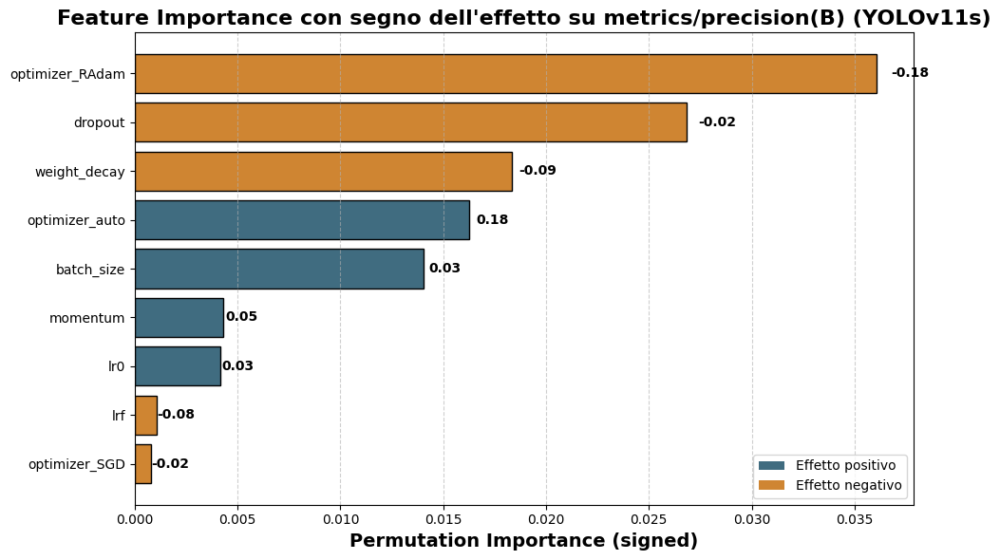

,feature,importance,std,effect_corr
7,optimizer_SGD,0.000773,0.0,-0.020243
3,lrf,0.001072,0.0,-0.079118
2,lr0,0.004160,0.0,0.027372
4,momentum,0.004313,0.0,0.048444
0,batch_size,0.014024,0.0,0.025836
8,optimizer_auto,0.016257,0.0,0.180059
5,weight_decay,0.018320,0.0,-0.091111
1,dropout,0.026844,0.0,-0.022866
6,optimizer_RAdam,0.036069,0.0,-0.182039


In [43]:
plot_permutation_fi_signed(df, model_name='YOLOv11s', target_col='metrics/precision(B)', n_repeats=10)

### 7.2 Matrice di Correlazione

Analizziamo le correlazioni tra loss e metriche per comprendere le relazioni tra diverse componenti del sistema.

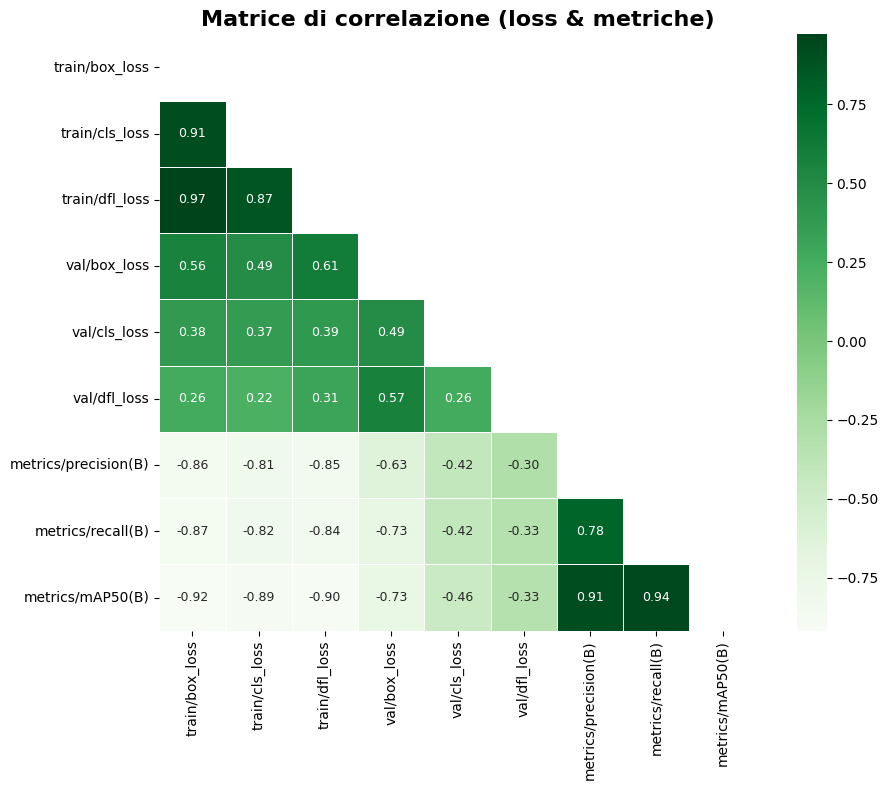

In [44]:
def plot_corr_matrix(df, variables=None, figsize=(10,8), cmap="coolwarm"):
    """
    Plotta la matrice di correlazione triangolare tra variabili di loss e metriche.
    
    Args:
        df (pd.DataFrame): dataframe con le colonne delle metriche/loss.
        variables (list, optional): lista di variabili da includere. Se None, usa default (9 variabili).
        figsize (tuple): dimensione figura.
        cmap (str): colormap della heatmap.
    """
    if variables is None:
        variables = [
            "train/box_loss", "train/cls_loss", "train/dfl_loss",
            "val/box_loss", "val/cls_loss", "val/dfl_loss",
            "metrics/precision(B)", "metrics/recall(B)", "metrics/mAP50(B)"
            # se vuoi 10 variabili, aggiungi anche "metrics/f1(B)"
        ]
    
    corr = df[variables].corr()

    # Maschera triangolare
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Plot
    plt.figure(figsize=figsize)
    sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap=cmap,
                cbar=True, square=True, linewidths=.5,
                annot_kws={"size": 9})
    plt.title("Matrice di correlazione (loss & metriche)", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

# --- Uso ---
plot_corr_matrix(df, cmap='Greens')

### 7.3 Relazioni Iperparametri-Performance

Scatter plot che mostrano la relazione diretta tra ogni iperparametro e le metriche finali, con rette di regressione e coefficienti di correlazione.

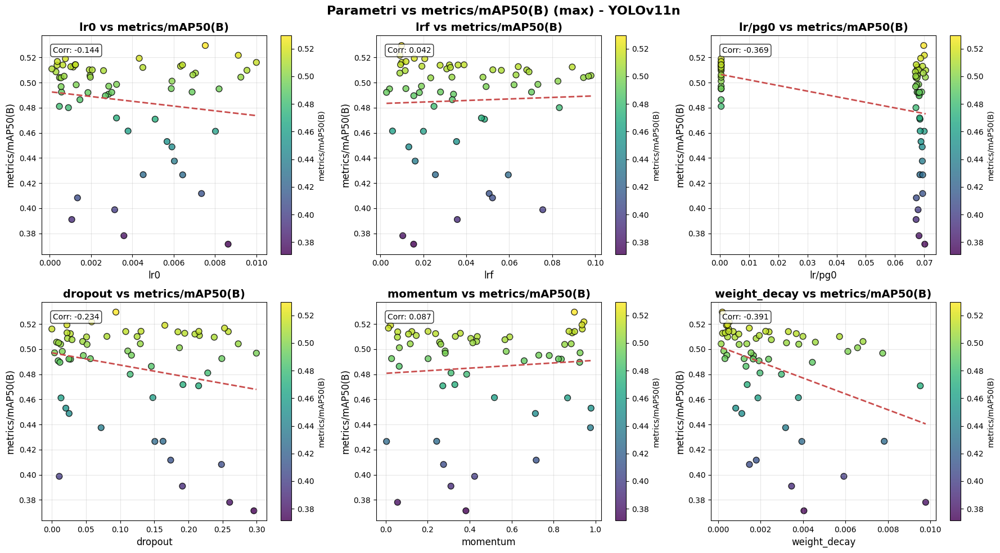

In [49]:
def plot_param_vs_metric(
    df,
    params,
    metric,
    model_name,
    mode="last",
    cmap="viridis"
):
    """
    Scatter plot iperparametri vs metrica, un grafico per parametro.
    Colore dei punti = valore della metrica (asse y).
    Aggiunge retta di regressione rossa.

    Args:
        df (pd.DataFrame): dati con run_code, fold_number, parametri, metriche.
        params (list[str]): lista di iperparametri da plottare.
        metric (str): colonna metrica da analizzare.
        model_name (str): modello da filtrare.
        mode (str): criterio di aggregazione ('last', 'max', 'min').
        cmap (str): colormap matplotlib per i punti.
    """
    # --- Filtro modello ---
    df = df[df["model"] == model_name]
    if df.empty:
        raise ValueError(f"Nessun dato trovato per il modello '{model_name}'.")

    # --- Aggregazione: un punto = un run (media fold) ---
    grouped = []
    for run, d in df.groupby("run_code"):
        fold_vals = []
        for fold, fd in d.groupby("fold_number"):
            vals = fd[metric].dropna()
            if vals.empty:
                continue
            if mode == "last":
                fold_vals.append(vals.iloc[-1])
            elif mode == "max":
                fold_vals.append(vals.max())
            elif mode == "min":
                fold_vals.append(vals.min())
            else:
                raise ValueError("mode deve essere 'last', 'max' o 'min'")
        if fold_vals:
            row = d.iloc[0][params].to_dict()
            row.update({"run_code": run, "score": np.mean(fold_vals)})
            grouped.append(row)

    df_runs = pd.DataFrame(grouped)
    if df_runs.empty:
        raise ValueError("Nessun run valido trovato per i parametri e la metrica selezionata.")

    # --- Plot ---
    n = len(params)
    nrows, ncols = int(np.ceil(n/3)), min(3, n)
    fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 5*nrows))
    axes = np.array(axes).reshape(-1)  # flatten sempre in array

    for i, param in enumerate(params):
        ax = axes[i]
        y_vals = df_runs["score"].values
        x_vals = df_runs[param].values

        sc = ax.scatter(
            x_vals, y_vals,
            c=y_vals,
            cmap=cmap,
            s=60, edgecolor="black", alpha=0.8
        )
        ax.set_xlabel(param, fontsize=12)
        ax.set_ylabel(metric, fontsize=12)
        ax.set_title(f"{param} vs {metric}", fontsize=14, fontweight="bold")
        ax.grid(alpha=0.3)

        # Correlazione e retta di regressione
        if pd.api.types.is_numeric_dtype(df_runs[param]):
            corr = df_runs[param].corr(df_runs["score"])
            ax.text(
                0.05, 0.95, f"Corr: {corr:.3f}",
                transform=ax.transAxes,
                bbox=dict(boxstyle="round", facecolor="white", alpha=0.8),
                ha="left", va="top"
            )

            # Regressione lineare
            slope, intercept = np.polyfit(x_vals, y_vals, 1)
            x_line = np.linspace(x_vals.min(), x_vals.max(), 100)
            y_line = slope * x_line + intercept
            ax.plot(x_line, y_line, color=COLORS["red"], linewidth=2.0, linestyle="--")

        # Colorbar
        cbar = plt.colorbar(sc, ax=ax)
        cbar.set_label(metric, fontsize=10)

    # Nascondi subplot vuoti (se param < nrows*ncols)
    for j in range(len(params), len(axes)):
        axes[j].set_visible(False)

    fig.suptitle(f"Parametri vs {metric} ({mode}) - {model_name}", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

    return df_runs

df_runs = plot_param_vs_metric(
    df,
    params=['lr0', 'lrf', 'lr/pg0', 'dropout', 'momentum', 'weight_decay'],
    metric="metrics/mAP50(B)",
    model_name="YOLOv11n",
    mode="max"
)

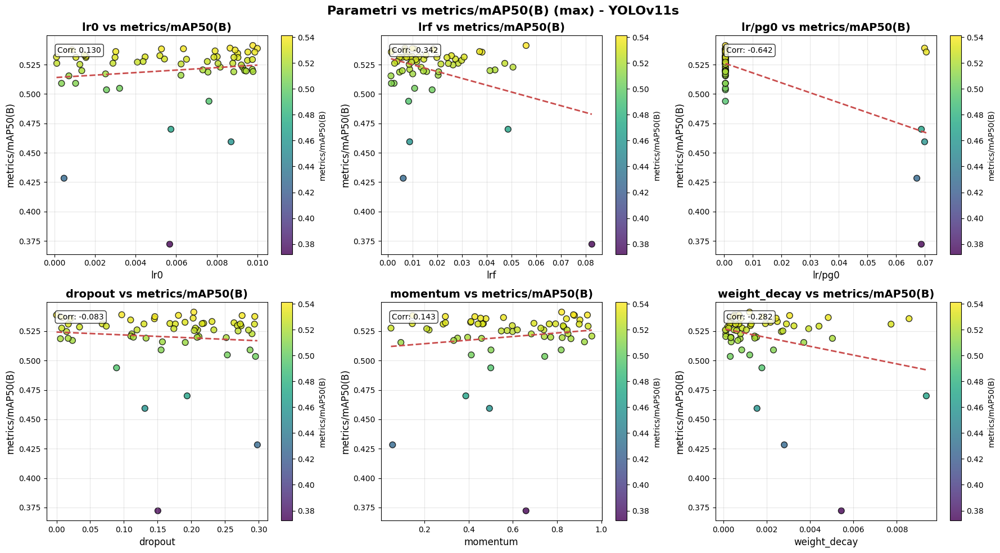

In [50]:
df_runs = plot_param_vs_metric(
    df,
    params=['lr0', 'lrf', 'lr/pg0', 'dropout', 'momentum', 'weight_decay'],
    metric="metrics/mAP50(B)",
    model_name="YOLOv11s",
    mode="max"
)

## 8. Validazione Statistica delle Differenze

### 8.1 Test di Significatività

Applichiamo test statistici non-parametrici per validare formalmente le differenze osservate tra configurazioni, andando oltre la sola valutazione visiva.

Il test di Kruskal-Wallis verifica se esistono differenze significative tra i gruppi, seguito da test post-hoc Mann-Whitney U per identificare quali coppie di configurazioni differiscono significativamente.

In [65]:
# =============================================================================
# 1. ANALISI STATISTICA FORMALE
# =============================================================================

def statistical_comparison(df, group_col='optimizer', metric='metrics/precision(B)'):
    """
    Test statistici formali per confrontare performance tra gruppi.
    """
    from scipy.stats import kruskal, mannwhitneyu
    import itertools
    
    # Prepara dati finali
    final_metrics = prepare_final_metrics(df, split_col=group_col)
    groups = []
    group_names = []
    
    for group_val in final_metrics[group_col].unique():
        group_data = final_metrics[final_metrics[group_col] == group_val][metric].values
        groups.append(group_data)
        group_names.append(group_val)
    
    # Test Kruskal-Wallis (non-parametrico)
    h_stat, p_value = kruskal(*groups)
    print(f"Kruskal-Wallis Test per {group_col}:")
    print(f"H-statistic: {h_stat:.4f}, p-value: {p_value:.4f}")
    print(f"Significativo: {'Sì' if p_value < 0.05 else 'No'}")
    
    # Test post-hoc Mann-Whitney U (se significativo)
    if p_value < 0.05 and len(groups) > 2:
        print("\nTest post-hoc Mann-Whitney U:")
        for i, j in itertools.combinations(range(len(groups)), 2):
            u_stat, p_val = mannwhitneyu(groups[i], groups[j], alternative='two-sided')
            print(f"{group_names[i]} vs {group_names[j]}: U={u_stat:.2f}, p={p_val:.4f}")
    
    return h_stat, p_value

# Colonne categoriali su cui confrontare
group_cols = ["optimizer", "batch_size", "fold"]

# Metrica da testare
metric = "metrics/precision(B)"

# Esegui i test
results = {}
for group_col in group_cols:
    print("="*80)
    print(f"Test statistico per {group_col} - {metric}")
    h_stat, p_value = statistical_comparison(df, group_col=group_col, metric=metric)
    results[group_col] = (h_stat, p_value)
    print()

Test statistico per optimizer - metrics/precision(B)
Kruskal-Wallis Test per optimizer:
H-statistic: 18.1873, p-value: 0.0004
Significativo: Sì

Test post-hoc Mann-Whitney U:
RAdam vs auto: U=415.00, p=0.0161
RAdam vs AdamW: U=126.00, p=0.4588
RAdam vs SGD: U=126.00, p=0.3818
auto vs AdamW: U=769.00, p=0.0000
auto vs SGD: U=720.00, p=0.3075
AdamW vs SGD: U=68.00, p=0.1380

Test statistico per batch_size - metrics/precision(B)
Kruskal-Wallis Test per batch_size:
H-statistic: 11.7564, p-value: 0.0028
Significativo: Sì

Test post-hoc Mann-Whitney U:
16 vs 32: U=1680.00, p=0.0056
16 vs 8: U=654.00, p=0.0060
32 vs 8: U=609.00, p=0.1797

Test statistico per fold - metrics/precision(B)
Kruskal-Wallis Test per fold:
H-statistic: 2.0397, p-value: 0.5642
Significativo: No



I risultati dei test statistici riportati mostrano l'analisi della metrica **Precision** rispetto a tre variabili categoriali: `optimizer`, `batch_size` e `fold`. 

- **Kruskal-Wallis Test**: è un test non parametrico che confronta le mediane di più gruppi indipendenti. L'**H-statistic** indica la differenza tra i gruppi e il **p-value** valuta la significatività statistica.
- **Post-hoc Mann-Whitney U**: test non parametrico per confronti a coppie, eseguito solo se il Kruskal-Wallis è significativo.

**Interpretazione dei risultati:**

1. **Optimizer**
   - H-statistic = 18.1873, p-value = 0.0004 → differenze tra gli optimizer significative.
   - Confronti a coppie mostrano, ad esempio, che `auto` vs `AdamW` è altamente significativo (p=0.0000), mentre altri confronti come `RAdam` vs `AdamW` non lo sono (p=0.4588).  
   - Conclusione: la scelta dell'optimizer influisce significativamente sulla Precision.

2. **Batch size**
   - H-statistic = 11.7564, p-value = 0.0028 → differenze tra batch size significative.
   - Confronti a coppie: `16 vs 32` e `16 vs 8` sono significativi (p<0.01), mentre `32 vs 8` non lo è (p=0.1797).  
   - Conclusione: il batch size ha un effetto significativo sulla Precision, soprattutto per il valore 16.

3. **Fold**
   - H-statistic = 2.0397, p-value = 0.5642 → differenze tra fold non significative.
   - Conclusione: la variazione tra i fold non influisce in modo rilevante sulla Precision.

In sintesi, **optimizer** e **batch size** influenzano significativamente la performance, mentre i diversi **fold** non mostrano differenze rilevanti (sono quindi scelti in modo abbastanza uniforme).

## 9. Analisi di Convergenza e Early Stopping

### 9.1 Identificazione Pattern di Convergenza

Analizziamo se i run sono terminati per vera convergenza (stabilizzazione delle metriche) o per raggiungimento del limite massimo di epoche. Questo aiuta a comprendere se alcuni iperparametri richiedono più tempo per convergere.


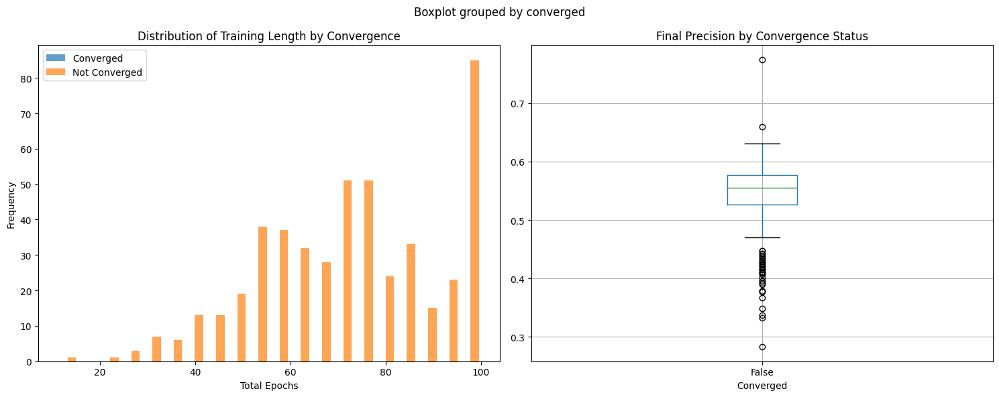

In [66]:
# =============================================================================
# 2. ANALISI EARLY STOPPING E CONVERGENZA
# =============================================================================

def analyze_convergence(df, window=10, threshold=0.001):
    """
    Analizza se i run sono terminati per convergenza o limite epoche.
    """
    convergence_analysis = []
    
    for (run, fold), group in df.groupby(['run_code', 'fold_number']):
        group = group.sort_values('epoch')
        
        if len(group) < window + 1:
            continue
            
        # Analizza ultimi 'window' valori per ogni metrica
        last_values = group.tail(window)
        metrics_cols = [col for col in group.columns if col.startswith('metrics/')]
        
        converged_metrics = []
        for metric in metrics_cols:
            values = last_values[metric].values
            if len(values) >= 2:
                # Coefficiente di variazione negli ultimi epochs
                cv = np.std(values) / np.mean(values) if np.mean(values) != 0 else float('inf')
                converged = cv < threshold
                converged_metrics.append(converged)
        
        convergence_analysis.append({
            'run_code': run,
            'fold_number': fold,
            'total_epochs': len(group),
            'converged': np.mean(converged_metrics) > 0.5,  # Maggioranza metriche converged
            'final_precision': group['metrics/precision(B)'].iloc[-1],
            'optimizer': group['optimizer'].iloc[0],
            'batch_size': group['batch_size'].iloc[0]
        })
    
    conv_df = pd.DataFrame(convergence_analysis)
    
    # Visualizzazione
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Distribuzione epoche per convergenza
    axes[0].hist([conv_df[conv_df['converged']]['total_epochs'], 
                  conv_df[~conv_df['converged']]['total_epochs']], 
                 bins=20, alpha=0.7, label=['Converged', 'Not Converged'])
    axes[0].set_xlabel('Total Epochs')
    axes[0].set_ylabel('Frequency')
    axes[0].set_title('Distribution of Training Length by Convergence')
    axes[0].legend()
    
    # Performance vs convergenza
    conv_df.boxplot(column='final_precision', by='converged', ax=axes[1])
    axes[1].set_title('Final Precision by Convergence Status')
    axes[1].set_xlabel('Converged')
    
    plt.tight_layout()
    plt.show()
    
    return conv_df

convergence_df = analyze_convergence(df, window=10, threshold=0.001)

**Metriche Analizzate:**
- **Coefficiente di Variazione**: Misura la stabilità negli ultimi epochs
- **Distribuzione epoche**: Confronta run convergenti vs non convergenti
- **Performance finale**: Verifica se convergenza implica migliori risultati

MANCA NOME ASSE Y 

## 10. Analisi Overfitting e Generalizzazione

### 10.1 Quantificazione del Gap Training-Validation

Identifichiamo configurazioni soggette a overfitting analizzando il divario tra performance di training e validation negli ultimi epochs del training.

**Indicatori Analizzati:**
- **Gap finale**: Differenza training-validation media negli ultimi 20% epochs
- **Correlazione con dropout**: Efficacia della regolarizzazione
- **Impatto su performance**: Relazione tra overfitting e risultati finali

Analisi overfitting per il modello: YOLOv11n


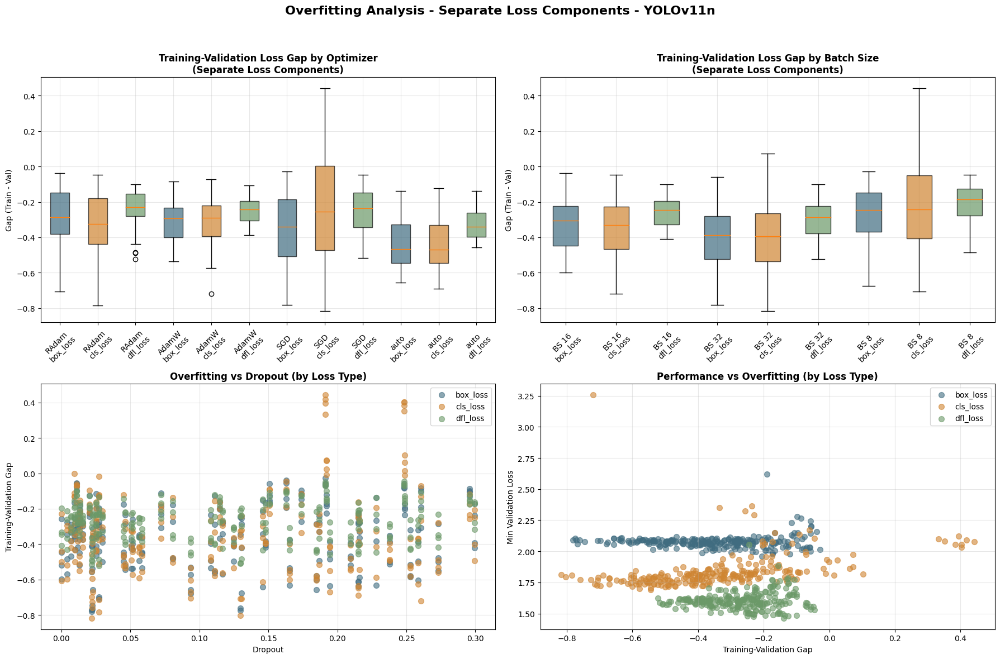


OVERFITTING ANALYSIS - SEPARATE LOSS COMPONENTS - YOLOv11n

📊 Gap medio per Optimizer e Loss Type:
                       mean     std  count
optimizer loss_type                       
AdamW     box_loss  -0.3047  0.1100     44
          cls_loss  -0.3082  0.1304     44
          dfl_loss  -0.2488  0.0682     44
RAdam     box_loss  -0.2922  0.1725     64
          cls_loss  -0.3270  0.1791     64
          dfl_loss  -0.2351  0.1033     64
SGD       box_loss  -0.3532  0.2171     56
          cls_loss  -0.2236  0.3536     56
          dfl_loss  -0.2501  0.1358     56
auto      box_loss  -0.4360  0.1366     76
          cls_loss  -0.4457  0.1305     76
          dfl_loss  -0.3239  0.0870     76

📊 Gap medio per Batch Size e Loss Type:
                        mean     std  count
batch_size loss_type                       
16         box_loss  -0.3206  0.1514     52
           cls_loss  -0.3380  0.1582     52
           dfl_loss  -0.2508  0.0887     52
32         box_loss  -0.3990  0.1717 

In [ ]:
# =============================================================================
# 3. ANALISI OVERFITTING/UNDERFITTING (TRAIN & VAL LOSS) - LOSS SEPARATE
# =============================================================================

def analyze_overfitting_losses_separate(df, model_name=None, smoothing_window=5):
    """
    Analizza gap tra loss di training e validation per identificare overfitting.
    Mostra separatamente le 3 componenti di loss (box, cls, dfl).
    
    Args:
        df (pd.DataFrame): DataFrame con tutte le informazioni di training/validation
        model_name (str, optional): se specificato, filtra il dataset per questo modello
        smoothing_window (int): finestra per lo smoothing rolling delle loss
    """
    if model_name is not None:
        df = df[df['model'] == model_name].copy()
        print(f"Analisi overfitting per il modello: {model_name}")

    train_losses = ['train/box_loss', 'train/cls_loss', 'train/dfl_loss']
    val_losses = ['val/box_loss', 'val/cls_loss', 'val/dfl_loss']
    loss_names = ['box_loss', 'cls_loss', 'dfl_loss']

    overfitting_analysis = []

    for (run, fold), group in df.groupby(['run_code', 'fold_number']):
        group = group.sort_values('epoch')
        if len(group) < 10:
            continue

        # Smooth delle loss
        smoothed_train = group[train_losses].rolling(window=smoothing_window, min_periods=1).mean()
        smoothed_val = group[val_losses].rolling(window=smoothing_window, min_periods=1).mean()

        # Gap per ogni tipo di loss
        for i, loss_type in enumerate(loss_names):
            gap_per_epoch = smoothed_train.iloc[:, i] - smoothed_val.iloc[:, i]
            
            # Gap medio ultimi 20% delle epoche
            last_20pct = int(len(group) * 0.2)
            if last_20pct > 0:
                final_gap = gap_per_epoch.iloc[-last_20pct:].mean()
            else:
                final_gap = gap_per_epoch.iloc[-1]

            overfitting_analysis.append({
                'run_code': run,
                'fold_number': fold,
                'loss_type': loss_type,
                'final_gap': final_gap,
                'max_train_loss': smoothed_train.iloc[:, i].max(),
                'min_val_loss': smoothed_val.iloc[:, i].min(),
                'optimizer': group['optimizer'].iloc[0],
                'batch_size': group['batch_size'].iloc[0],
                'dropout': group['dropout'].iloc[0],
                'model': group['model'].iloc[0]
            })

    gap_df = pd.DataFrame(overfitting_analysis)

    # ---------------------------
    # Visualizzazione con boxplot separati per loss type
    # ---------------------------
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))

    # Colori per i tipi di loss
    loss_colors = {'box_loss': COLORS['blue'], 'cls_loss': COLORS['orange'], 'dfl_loss': COLORS['green']}

    # 1. Gap per optimizer (3 box per optimizer)
    optimizer_loss_data, optimizer_labels, optimizer_colors = [], [], []
    for opt in gap_df['optimizer'].unique():
        for loss_type in loss_names:
            data = gap_df[(gap_df['optimizer'] == opt) & (gap_df['loss_type'] == loss_type)]['final_gap']
            if len(data) > 0:
                optimizer_loss_data.append(data)
                optimizer_labels.append(f'{opt}\n{loss_type}')
                optimizer_colors.append(loss_colors[loss_type])
    bp1 = axes[0,0].boxplot(optimizer_loss_data, patch_artist=True, labels=optimizer_labels)
    for patch, color in zip(bp1['boxes'], optimizer_colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    axes[0,0].set_title('Training-Validation Loss Gap by Optimizer\n(Separate Loss Components)', fontweight='bold')
    axes[0,0].set_ylabel('Gap (Train - Val)')
    axes[0,0].tick_params(axis='x', rotation=45)
    axes[0,0].grid(True, alpha=0.3)

    # 2. Gap per batch size (3 box per batch size)
    batch_loss_data, batch_labels, batch_colors = [], [], []
    for batch in sorted(gap_df['batch_size'].unique()):
        for loss_type in loss_names:
            data = gap_df[(gap_df['batch_size'] == batch) & (gap_df['loss_type'] == loss_type)]['final_gap']
            if len(data) > 0:
                batch_loss_data.append(data)
                batch_labels.append(f'BS {batch}\n{loss_type}')
                batch_colors.append(loss_colors[loss_type])
    bp2 = axes[0,1].boxplot(batch_loss_data, patch_artist=True, labels=batch_labels)
    for patch, color in zip(bp2['boxes'], batch_colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    axes[0,1].set_title('Training-Validation Loss Gap by Batch Size\n(Separate Loss Components)', fontweight='bold')
    axes[0,1].set_ylabel('Gap (Train - Val)')
    axes[0,1].tick_params(axis='x', rotation=45)
    axes[0,1].grid(True, alpha=0.3)

    # 3. Gap vs dropout
    for loss_type in loss_names:
        data = gap_df[gap_df['loss_type'] == loss_type]
        axes[1,0].scatter(data['dropout'], data['final_gap'], alpha=0.6, color=loss_colors[loss_type], label=loss_type, s=50)
    axes[1,0].set_xlabel('Dropout')
    axes[1,0].set_ylabel('Training-Validation Gap')
    axes[1,0].set_title('Overfitting vs Dropout (by Loss Type)', fontweight='bold')
    axes[1,0].legend()
    axes[1,0].grid(True, alpha=0.3)

    # 4. Gap vs min val loss
    for loss_type in loss_names:
        data = gap_df[gap_df['loss_type'] == loss_type]
        axes[1,1].scatter(data['final_gap'], data['min_val_loss'], alpha=0.6, color=loss_colors[loss_type], label=loss_type, s=50)
    axes[1,1].set_xlabel('Training-Validation Gap')
    axes[1,1].set_ylabel('Min Validation Loss')
    axes[1,1].set_title('Performance vs Overfitting (by Loss Type)', fontweight='bold')
    axes[1,1].legend()
    axes[1,1].grid(True, alpha=0.3)

    plt.suptitle(f'Overfitting Analysis - Separate Loss Components{" - " + model_name if model_name else ""}', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0,0,1,0.95])
    plt.show()

    # ---------------------------
    # Statistiche riassuntive
    # ---------------------------
    print("\n" + "="*80)
    print(f"OVERFITTING ANALYSIS - SEPARATE LOSS COMPONENTS{' - ' + model_name if model_name else ''}")
    print("="*80)

    print("\n📊 Gap medio per Optimizer e Loss Type:")
    gap_summary_opt = gap_df.groupby(['optimizer', 'loss_type'])['final_gap'].agg(['mean', 'std', 'count'])
    print(gap_summary_opt.round(4))

    print("\n📊 Gap medio per Batch Size e Loss Type:")
    gap_summary_batch = gap_df.groupby(['batch_size', 'loss_type'])['final_gap'].agg(['mean', 'std', 'count'])
    print(gap_summary_batch.round(4))

    print("\n🚨 Configurazioni con maggiore overfitting per loss type:")
    for loss_type in loss_names:
        loss_data = gap_df[gap_df['loss_type'] == loss_type]
        threshold = loss_data['final_gap'].quantile(0.8)
        overfitting_configs = loss_data[loss_data['final_gap'] > threshold]

        print(f"\n{loss_type.upper()}:")
        print(f"  Soglia overfitting (80° percentile): {threshold:.4f}")
        print(f"  Configurazioni problematiche: {len(overfitting_configs)}")

        if len(overfitting_configs) > 0:
            worst_config = overfitting_configs.loc[overfitting_configs['final_gap'].idxmax()]
            print(f"  Peggiore: {worst_config['optimizer']} - BS{worst_config['batch_size']} - "
                  f"Dropout{worst_config['dropout']:.2f} (Gap: {worst_config['final_gap']:.4f})")

    return gap_df

overfitting_model_df = analyze_overfitting_losses_separate(df, model_name='YOLOv11n', smoothing_window=5)

Analisi overfitting per il modello: YOLOv11s


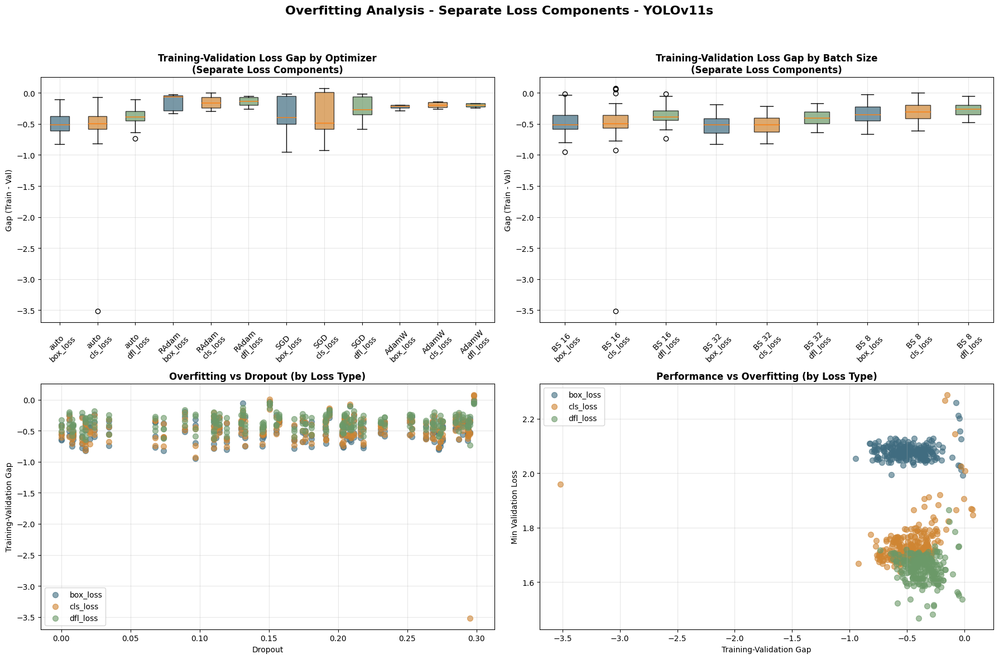


OVERFITTING ANALYSIS - SEPARATE LOSS COMPONENTS - YOLOv11s

📊 Gap medio per Optimizer e Loss Type:
                       mean     std  count
optimizer loss_type                       
AdamW     box_loss  -0.2259  0.0437      4
          cls_loss  -0.1952  0.0560      4
          dfl_loss  -0.1988  0.0380      4
RAdam     box_loss  -0.1454  0.1366      8
          cls_loss  -0.1520  0.1085      8
          dfl_loss  -0.1371  0.0769      8
SGD       box_loss  -0.3675  0.2987     12
          cls_loss  -0.3875  0.3499     12
          dfl_loss  -0.2509  0.1808     12
auto      box_loss  -0.5058  0.1477    216
          cls_loss  -0.4998  0.2486    216
          dfl_loss  -0.3829  0.1085    216

📊 Gap medio per Batch Size e Loss Type:
                        mean     std  count
batch_size loss_type                       
16         box_loss  -0.4891  0.1648    140
           cls_loss  -0.4918  0.3044    140
           dfl_loss  -0.3673  0.1173    140
32         box_loss  -0.5256  0.1626 

In [76]:
overfitting_model_df = analyze_overfitting_losses_separate(df, model_name='YOLOv11s', smoothing_window=5)

## 11. Analisi Multi-Obiettivo e Frontiere di Pareto

### 11.1 Trade-off Performance vs Efficienza

Identifichiamo configurazioni Pareto-ottimali che bilanciamo multiple metriche (precision, tempo di training, robustezza). Questo approccio è cruciale per deploy in produzione dove il tempo è un constraint.

**Obiettivi Considerati:**
- **Performance**: Precision, Recall, mAP50
- **Efficienza**: Tempo di training totale
- **Robustezza**: Stabilità cross-fold

Analisi Pareto per il modello: YOLOv11n


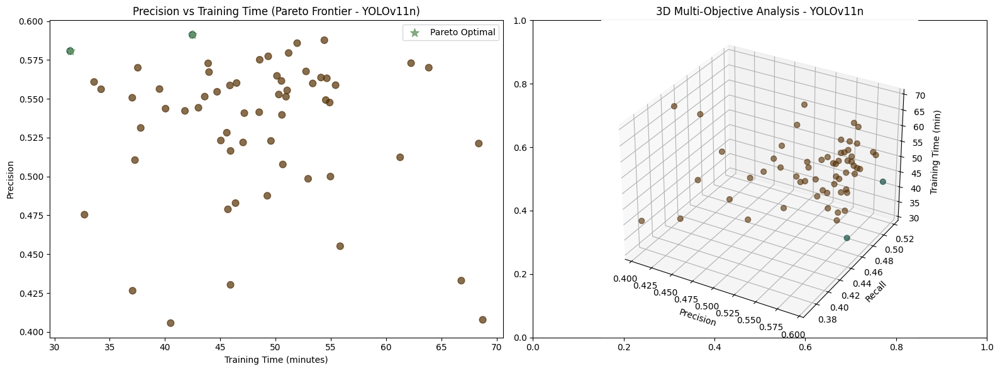


Configurazioni Pareto-ottimali:
    run_code     model  precision  recall  training_time_min optimizer  \
29  gtkhaheb  YOLOv11n     0.5807  0.4687            31.4217     RAdam   
32  i9ix6mkd  YOLOv11n     0.5912  0.5168            42.4832       SGD   

   batch_size  
29         32  
32         32  


In [96]:
# =============================================================================
# 4. ANALISI MULTI-OBIETTIVO (PARETO FRONTIERS) - MODEL SPECIFIC
# =============================================================================

def plot_pareto_analysis(df, objectives=['metrics/precision(B)', 'training_time_min'], model_name=None):
    """
    Analisi multi-obiettivo per identificare configurazioni Pareto-ottimali.
    Se model_name è specificato, filtra i dati per quel modello.
    """
    from sklearn.preprocessing import MinMaxScaler

    if model_name is not None:
        df = df[df['model'] == model_name].copy()
        print(f"Analisi Pareto per il modello: {model_name}")

    # Prepara dati: media per run
    # Prepara dati: media per run
    run_data = []
    for (run, model), group in df.groupby(['run_code', 'model']):
        # Prendi l'ultima epoca per ogni fold
        fold_last = group.groupby('fold_number').last()
        
        # Seleziona solo colonne numeriche per il calcolo della media
        numeric_cols = fold_last.select_dtypes(include=np.number).columns
        final_metrics = fold_last[numeric_cols].mean()
        
        max_time = group['time'].max() / 60.0  # in minuti
        
        run_data.append({
            'run_code': run,
            'model': model,
            'precision': final_metrics['metrics/precision(B)'],
            'recall': final_metrics['metrics/recall(B)'],
            'mAP50': final_metrics['metrics/mAP50(B)'],
            'training_time_min': max_time,
            'optimizer': group['optimizer'].iloc[0],
            'batch_size': group['batch_size'].iloc[0]
        })
    
    run_df = pd.DataFrame(run_data)
    
    # Normalizzazione per Pareto (precision: max, time: min)
    scaler = MinMaxScaler()
    pareto_data = run_df[['precision', 'training_time_min']].copy()
    pareto_data['training_time_min'] = 1 - pareto_data['training_time_min']  # Inverti per minimizzare
    pareto_normalized = scaler.fit_transform(pareto_data)
    
    # Identifica punti Pareto-dominanti
    def is_pareto_efficient(costs):
        is_efficient = np.ones(costs.shape[0], dtype=bool)
        for i, c in enumerate(costs):
            if is_efficient[i]:
                is_efficient[is_efficient] = np.any(costs[is_efficient] > c, axis=1)
                is_efficient[i] = True
        return is_efficient
    
    pareto_mask = is_pareto_efficient(pareto_normalized)
    
    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Precision vs Training Time
    scatter = axes[0].scatter(run_df['training_time_min'], run_df['precision'],
                             c=pareto_mask, cmap='BrBG', s=60, alpha=0.7)
    axes[0].set_xlabel('Training Time (minutes)')
    axes[0].set_ylabel('Precision')
    axes[0].set_title(f'Precision vs Training Time (Pareto Frontier{" - " + model_name if model_name else ""})')
    
    # Evidenzia punti Pareto
    pareto_runs = run_df[pareto_mask]
    axes[0].scatter(pareto_runs['training_time_min'], pareto_runs['precision'],
                   color=COLORS['green'], s=100, alpha=0.8, marker='*', label='Pareto Optimal')
    axes[0].legend()
    
    # 3D: Precision vs Recall vs Time
    ax_3d = fig.add_subplot(122, projection='3d')
    ax_3d.scatter(run_df['precision'], run_df['recall'], run_df['training_time_min'],
                  c=pareto_mask, cmap='BrBG', s=40, alpha=0.6)
    ax_3d.set_xlabel('Precision')
    ax_3d.set_ylabel('Recall')
    ax_3d.set_zlabel('Training Time (min)')
    ax_3d.set_title(f'3D Multi-Objective Analysis{" - " + model_name if model_name else ""}')
    
    plt.tight_layout()
    plt.show()
    
    print("\nConfigurazioni Pareto-ottimali:")
    print(pareto_runs[['run_code', 'model', 'precision', 'recall', 'training_time_min', 
                       'optimizer', 'batch_size']].round(4))
    
    return pareto_runs

pareto_model_runs = plot_pareto_analysis(df, objectives=['metrics/precision(B)', 'training_time_min'], model_name='YOLOv11n')

Analisi Pareto per il modello: YOLOv11s


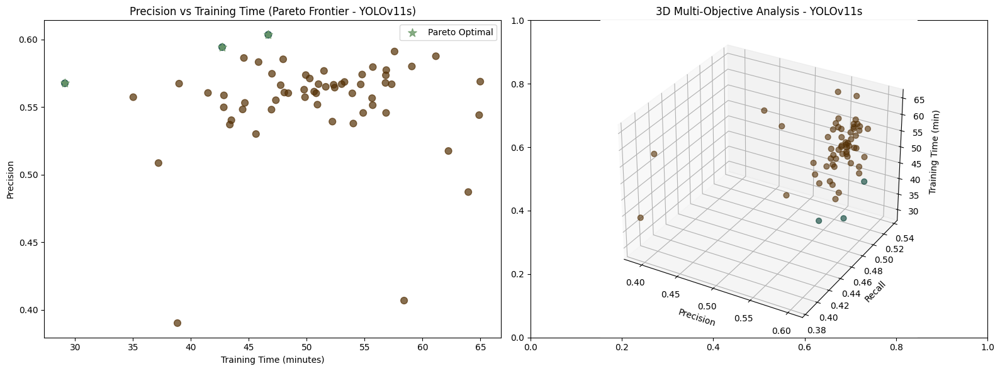


Configurazioni Pareto-ottimali:
    run_code     model  precision  recall  training_time_min optimizer  \
3   21dzzzyu  YOLOv11s     0.6035  0.4206            46.6823      auto   
43  ngdeg8y7  YOLOv11s     0.5943  0.5136            42.7010       SGD   
56  yaleo6rv  YOLOv11s     0.5676  0.5138            29.1152       SGD   

   batch_size  
3          16  
43         16  
56         32  


In [97]:
pareto_model_runs = plot_pareto_analysis(df, objectives=['metrics/precision(B)', 'training_time_min'], model_name='YOLOv11s')

## 12. Dinamiche di Apprendimento Dettagliate

### 12.1 Analisi Deep-Dive per Run Specifici

Esaminiamo in dettaglio le dinamiche interne di apprendimento per i run più performanti, includendo evoluzione delle loss components, learning rate schedule e correlation train-validation.

**Componenti Analizzate:**
- **Loss Components**: Box, Classification, DFL loss separate
- **Learning Rate Schedule**: Evoluzione del tasso di apprendimento
- **Loss Landscape**: Correlazione training-validation loss
- **Training Efficiency**: Tempo per epoca nel corso del training

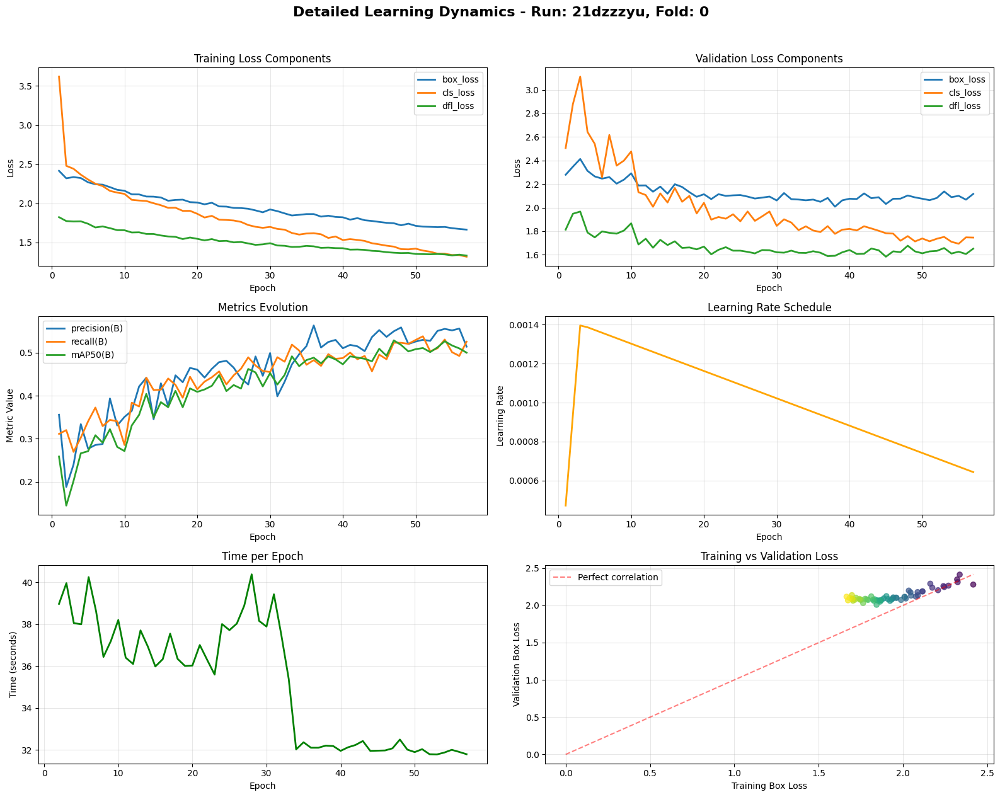

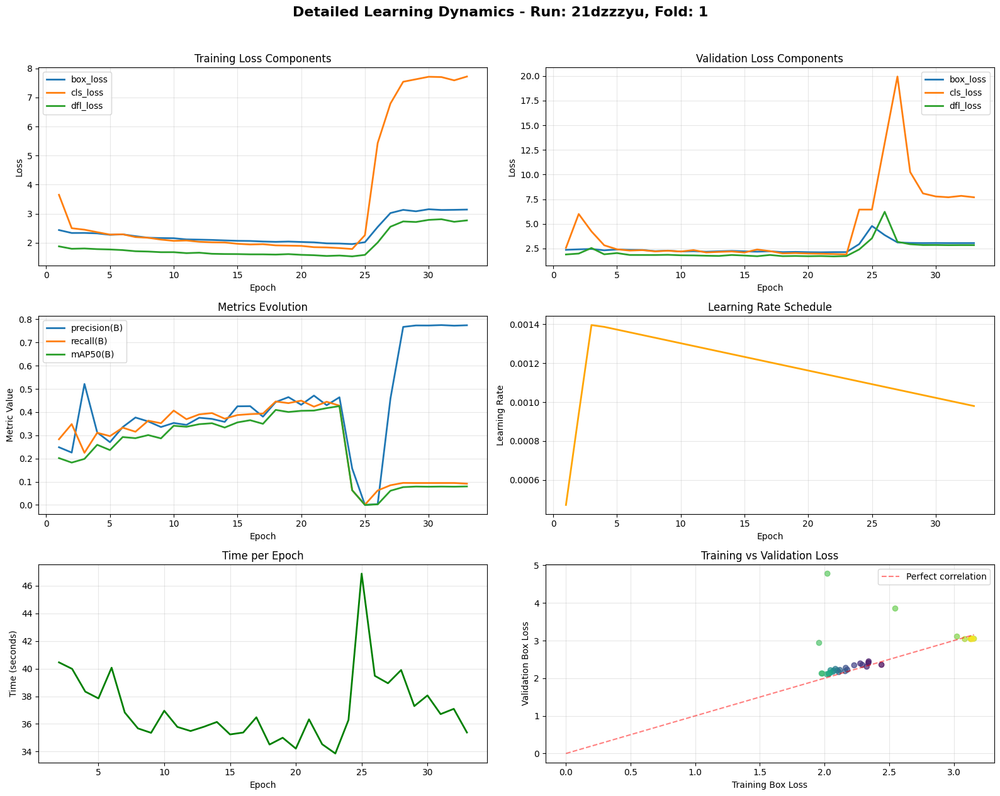

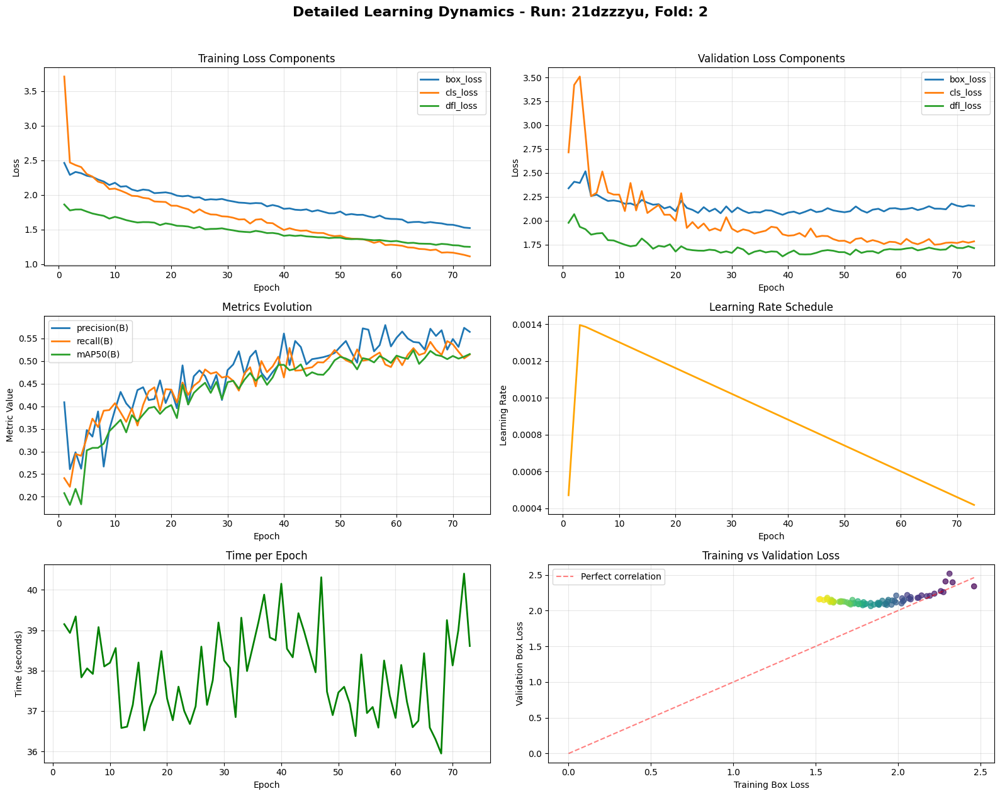

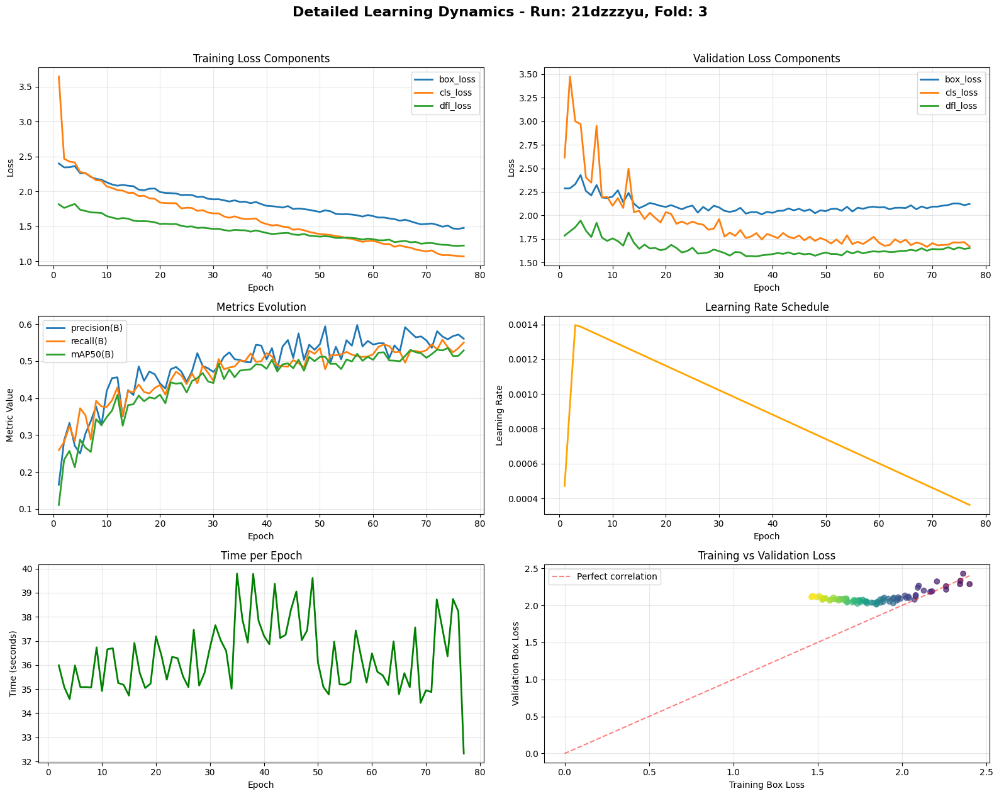

In [ ]:
# =============================================================================
# 5. ANALISI LEARNING CURVES DETTAGLIATA
# =============================================================================

def analyze_learning_dynamics(df, run_code, fold=1):
    """
    Analisi dettagliata delle dinamiche di apprendimento per un run specifico.
    """
    run_data = df[(df['run_code'] == run_code) & (df['fold_number'] == fold)].sort_values('epoch')
    
    if run_data.empty:
        print(f"Nessun dato trovato per run {run_code}, fold {fold}")
        return
    
    fig, axes = plt.subplots(3, 2, figsize=(16, 12))
    
    epochs = run_data['epoch']
    
    # 1. Loss components
    loss_cols = ['train/box_loss', 'train/cls_loss', 'train/dfl_loss']
    for i, col in enumerate(loss_cols):
        if col in run_data.columns:
            axes[0,0].plot(epochs, run_data[col], label=col.split('/')[-1], linewidth=2)
    axes[0,0].set_title('Training Loss Components')
    axes[0,0].set_xlabel('Epoch')
    axes[0,0].set_ylabel('Loss')
    axes[0,0].legend()
    axes[0,0].grid(True, alpha=0.3)
    
    # 2. Validation loss components
    val_loss_cols = ['val/box_loss', 'val/cls_loss', 'val/dfl_loss']
    for i, col in enumerate(val_loss_cols):
        if col in run_data.columns:
            axes[0,1].plot(epochs, run_data[col], label=col.split('/')[-1], linewidth=2)
    axes[0,1].set_title('Validation Loss Components')
    axes[0,1].set_xlabel('Epoch')
    axes[0,1].set_ylabel('Loss')
    axes[0,1].legend()
    axes[0,1].grid(True, alpha=0.3)
    
    # 3. Metrics evolution
    metric_cols = ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)']
    for col in metric_cols:
        if col in run_data.columns:
            axes[1,0].plot(epochs, run_data[col], label=col.split('/')[-1], linewidth=2)
    axes[1,0].set_title('Metrics Evolution')
    axes[1,0].set_xlabel('Epoch')
    axes[1,0].set_ylabel('Metric Value')
    axes[1,0].legend()
    axes[1,0].grid(True, alpha=0.3)
    
    # 4. Learning rate evolution (se disponibile)
    if 'lr/pg0' in run_data.columns:
        axes[1,1].plot(epochs, run_data['lr/pg0'], color='orange', linewidth=2)
        axes[1,1].set_title('Learning Rate Schedule')
        axes[1,1].set_xlabel('Epoch')
        axes[1,1].set_ylabel('Learning Rate')
        axes[1,1].grid(True, alpha=0.3)
    
    # 5. Training dynamics (gradients, se disponibili)
    if 'training_time' in run_data.columns:
        axes[2,0].plot(epochs[1:], run_data['training_time'].iloc[1:], color='green', linewidth=2)
        axes[2,0].set_title('Time per Epoch')
        axes[2,0].set_xlabel('Epoch')
        axes[2,0].set_ylabel('Time (seconds)')
        axes[2,0].grid(True, alpha=0.3)
    
    # 6. Loss landscape (train vs val)
    if 'train/box_loss' in run_data.columns and 'val/box_loss' in run_data.columns:
        axes[2,1].scatter(run_data['train/box_loss'], run_data['val/box_loss'], 
                         c=epochs, cmap='viridis', alpha=0.7)
        axes[2,1].plot([0, run_data['train/box_loss'].max()], 
                      [0, run_data['train/box_loss'].max()], 
                      'r--', alpha=0.5, label='Perfect correlation')
        axes[2,1].set_xlabel('Training Box Loss')
        axes[2,1].set_ylabel('Validation Box Loss')
        axes[2,1].set_title('Training vs Validation Loss')
        axes[2,1].legend()
        axes[2,1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.suptitle(f'Detailed Learning Dynamics - Run: {run_code}, Fold: {fold}', 
                 fontsize=16, y=1.05, fontweight='bold')
    plt.show()

# Analisi per il miglior run in precision
best_run = find_best_run(df, 'metrics/precision(B)')
if best_run:
    analyze_learning_dynamics(df, best_run['run_code'], model='YOLOv11n', fold=0)
    analyze_learning_dynamics(df, best_run['run_code'], model='YOLOv11n', fold=1)
    analyze_learning_dynamics(df, best_run['run_code'], model='YOLOv11n', fold=2)
    analyze_learning_dynamics(df, best_run['run_code'], model='YOLOv11n', fold=3)

## 13. Robustezza Cross-Fold

### 13.1 Analisi della Stabilità tra Fold

Valutiamo quanto le configurazioni siano robuste rispetto alle diverse suddivisioni dei dati, identificando setup che performano consistentemente bene across folds.

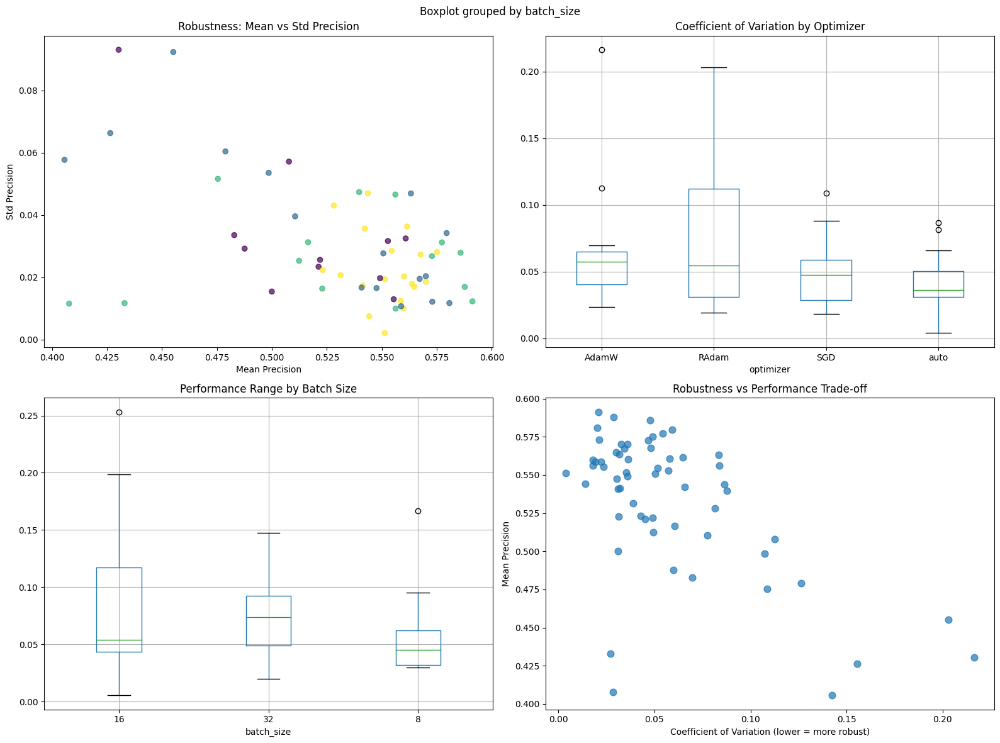

Top 5 configurazioni più robuste per modello YOLOv11n:
    run_code  mean_precision  cv_precision optimizer batch_size
30  hbfwuph9        0.551355      0.003925      auto         16
24  dulugr21        0.544247      0.013837      auto         32
26  ezfoyrtu        0.559893      0.017902      auto         32
17  a4ppq4j8        0.556285      0.017986       SGD         32
28  gthlzv2w        0.558785      0.019244     RAdam          8


In [106]:
# =============================================================================
# 6. ANALISI ROBUSTEZZA CROSS-FOLD - MODEL-SPECIFIC
# =============================================================================

def analyze_cross_fold_robustness(df, model_name=None):
    """
    Analizza la robustezza delle configurazioni attraverso i fold.
    Permette di filtrare i dati per un modello specifico.
    """
    if model_name is not None:
        df = df[df['model'] == model_name].copy()
    
    robustness_analysis = []
    
    for run, group in df.groupby('run_code'):
        fold_performances = []
        for fold, fold_data in group.groupby('fold_number'):
            final_precision = fold_data['metrics/precision(B)'].iloc[-1]
            fold_performances.append(final_precision)
        
        if len(fold_performances) >= 2:
            robustness_analysis.append({
                'run_code': run,
                'model': group['model'].iloc[0],
                'mean_precision': np.mean(fold_performances),
                'std_precision': np.std(fold_performances),
                'cv_precision': np.std(fold_performances) / np.mean(fold_performances),
                'min_precision': np.min(fold_performances),
                'max_precision': np.max(fold_performances),
                'range_precision': np.max(fold_performances) - np.min(fold_performances),
                'optimizer': group['optimizer'].iloc[0],
                'batch_size': group['batch_size'].iloc[0],
                'lr0': group['lr0'].iloc[0]
            })
    
    rob_df = pd.DataFrame(robustness_analysis)
    
    # ---------------------------
    # Visualizzazione
    # ---------------------------
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # Robustezza: Mean vs Std Precision
    axes[0,0].scatter(rob_df['mean_precision'], rob_df['std_precision'], 
                     c=rob_df['optimizer'].astype('category').cat.codes, alpha=0.7)
    axes[0,0].set_xlabel('Mean Precision')
    axes[0,0].set_ylabel('Std Precision')
    axes[0,0].set_title('Robustness: Mean vs Std Precision')
    
    # Coefficiente di variazione per optimizer
    rob_df.boxplot(column='cv_precision', by='optimizer', ax=axes[0,1])
    axes[0,1].set_title('Coefficient of Variation by Optimizer')
    
    # Range delle performance per batch size
    rob_df.boxplot(column='range_precision', by='batch_size', ax=axes[1,0])
    axes[1,0].set_title('Performance Range by Batch Size')
    
    # Scatter Robustness vs Performance
    axes[1,1].scatter(rob_df['cv_precision'], rob_df['mean_precision'], 
                     alpha=0.7, s=60)
    axes[1,1].set_xlabel('Coefficient of Variation (lower = more robust)')
    axes[1,1].set_ylabel('Mean Precision')
    axes[1,1].set_title('Robustness vs Performance Trade-off')
    
    plt.tight_layout()
    plt.show()
    
    # Top configurazioni per robustezza
    print(f"Top 5 configurazioni più robuste per modello {model_name}:")
    print(rob_df.nsmallest(5, 'cv_precision')[['run_code', 'mean_precision', 'cv_precision', 'optimizer', 'batch_size']])
    
    return rob_df

robustness_yolo_df = analyze_cross_fold_robustness(df, model_name='YOLOv11n')

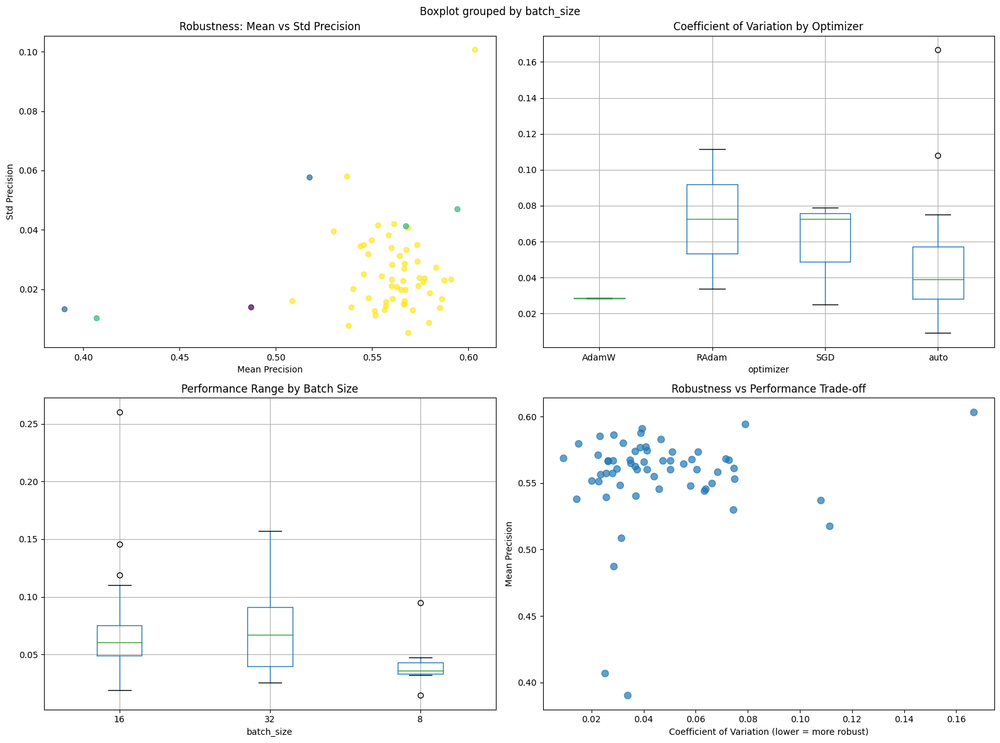

Top 5 configurazioni più robuste per modello YOLOv11s:
    run_code  mean_precision  cv_precision optimizer batch_size
22  ep271vsp        0.568858      0.009197      auto          8
4   2lp7qswl        0.537882      0.014208      auto         16
58  yzna6anl        0.579620      0.014882      auto         16
20  e9v5l6ps        0.551840      0.020127      auto         32
25  f8d5uvbm        0.571170      0.022509      auto          8


In [107]:
robustness_yolo_df = analyze_cross_fold_robustness(df, model_name='YOLOv11s')

## 14. Analisi di Sensibilità (Sensitivity Analysis)

### 14.1 Impatto Marginale degli Iperparametri

Isoliamo l'effetto di singoli iperparametri mantenendo gli altri fissi, per comprendere quali parametri hanno maggiore impatto marginale sulle performance.

**Metodologia:**
- **Configurazione Baseline**: Valori mediani come riferimento
- **Variazione Singola**: Modifica un parametro alla volta
- **Distance Weighting**: Priorità a run più simili alla baseline

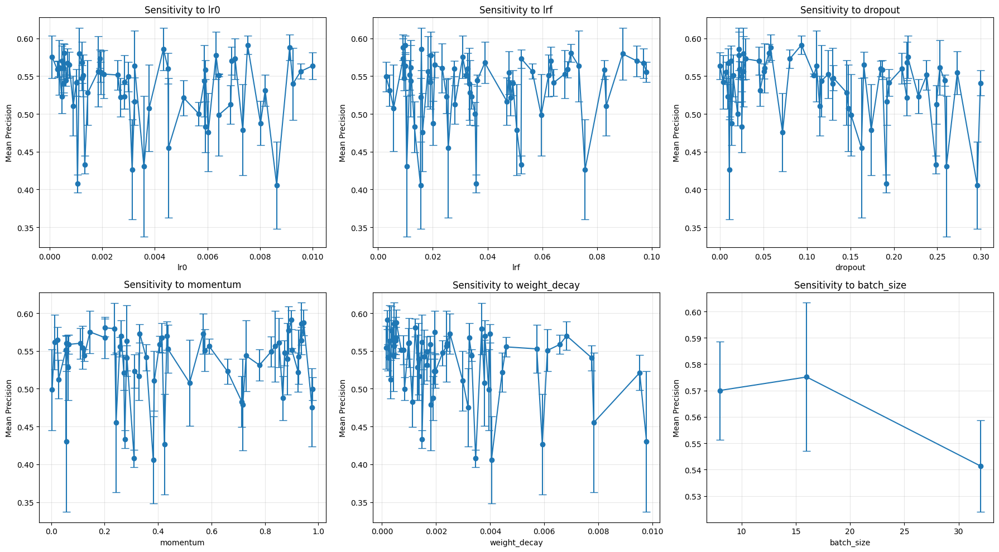

In [105]:
# =============================================================================
# 7. ANALISI SENSITIVITY/ABLATION - MODEL-SPECIFIC
# =============================================================================

def sensitivity_analysis(df, model_name=None, base_config=None, param_ranges=None):
    """
    Analisi di sensibilità per capire l'effetto di singoli iperparametri,
    filtrando il DataFrame per modello specifico.
    """
    if model_name is not None:
        df = df[df['model'] == model_name].copy()
    
    numeric_cols = ['lr0', 'lrf', 'dropout', 'momentum', 'weight_decay', 'batch_size']
    
    # Converti colonne numeriche in float se necessario
    for col in numeric_cols:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors='coerce')

    if base_config is None:
        # Usa configurazione mediana come baseline
        base_config = {}
        for col in numeric_cols:
            if col in df.columns:
                base_config[col] = df[col].median()
        base_config['optimizer'] = df['optimizer'].mode()[0]
    
    sensitivity_results = {}
    
    for param in base_config.keys():
        if param == 'optimizer':
            continue  # Skip categorical for now
            
        param_effects = []
        unique_values = sorted(df[param].dropna().unique())
        
        for value in unique_values:
            subset = df[df[param] == value].copy()
            if subset.empty:
                continue
                
            subset['config_distance'] = 0
            for other_param, base_val in base_config.items():
                if other_param != param and other_param in subset.columns:
                    if other_param == 'optimizer':
                        subset['config_distance'] += (subset[other_param] != base_val).astype(int)
                    else:
                        subset['config_distance'] += np.abs(subset[other_param] - base_val)
            
            closest_runs = subset.nsmallest(5, 'config_distance')['run_code'].unique()
            
            performances = []
            for run in closest_runs:
                run_data = df[df['run_code'] == run]
                for fold, fold_data in run_data.groupby('fold_number'):
                    final_perf = fold_data['metrics/precision(B)'].iloc[-1]
                    performances.append(final_perf)
            
            if performances:
                param_effects.append({
                    'param_value': value,
                    'mean_performance': np.mean(performances),
                    'std_performance': np.std(performances),
                    'n_samples': len(performances)
                })
        
        sensitivity_results[param] = pd.DataFrame(param_effects)
    
    # ---------------------------
    # Visualizzazione
    # ---------------------------
    n_params = len(sensitivity_results)
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()
    
    for i, (param, results) in enumerate(sensitivity_results.items()):
        if i >= len(axes):
            break
        ax = axes[i]
        ax.errorbar(results['param_value'], results['mean_performance'], 
                   yerr=results['std_performance'], marker='o', capsize=5)
        ax.set_xlabel(param)
        ax.set_ylabel('Mean Precision')
        ax.set_title(f'Sensitivity to {param}')
        ax.grid(True, alpha=0.3)
    
    for j in range(len(sensitivity_results), len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    
    return sensitivity_results

# Esempio di utilizzo per modello specifico
sensitivity_results_yolo = sensitivity_analysis(df, model_name='YOLOv11n')

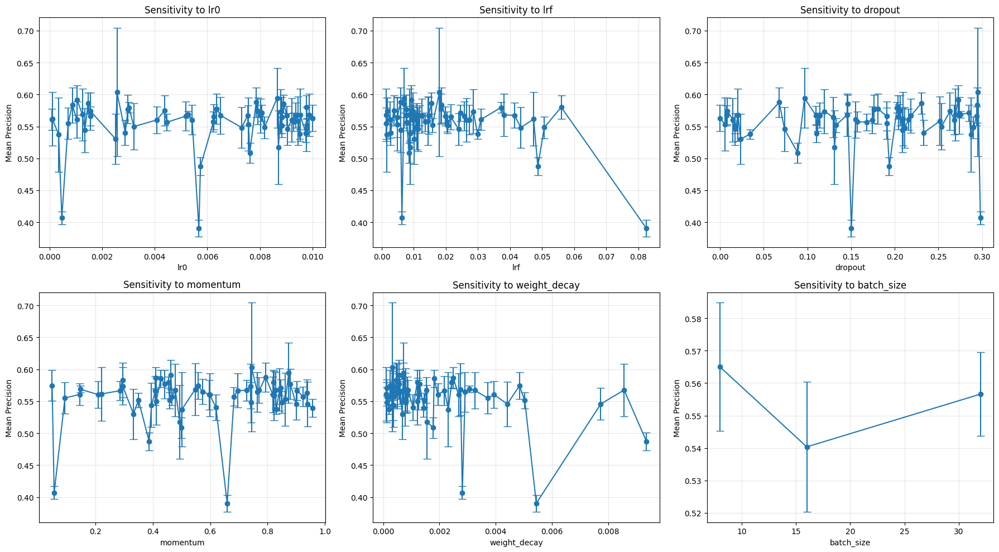

In [108]:
sensitivity_results_yolo = sensitivity_analysis(df, model_name='YOLOv11s')

## 15. Potenziale di Ensemble

### 15.1 Analisi Complementarità tra Modelli

Valutiamo il potenziale di combinare i migliori run in ensemble, analizzando la diversità delle configurazioni e la complementarità delle predizioni.

Top 5 run per precision (model: YOLOv11n):
    run_code     model  mean_precision  mean_recall  mean_map50
32  i9ix6mkd  YOLOv11n        0.591213     0.516787    0.519900
5   2w4k7kdw  YOLOv11n        0.587712     0.501453    0.517908
48  twmck000  YOLOv11n        0.585812     0.509945    0.510537
29  gtkhaheb  YOLOv11n        0.580725     0.468655    0.483677
1   0yfr11kj  YOLOv11n        0.579465     0.486110    0.497563


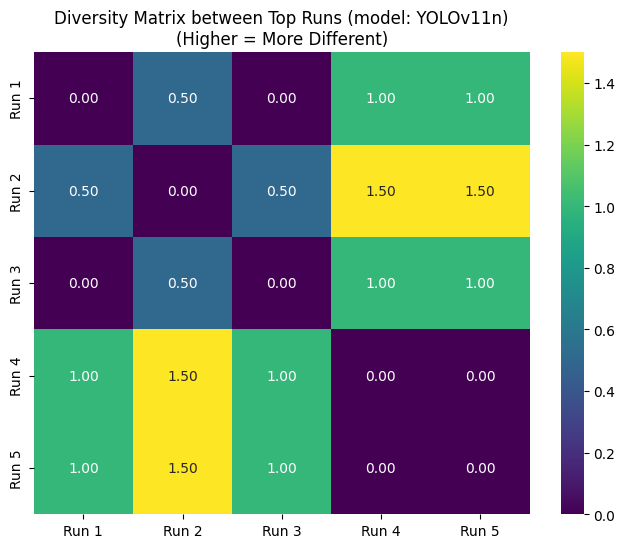

In [110]:
# =============================================================================
# 8. ANALISI ENSEMBLE POTENTIAL - MODEL SPECIFIC
# =============================================================================

def analyze_ensemble_potential(df, top_k=5, model_name=None):
    """
    Analizza il potenziale di ensemble combinando i migliori run.
    Permette di filtrare per modello specifico.
    """
    if model_name is not None:
        df = df[df['model'] == model_name].copy()
    
    # Assicurati che batch_size sia numerico
    df['batch_size'] = df['batch_size'].astype(int)

    # Trova top-k run per precision
    run_performances = []
    for run, group in df.groupby('run_code'):
        fold_perfs = []
        for fold, fold_data in group.groupby('fold_number'):
            final_perf = fold_data['metrics/precision(B)'].iloc[-1]
            fold_perfs.append(final_perf)
        
        if fold_perfs:
            run_performances.append({
                'run_code': run,
                'model': group['model'].iloc[0],
                'mean_precision': np.mean(fold_perfs),
                'mean_recall': np.mean([fold_data['metrics/recall(B)'].iloc[-1] 
                                        for fold, fold_data in group.groupby('fold_number')]),
                'mean_map50': np.mean([fold_data['metrics/mAP50(B)'].iloc[-1] 
                                       for fold, fold_data in group.groupby('fold_number')]),
                'optimizer': group['optimizer'].iloc[0],
                'batch_size': group['batch_size'].iloc[0]
            })
    
    perf_df = pd.DataFrame(run_performances)
    top_runs = perf_df.nlargest(top_k, 'mean_precision')
    
    print(f"Top {top_k} run per precision (model: {model_name}):")
    print(top_runs[['run_code', 'model', 'mean_precision', 'mean_recall', 'mean_map50']])
    
    # Analisi diversità ensemble
    diversity_matrix = np.zeros((top_k, top_k))
    
    for i, run1 in enumerate(top_runs['run_code']):
        for j, run2 in enumerate(top_runs['run_code']):
            if i != j:
                # Calcola diversità basata su configurazione
                config1 = top_runs.iloc[i]
                config2 = top_runs.iloc[j]
                
                diversity = 0
                diversity += (config1['model'] != config2['model'])
                diversity += (config1['optimizer'] != config2['optimizer'])
                diversity += abs(config1['batch_size'] - config2['batch_size']) / max(config1['batch_size'], config2['batch_size'])
                
                diversity_matrix[i, j] = diversity
    
    # Plot diversità
    plt.figure(figsize=(8, 6))
    sns.heatmap(diversity_matrix, annot=True, fmt='.2f', cmap='viridis',
                xticklabels=[f"Run {i+1}" for i in range(top_k)],
                yticklabels=[f"Run {i+1}" for i in range(top_k)])
    plt.title(f'Diversity Matrix between Top Runs (model: {model_name})\n(Higher = More Different)')
    plt.show()
    
    return top_runs, diversity_matrix

# Esempio di utilizzo
top_runs, diversity_matrix = analyze_ensemble_potential(df, top_k=5, model_name='YOLOv11n')

Top 5 run per precision (model: YOLOv11s):
    run_code     model  mean_precision  mean_recall  mean_map50
3   21dzzzyu  YOLOv11s        0.603505     0.420640    0.406205
43  ngdeg8y7  YOLOv11s        0.594335     0.513558    0.524445
42  mww82odu  YOLOv11s        0.591135     0.521610    0.523022
34  j9c0yxin  YOLOv11s        0.587642     0.500295    0.516405
38  komgggw8  YOLOv11s        0.586342     0.514700    0.526115


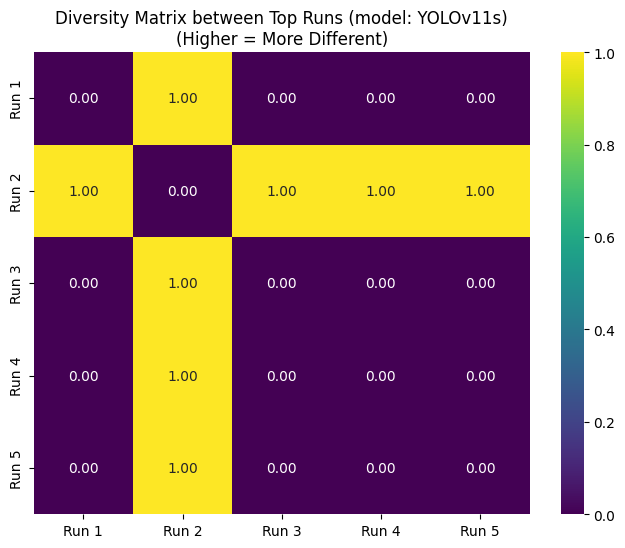

In [111]:
top_runs, diversity_matrix = analyze_ensemble_potential(df, top_k=5, model_name='YOLOv11s')

**Metriche di Diversità:**
- **Diversità Architetturale**: Differenze tra modelli (YOLOv11n vs YOLOv11s)
- **Diversità Iperparametri**: Distanza nelle configurazioni
- **Matrice di Diversità**: Heatmap delle differenze tra top performers

## 17. Stabilità Temporale

### 17.1 Analisi della Convergenza Finale

Esaminiamo la stabilità delle performance negli ultimi epochs per identificare configurazioni che hanno raggiunto vera convergenza vs quelle ancora in miglioramento.

**Indicatori di Stabilità:**
- **Trend Slope**: Direzione del trend negli ultimi epochs
- **Variabilità**: Oscillazioni delle metriche nel final window
- **Convergence Quality**: Qualità della convergenza raggiunta

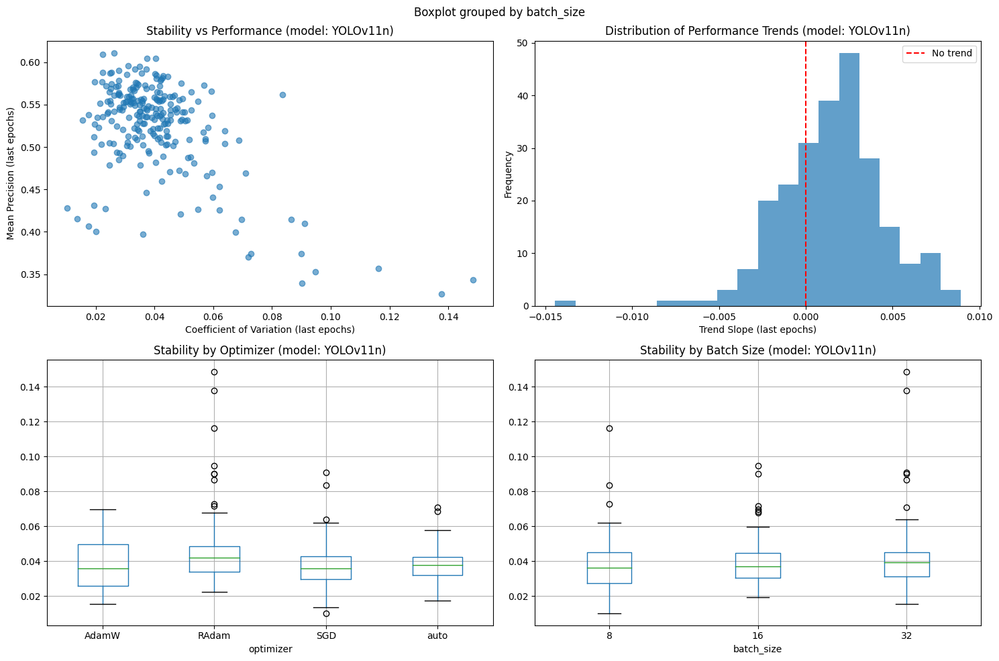

In [113]:
# =============================================================================
# 9. ANALISI TEMPORAL STABILITY - MODEL SPECIFIC
# =============================================================================

def analyze_temporal_stability(df, window_size=10, model_name=None):
    """
    Analizza la stabilità temporale delle performance negli ultimi epochs.
    Permette di filtrare per modello specifico.
    """
    if model_name is not None:
        df = df[df['model'] == model_name].copy()
    
    # Assicurati che batch_size sia numerico
    df['batch_size'] = df['batch_size'].astype(int)
    
    stability_analysis = []
    
    for (run, fold), group in df.groupby(['run_code', 'fold_number']):
        group = group.sort_values('epoch')
        
        if len(group) < window_size * 2:
            continue
        
        # Prendi ultimi window_size epochs
        last_window = group.tail(window_size)
        precision_values = last_window['metrics/precision(B)'].values
        
        # Calcola metriche di stabilità
        stability_metrics = {
            'run_code': run,
            'fold_number': fold,
            'mean_precision': np.mean(precision_values),
            'std_precision': np.std(precision_values),
            'cv_precision': np.std(precision_values) / np.mean(precision_values),
            'trend_slope': np.polyfit(range(len(precision_values)), precision_values, 1)[0],
            'total_epochs': len(group),
            'optimizer': group['optimizer'].iloc[0],
            'batch_size': group['batch_size'].iloc[0]
        }
        
        stability_analysis.append(stability_metrics)
    
    stab_df = pd.DataFrame(stability_analysis)
    
    # ---------------------------
    # Visualizzazione
    # ---------------------------
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Stabilità vs performance
    axes[0,0].scatter(stab_df['cv_precision'], stab_df['mean_precision'], alpha=0.6)
    axes[0,0].set_xlabel('Coefficient of Variation (last epochs)')
    axes[0,0].set_ylabel('Mean Precision (last epochs)')
    axes[0,0].set_title(f'Stability vs Performance (model: {model_name})')
    
    # Trend analysis
    axes[0,1].hist(stab_df['trend_slope'], bins=20, alpha=0.7)
    axes[0,1].set_xlabel('Trend Slope (last epochs)')
    axes[0,1].set_ylabel('Frequency')
    axes[0,1].set_title(f'Distribution of Performance Trends (model: {model_name})')
    axes[0,1].axvline(0, color='red', linestyle='--', label='No trend')
    axes[0,1].legend()
    
    # Stabilità per optimizer
    stab_df.boxplot(column='cv_precision', by='optimizer', ax=axes[1,0])
    axes[1,0].set_title(f'Stability by Optimizer (model: {model_name})')
    
    # Stabilità per batch size
    stab_df.boxplot(column='cv_precision', by='batch_size', ax=axes[1,1])
    axes[1,1].set_title(f'Stability by Batch Size (model: {model_name})')
    
    plt.tight_layout()
    plt.show()
    
    return stab_df

# Esempio di utilizzo
stability_df = analyze_temporal_stability(df, window_size=10, model_name='YOLOv11n')

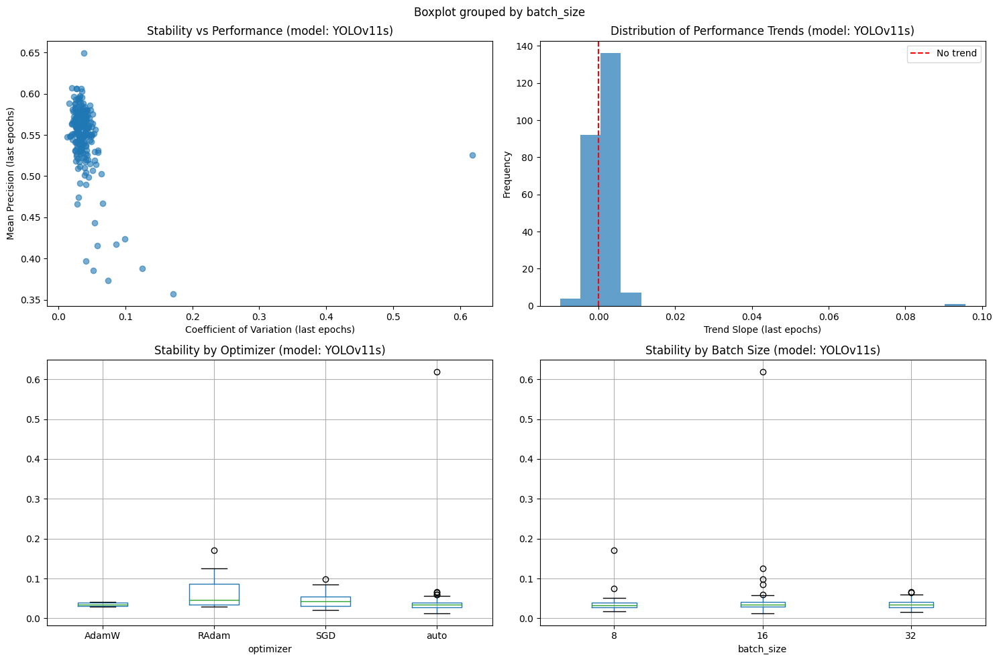

In [114]:
stability_df = analyze_temporal_stability(df, window_size=10, model_name='YOLOv11s')
